# GNN & LLM 모델을 활용한 테마 군집 자동화

#### 이번 대회에서 가장 먼저 떠오르는 의문은 “추천이 가능할까?” 입니다.

투자자들에게 적합한 종목을 추천하기 위해서는 필연적으로 예측(Prediction)이 필요합니다. 하지만 학계와 현업에서 현재까지 다양한 예측 시도가 있었음에도 불구하고 뚜렷한 성과를 내기 어려웠습니다.

또한, 생성형 언어 모델을 사용해 추천받은 종목을 소비자가 실제 투자로 이어지기에는 아직 성능이 부족한 상황입니다. 예를 들어, ChatGPT의 할루시네이션 현상이 이를 잘 보여줍니다.

물론 다양한 생성형 AI를 활용한 추천이 가능할지 모르지만, 매우 어려운 과제라고 판단하여 방향성을 조금 변경해 보았습니다.

따라서 우리 팀은 예측보다는 사용자가 판단하고 선택해야 하는 정보를 최대한 줄여, 간접적으로 투자자들의 수익률을 향상시킬 수 있는 모델을 설계하였습니다.

생성형 AI에는 여러 종류가 존재하지만, 이번 프로젝트에서는 GNN(Graph Neural Network) 모델에 주목하였습니다.

GNN은 노드 간의 엣지 연결을 학습하여, 이를 활용해 시변하는 주식 시장에 대응한 테마를 생성할 수 있다고 생각하였습니다. 

이번 프로젝트에서 ETF만을 사용한 이유는, 전체 자산을 사용하기 위해서는 방대한 양의 데이터가 필요하지만, 사용할 수 있는 데이터에 한계가 있었기 때문입니다.

또한, 한 군집 내에 많은 자산이 포함될 경우, 최종적으로 선택의 문제가 발생할 것으로 판단하였습니다.

### 이를 통해 효율적이고 신뢰할 수 있는 투자 정보를 제공하고자 합니다.


### python 3.10.9

### Assumption
1. 각각의 ETF가 하나의 테마라고 가정합니다.
2. 조회수가 많은 종목들이 핫한 종목이라고 가정합니다. 

In [329]:
import warnings
warnings.filterwarnings('ignore')

## 데이터 로드

In [330]:
import yfinance as yf
import pandas as pd
DIVIDEND = pd.read_csv("NH_CONTEST_DATA_HISTORICAL_DIVIDEND.csv")
SCORE = pd.read_csv("NH_CONTEST_ETF_SOR_IFO.csv")
ETF_Holding = pd.read_csv("NH_CONTEST_DATA_ETF_HOLDINGS.csv",encoding = 'EUC-KR')
CUSTOMER = pd.read_csv("NH_CONTEST_NHDATA_CUS_TP_IFO.csv")
INCOME_Outcome_Flow = pd.read_csv("NH_CONTEST_NHDATA_IFW_OFW_IFO.csv")
DAY_Data = pd.read_csv("NH_CONTEST_NHDATA_STK_DD_IFO.csv",encoding = 'EUC-KR')
STOCK_Explane = pd.read_csv("NH_CONTEST_NW_FC_STK_IEM_IFO.csv",encoding = 'EUC-KR')
OHLCV= pd.read_csv("NH_CONTEST_STK_DT_QUT.csv")
# tck_iem_cd 컬럼에서 앞뒤 공백 제거
CUSTOMER['tck_iem_cd'] = CUSTOMER['tck_iem_cd'].str.strip()
DAY_Data['tck_iem_cd'] = DAY_Data['tck_iem_cd'].str.strip() # white space가 있어서 제거 
OHLCV['tck_iem_cd'] = OHLCV['tck_iem_cd'].str.strip()
DIVIDEND['etf_tck_cd'] = DIVIDEND['etf_tck_cd'].str.strip()
SCORE['etf_iem_cd'] = SCORE['etf_iem_cd'].str.strip() # white space가 있어서 제거 
ETF_Holding['etf_tck_cd'] = ETF_Holding['etf_tck_cd'].str.strip()
INCOME_Outcome_Flow['tck_iem_cd'] = INCOME_Outcome_Flow['tck_iem_cd'].str.strip()
STOCK_Explane['fc_sec_krl_nm'] = STOCK_Explane['fc_sec_krl_nm'].str.strip('  ')
DIVIDEND.columns = DIVIDEND.columns.str.upper() # 데이터 설명 되어있는 내용의 컬럼이 대문자로 되어있어서 빠르게 작업하기 위해 대문자로 변경 
SCORE.columns = SCORE.columns.str.upper()
ETF_Holding.columns = ETF_Holding.columns.str.upper()
CUSTOMER.columns = CUSTOMER.columns.str.upper()
INCOME_Outcome_Flow.columns = INCOME_Outcome_Flow.columns.str.upper()
DAY_Data.columns = DAY_Data.columns.str.upper()
STOCK_Explane.columns = STOCK_Explane.columns.str.upper()
OHLCV.columns = OHLCV.columns.str.upper()

In [331]:
OHLCV['BSE_DT'].unique()

array([20240610, 20240807, 20240815, 20240731, 20240716, 20240813,
       20240724, 20240708, 20240812, 20240702, 20240620, 20240612,
       20240725, 20240606, 20240715, 20240617, 20240613, 20240607,
       20240711, 20240710, 20240717, 20240723, 20240626, 20240705,
       20240826, 20240614, 20240618, 20240729, 20240621, 20240604,
       20240530, 20240628, 20240625, 20240816, 20240611, 20240605,
       20240603, 20240823, 20240528, 20240806, 20240801, 20240726,
       20240808, 20240709, 20240814, 20240819, 20240624, 20240719,
       20240821, 20240701, 20240820, 20240802, 20240627, 20240822,
       20240718, 20240805, 20240722, 20240730, 20240531, 20240712,
       20240703, 20240529, 20240809])

In [332]:
DIVIDEND.isna().sum()

ETF_TCK_CD          0
EDIV_DT             0
DDN_AMT             0
AED_STKP_DDN_AMT    0
DDN_BSE_DT          0
DDN_PYM_DT          0
PBA_DT              0
DDN_PYM_FCY_CD      0
dtype: int64

In [333]:
DIVIDEND

,ETF_TCK_CD,EDIV_DT,DDN_AMT,AED_STKP_DDN_AMT,DDN_BSE_DT,DDN_PYM_DT,PBA_DT,DDN_PYM_FCY_CD
0,A,20221003,0.210,0.210,20221004,20221026,20220921,Quarterly
1,A,20240702,0.236,0.236,20240702,20240724,20240522,Quarterly
2,A,20231002,0.225,0.225,20231003,20231025,20230920,Quarterly
3,A,20221230,0.225,0.225,20230103,20230125,20221116,Quarterly
4,A,20240401,0.236,0.236,20240402,20240424,20240221,Quarterly
...,...,...,...,...,...,...,...,...
23213,ZTR,20240209,0.050,0.050,20240212,20240228,20231116,Monthly
23214,ZTR,20231011,0.050,0.050,20231012,20231024,20230831,Monthly
23215,ZTR,20231208,0.050,0.050,20231211,20231219,20231116,Monthly
23216,ZTR,20230609,0.080,0.080,20230612,20230623,20230525,Monthly


In [334]:
etf_ticker = STOCK_Explane[STOCK_Explane['STK_ETF_DIT_CD'] == 'ETF']['TCK_IEM_CD'].unique()
etf_descriptions =  STOCK_Explane[STOCK_Explane['STK_ETF_DIT_CD'] == 'ETF'][['FC_SEC_KRL_NM','TCK_IEM_CD']]

In [335]:
score_etf = SCORE['ETF_IEM_CD'].str.strip().unique()
SCORE.pivot(index='BSE_DT',columns='ETF_IEM_CD',values='ETF_SOR')

OHLCV[OHLCV['TCK_IEM_CD'].isin(score_etf)]['ACL_TRD_QTY'].mean()
OHLCV[~OHLCV['TCK_IEM_CD'].isin(score_etf)]['TCK_IEM_CD'].unique()


len(etf_ticker)
ohlcv_etf = OHLCV['TCK_IEM_CD'].unique()[pd.Series(OHLCV['TCK_IEM_CD'].unique()).isin(etf_ticker)]
print(len(ohlcv_etf))
day_etf = DAY_Data['TCK_IEM_CD'].unique()[pd.Series(DAY_Data['TCK_IEM_CD'].unique()).isin(ohlcv_etf)]
print(len(day_etf))
flow_etf = INCOME_Outcome_Flow['TCK_IEM_CD'].unique()[pd.Series(INCOME_Outcome_Flow['TCK_IEM_CD'].unique()).isin(day_etf)]
print(len(flow_etf))
custom_etf = CUSTOMER['TCK_IEM_CD'].unique()[pd.Series(CUSTOMER['TCK_IEM_CD'].unique()).isin(flow_etf)]
print(len(custom_etf))
score_etf = SCORE['ETF_IEM_CD'].unique()[pd.Series(SCORE['ETF_IEM_CD'].unique()).isin(custom_etf)]
print(len(score_etf))
holding_etf = ETF_Holding['ETF_TCK_CD'].unique()[pd.Series(ETF_Holding['ETF_TCK_CD'].unique()).isin(score_etf)]
print(len(holding_etf))
divi_etf = DIVIDEND['ETF_TCK_CD'].unique()[pd.Series(DIVIDEND['ETF_TCK_CD'].unique()).isin(holding_etf)]
print(len(divi_etf))


1126
443
351
351
117
106
104


In [336]:
ETF_OHLCV = OHLCV[OHLCV['TCK_IEM_CD'].isin(divi_etf)]
ETF_OHLCV_pivot_close = ETF_OHLCV.pivot(index='BSE_DT',columns='TCK_IEM_CD',values='IEM_END_PR')
ETF_OHLCV_pivot_return = ETF_OHLCV.pivot(index='BSE_DT',columns='TCK_IEM_CD',values='BF_DD_CMP_IND_RT')*0.01
# etf데이터만 추출하고 종가로 테이블의 원소를 체움
Nan_count = ETF_OHLCV_pivot_return.isna().sum().sum()
print(f'ETF_OHLCV_pivot_return 데이터에 결측치는 {Nan_count}개 이다')

ETF_OHLCV_pivot_return 데이터에 결측치는 13개 이다


YMAG 지우기


In [337]:
divi_etf = divi_etf[divi_etf != 'YMAG']

In [338]:
## 결측치도 존재하고 추가적으로 데이터 길이가 너무 짧기에 yahoo finance에서 데이터를 들고온다.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import yfinance as yf

# 데이터 다운로드
data = yf.download(divi_etf.tolist(), start="2024-01-01", end="2024-09-01")
daily_data = pd.DataFrame(data["Adj Close"])



[*********************100%***********************]  103 of 103 completed


In [339]:
daily_data_drop = daily_data.dropna(axis=1)


In [340]:
daily_data_drop

Ticker,AWAY,CIBR,COWZ,DGRO,DGRW,DIA,DIV,DIVB,DIVO,DVY,...,XLC,XLF,XLG,XLI,XLK,XLP,XLU,XLV,XLY,XSD
Date,,,,,,,,,,,,,,,,,,,,,
2024-01-02 00:00:00+00:00,18.862103,52.375034,51.535984,53.071957,69.329712,371.852295,16.374130,40.386192,35.208054,115.187096,...,71.647522,37.334595,37.173946,111.744415,186.468323,71.386482,62.788368,137.229141,176.022293,217.813507
2024-01-03 00:00:00+00:00,18.662712,51.636372,51.289497,52.786839,68.865410,369.012268,16.260424,40.042942,35.035133,114.136314,...,71.379784,37.018204,36.985092,110.080727,184.568237,70.827858,63.022903,137.001694,172.465103,211.184341
2024-01-04 00:00:00+00:00,18.792316,51.366859,50.895107,52.757339,68.717216,369.337677,16.213043,39.931137,35.102371,114.165497,...,71.141769,37.166515,36.786297,110.219368,183.215286,70.729851,62.827461,137.684006,171.252884,207.530319
2024-01-05 00:00:00+00:00,18.842161,51.287006,51.082447,52.777004,68.756729,369.436340,16.288851,40.042942,34.996704,114.856300,...,71.439270,37.324715,36.865818,110.348106,183.165543,70.573051,63.061993,137.565338,171.521133,208.059464
2024-01-08 00:00:00+00:00,19.171154,52.355068,51.368370,53.180107,69.468010,371.605743,16.412035,40.346966,35.179234,115.644379,...,72.549934,37.562008,37.501953,111.071022,187.761597,71.092476,63.521301,138.781586,174.442413,214.638702
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-08-26 00:00:00+00:00,18.760000,58.809082,57.320179,61.124901,81.269135,411.105957,18.075020,47.184727,39.819450,131.192932,...,87.434624,44.408939,46.435131,128.722076,220.753464,81.984329,75.399071,154.792664,186.026169,234.348480
2024-08-27 00:00:00+00:00,19.038000,59.129021,57.160873,61.124901,81.393814,411.275299,18.065199,47.164875,39.770050,130.698639,...,87.235237,44.638107,46.475060,128.801819,222.091080,82.183273,74.803101,155.031769,185.537170,235.897339
2024-08-28 00:00:00+00:00,18.750000,58.559128,56.961739,61.015606,81.024796,409.731354,18.016111,47.085472,39.770050,130.846924,...,86.656990,44.747711,46.115715,128.742004,219.026566,81.835121,74.803101,155.211090,183.740875,232.949493


## 데이터를 통해 소비자 분석

소비자들이 테마라는 것에 어떻게 반응하는 지 확인해봅니다. 

조회수가 많은 종목들이 핫한 종목이라고 가정합니다.


### 조회수와 거래수량 관계가 있을까?(주간)

In [341]:
Day_VW_CNT_df = DAY_Data[DAY_Data['TCK_IEM_CD'].isin(divi_etf)].pivot(index='BSE_DT',columns='TCK_IEM_CD',values='VW_TGT_CNT').backfill()
Day_VW_CNT_df.index = pd.to_datetime(Day_VW_CNT_df.index.astype(str), format='%Y%m%d') # 얼마나 봤는가?
# Day_VW_CNT_df = Day_VW_CNT_df.pct_change().dropna()
Day_VW_CNT_df=Day_VW_CNT_df.resample('W').mean()
OHLCV_BYN_CNS_SUM_QTY_df = OHLCV[OHLCV['TCK_IEM_CD'].isin(divi_etf)].pivot(index='BSE_DT',columns='TCK_IEM_CD',values='ACL_TRD_QTY').backfill()
OHLCV_BYN_CNS_SUM_QTY_df.index = pd.to_datetime(OHLCV_BYN_CNS_SUM_QTY_df.index.astype(str), format='%Y%m%d') #얼마나 사는가?
OHLCV_BYN_CNS_SUM_QTY_df = OHLCV_BYN_CNS_SUM_QTY_df.resample('W').mean() # 단기간에 바로 투자로 적용 안될 수 도 있으니 주간으로 바꿈

In [342]:
Day_VW_CNT_df.head()

TCK_IEM_CD,AWAY,CIBR,COWZ,DGRO,DGRW,DIA,DIV,DIVB,DIVO,DVY,...,XLC,XLF,XLG,XLI,XLK,XLP,XLU,XLV,XLY,XSD
BSE_DT,,,,,,,,,,,,,,,,,,,,,
2024-06-02,8.25,70.00,21.5,173.50,141.5,341.25,9.00,6.25,94.75,43.0,...,16.75,46.50,39.25,15.25,147.5,39.00,149.25,171.00,19.0,5.25
2024-06-09,5.50,69.25,23.5,151.25,97.5,298.00,11.75,11.00,123.00,29.0,...,14.25,52.75,55.00,14.75,101.0,43.25,110.75,131.75,14.0,2.75
2024-06-16,7.80,130.60,14.0,148.20,123.8,310.20,6.80,6.40,105.60,11.0,...,11.20,55.20,33.00,15.40,143.8,52.80,101.60,166.60,18.2,4.00
2024-06-23,8.80,65.60,17.0,113.20,167.4,248.40,5.40,9.20,78.80,11.0,...,20.60,46.00,34.20,19.00,408.6,48.40,189.00,148.00,17.6,4.80
2024-06-30,10.60,81.80,17.4,160.00,255.2,240.60,7.40,32.00,92.20,15.0,...,13.60,74.40,41.40,16.40,281.8,51.60,146.60,169.40,23.8,7.00


In [343]:
columns_with_zero = Day_VW_CNT_df.columns[(Day_VW_CNT_df == 0).any()].tolist()
print("0값이 존재하는 컬럼:", columns_with_zero)

0값이 존재하는 컬럼: ['MGC', 'VOX']


In [344]:
# Day_VW_CNT_df = Day_VW_CNT_df.drop(columns=columns_with_zero)
# OHLCV_BYN_CNS_SUM_QTY_df = OHLCV_BYN_CNS_SUM_QTY_df.drop(columns = columns_with_zero)

In [345]:
for column in Day_VW_CNT_df.columns:
    if (Day_VW_CNT_df[column] == 0).any():  # 0값이 존재하는 경우
        col_mean = Day_VW_CNT_df[column].replace(0, np.nan).mean()  # 0을 NaN으로 바꾼 후 평균 계산
        Day_VW_CNT_df[column] = Day_VW_CNT_df[column].replace(0, col_mean)

In [346]:
OHLCV_BYN_CNS_SUM_QTY_df=OHLCV_BYN_CNS_SUM_QTY_df.pct_change().dropna().values.flatten()
Day_VW_CNT_df=Day_VW_CNT_df.pct_change().dropna().values.flatten()

In [347]:
# 독립 변수에 상수항 추가
import statsmodels.api as sm
def t_test(x,y):
    X = sm.add_constant(x)

    # 종속 변수
    Y = y

    # OLS 모델 적합
    model = sm.OLS(Y, X).fit()

    # 결과 출력
    print(model.summary())

    # 회귀 계수의 p-value 추출
    p_values = model.pvalues
    print("\n회귀 계수의 p-value:")
    print(p_values)

    # 특정 계수의 p-value 출력
    p_value_X = p_values[1]
    print(f"독립 변수 X의 p-value: {p_value_X}")

    # p-value 해석
    alpha = 0.05  # 유의수준

    if p_value_X < alpha:
        print(f"\n독립 변수 X의 p-value가 {alpha}보다 작으므로 통계적으로 유의합니다.")
    else:
        print(f"\n독립 변수 X의 p-value가 {alpha}보다 크므로 통계적으로 유의하지 않습니다.")


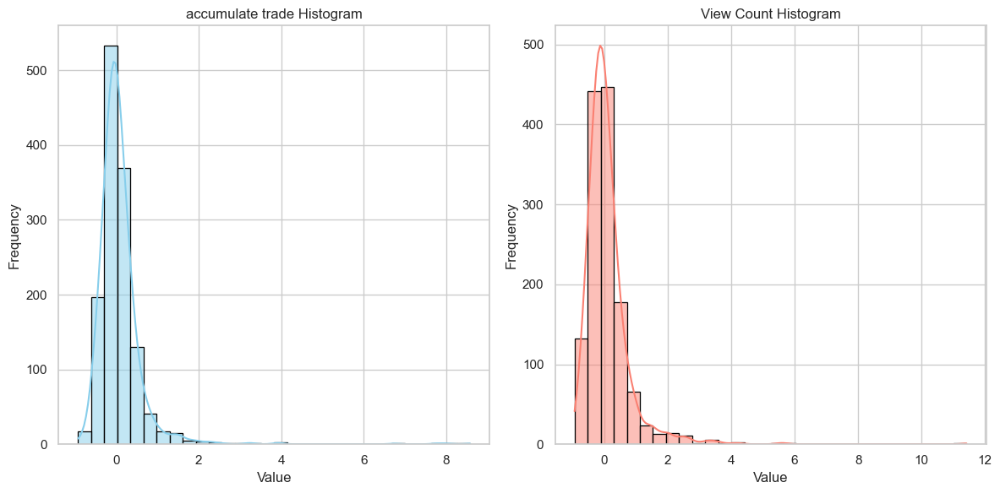

In [348]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

series1 = OHLCV_BYN_CNS_SUM_QTY_df
series2 = Day_VW_CNT_df

# 시각화 스타일 설정
sns.set(style='whitegrid')

# 그래프 크기 설정
plt.figure(figsize=(12, 6))

# 첫 번째 히스토그램
plt.subplot(1, 2, 1)
sns.histplot(series1, bins=30, kde=True, color='skyblue', edgecolor='black')
plt.title('accumulate trade Histogram')
plt.xlabel('Value')
plt.ylabel('Frequency')

# 두 번째 히스토그램
plt.subplot(1, 2, 2)
sns.histplot(series2, bins=30, kde=True, color='salmon', edgecolor='black')
plt.title('View Count Histogram')
plt.xlabel('Value')
plt.ylabel('Frequency')

# 레이아웃 조정
plt.tight_layout()

# 그래프 표시
plt.show()

In [349]:
t_test(Day_VW_CNT_df,OHLCV_BYN_CNS_SUM_QTY_df)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     14.39
Date:                Sun, 17 Nov 2024   Prob (F-statistic):           0.000155
Time:                        01:45:01   Log-Likelihood:                -1249.4
No. Observations:                1339   AIC:                             2503.
Df Residuals:                    1337   BIC:                             2513.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0723      0.017      4.259      0.0

소비자들이 많이 조회한 종목과 거래량은 통계적으로 유의미한 관계가 존재합니다. 

즉 테마라는 것이 소비자들을 유인하기 충분하다는 것입니다. 

그렇다면 많이 조회한 종목과 수익률은 관계가 존재할까?

### 거래량과 수익률이 관계가 있을까?

In [350]:
Day_VW_CNT_df = DAY_Data[DAY_Data['TCK_IEM_CD'].isin(divi_etf)].pivot(index='BSE_DT',columns='TCK_IEM_CD',values='VW_TGT_CNT').backfill()
Day_VW_CNT_df.index = pd.to_datetime(Day_VW_CNT_df.index.astype(str), format='%Y%m%d') # 얼마나 샀는가
# Day_VW_CNT_df = Day_VW_CNT_df.pct_change().dropna()
Day_VW_CNT_df=Day_VW_CNT_df.resample('W').mean()
OHLCV_BF_DD_CMP_IND_RT_df = OHLCV[OHLCV['TCK_IEM_CD'].isin(divi_etf)].pivot(index='BSE_DT',columns='TCK_IEM_CD',values='BF_DD_CMP_IND_RT').backfill()
OHLCV_BF_DD_CMP_IND_RT_df.index = pd.to_datetime(OHLCV_BF_DD_CMP_IND_RT_df.index.astype(str), format='%Y%m%d') #얼마나 사는가?
OHLCV_BF_DD_CMP_IND_RT_df = OHLCV_BF_DD_CMP_IND_RT_df.resample('W').mean() # 단기간에 바로 투자로 적용 안될 수 도 있으니 주간으로 바꿈

In [351]:
OHLCV_BYN_CNS_SUM_QTY_df

array([-0.38470218, -0.1184535 ,  0.01374331, ..., -0.08241674,
       -0.37761768, -0.45572895])

In [352]:
columns_with_zero = OHLCV_BF_DD_CMP_IND_RT_df.columns[(OHLCV_BF_DD_CMP_IND_RT_df == 0).any()].tolist()
print("0값이 존재하는 컬럼:", columns_with_zero)

0값이 존재하는 컬럼: ['ESGU', 'IBBQ', 'IWO']


In [353]:
for column in Day_VW_CNT_df.columns:
    if (Day_VW_CNT_df[column] == 0).any():  # 0값이 존재하는 경우
        col_mean = Day_VW_CNT_df[column].replace(0, np.nan).mean()  # 0을 NaN으로 바꾼 후 평균 계산
        Day_VW_CNT_df[column] = Day_VW_CNT_df[column].replace(0, col_mean)

In [354]:
OHLCV_BF_DD_CMP_IND_RT_df=OHLCV_BF_DD_CMP_IND_RT_df.iloc[1:,:].values.flatten() # 이미 수익률임으로 pct처리를 하지 않고 그냥 들고오되 길이를 맞추고자 처음 행 날림
Day_VW_CNT_df=Day_VW_CNT_df.pct_change().dropna().values.flatten()

In [355]:
t_test(OHLCV_BYN_CNS_SUM_QTY_df,OHLCV_BF_DD_CMP_IND_RT_df)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.631
Date:                Sun, 17 Nov 2024   Prob (F-statistic):              0.202
Time:                        01:45:04   Log-Likelihood:                -1094.3
No. Observations:                1339   AIC:                             2193.
Df Residuals:                    1337   BIC:                             2203.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0948      0.015      6.276      0.0

소비자들의 관심을 갖는 투자 상품들은 수익률과 전혀 상관이 없습니다.

### 일간과 격일간의 조회수와 매수량은 어떨까?

In [356]:
Day_VW_CNT_df = DAY_Data[DAY_Data['TCK_IEM_CD'].isin(divi_etf)].pivot(index='BSE_DT',columns='TCK_IEM_CD',values='VW_TGT_CNT').backfill()
Day_VW_CNT_df.index = pd.to_datetime(Day_VW_CNT_df.index.astype(str), format='%Y%m%d') # 얼마나 봤는가?
# Day_VW_CNT_df = Day_VW_CNT_df.pct_change().dropna()
Day_VW_CNT_df=Day_VW_CNT_df.rolling(1).mean().replace(0,Day_VW_CNT_df.mean())
OHLCV_BF_DD_CMP_IND_RT_df = OHLCV[OHLCV['TCK_IEM_CD'].isin(divi_etf)].pivot(index='BSE_DT',columns='TCK_IEM_CD',values='ACL_TRD_QTY').backfill()
OHLCV_BF_DD_CMP_IND_RT_df.index = pd.to_datetime(OHLCV_BF_DD_CMP_IND_RT_df.index.astype(str), format='%Y%m%d') #얼마나 사는가?
OHLCV_BF_DD_CMP_IND_RT_df = OHLCV_BF_DD_CMP_IND_RT_df.rolling(1).mean().replace(0,Day_VW_CNT_df.mean()) 
OHLCV_BF_DD_CMP_IND_RT_df=OHLCV_BF_DD_CMP_IND_RT_df.pct_change().dropna().values.flatten() # 이미 수익률임으로 pct처리를 하지 않고 그냥 들고오되 길이를 맞추고자 처음 행 날림
Day_VW_CNT_df=Day_VW_CNT_df.pct_change().dropna().iloc[:-1,:].values.flatten()

In [357]:
t_test(Day_VW_CNT_df,OHLCV_BF_DD_CMP_IND_RT_df)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.8088
Date:                Sun, 17 Nov 2024   Prob (F-statistic):              0.369
Time:                        01:45:06   Log-Likelihood:                -14623.
No. Observations:                6386   AIC:                         2.925e+04
Df Residuals:                    6384   BIC:                         2.926e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1911      0.031      6.250      0.0

하루간의 관계로 보았을때는 p-value가 상당히 높게 나옵니다. 

In [358]:
Day_VW_CNT_df = DAY_Data[DAY_Data['TCK_IEM_CD'].isin(divi_etf)].pivot(index='BSE_DT',columns='TCK_IEM_CD',values='VW_TGT_CNT').backfill()
Day_VW_CNT_df.index = pd.to_datetime(Day_VW_CNT_df.index.astype(str), format='%Y%m%d') # 얼마나 봤는가?
# Day_VW_CNT_df = Day_VW_CNT_df.pct_change().dropna()
Day_VW_CNT_df=Day_VW_CNT_df.rolling(3).mean().replace(0,Day_VW_CNT_df.mean())
OHLCV_BF_DD_CMP_IND_RT_df = OHLCV[OHLCV['TCK_IEM_CD'].isin(divi_etf)].pivot(index='BSE_DT',columns='TCK_IEM_CD',values='ACL_TRD_QTY').backfill()
OHLCV_BF_DD_CMP_IND_RT_df.index = pd.to_datetime(OHLCV_BF_DD_CMP_IND_RT_df.index.astype(str), format='%Y%m%d') #얼마나 사는가?
OHLCV_BF_DD_CMP_IND_RT_df = OHLCV_BF_DD_CMP_IND_RT_df.rolling(3).mean().replace(0,Day_VW_CNT_df.mean()) 
OHLCV_BF_DD_CMP_IND_RT_df=OHLCV_BF_DD_CMP_IND_RT_df.pct_change().dropna().values.flatten() # 이미 수익률임으로 pct처리를 하지 않고 그냥 들고오되 길이를 맞추고자 처음 행 날림
Day_VW_CNT_df=Day_VW_CNT_df.pct_change().dropna().iloc[:-1,:].values.flatten()

In [359]:
t_test(Day_VW_CNT_df,OHLCV_BF_DD_CMP_IND_RT_df)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     10.62
Date:                Sun, 17 Nov 2024   Prob (F-statistic):            0.00112
Time:                        01:45:07   Log-Likelihood:                -2758.5
No. Observations:                6180   AIC:                             5521.
Df Residuals:                    6178   BIC:                             5535.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0288      0.005      5.943      0.0

특이하게 3일간의 데이터로 보았을 때는 유의미한 관계가 도출되었습니다. 

즉 투자자들은 관심을 갖는 종목을 단기간에 결정하는 결과로 이루어지는 경향이 있다고 판단 할 수 있습니다.

### ANOVA 검증을 통해 ETF간에 독립성이 존재하는지 확인해본다.

In [360]:
OHLCV_BF_DD_CMP_IND_RT_df = OHLCV[OHLCV['TCK_IEM_CD'].isin(divi_etf)].pivot(index='BSE_DT',columns='TCK_IEM_CD',values='BF_DD_CMP_IND_RT').backfill()
from scipy import stats
def df_ANONVA(cluster_return):
    group_data = [cluster_return[col].dropna() for col in cluster_return.columns]
    group_names = cluster_return.columns.tolist()
    # ANOVA 검정 수행
   
    if len(group_data) != 1:
        f_stat, p_value = stats.f_oneway(*group_data)

        print('ANOVA 검정 결과:')
        print(f'F-통계량: {f_stat:.4f}, p-값: {p_value:.4f}')

        # 결과 해석
        if p_value < 0.05:
            print('그룹 간 평균에 유의한 차이가 있습니다.')
        else:
            print('그룹 간 평균에 유의한 차이가 없습니다.')
    else:
        pass
df_ANONVA(OHLCV_BF_DD_CMP_IND_RT_df) 






ANOVA 검정 결과:
F-통계량: 0.1498, p-값: 1.0000
그룹 간 평균에 유의한 차이가 없습니다.


=> 결론적으로 ETF간에 묶일 여지가 존재합니다. 
추가적으로 투자를 잘하는 그룹과 그렇지 않는 그룹을 비교해서 확인 해보았으며, 
투자자를 얼만큼 동적으로 하는지 하기위해 자산들의 투자비중간에 var를 계산하였습니다.

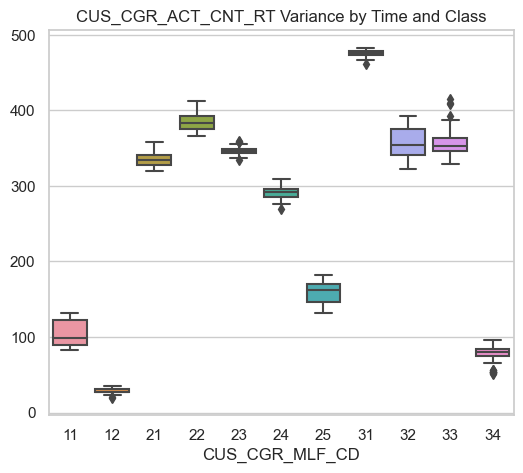

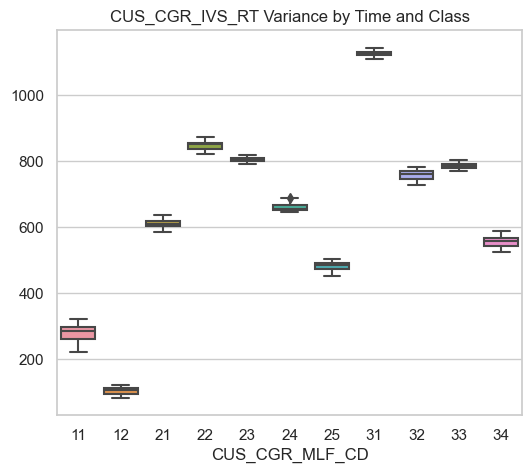

In [361]:
CUSTOMER['BSE_DT'] = pd.to_datetime(CUSTOMER['BSE_DT'], format='%Y%m%d')

# 날짜(BSE_DT)와 중간 분류 코드(CUS_CGR_MLF_CD)로 그룹화
grouped_by_time_and_class = CUSTOMER.groupby(['BSE_DT', 'CUS_CGR_MLF_CD'])

# 계좌수 비율(CUS_CGR_ACT_CNT_RT)의 분산 계산
account_ratio_var_by_time_and_class = grouped_by_time_and_class['CUS_CGR_ACT_CNT_RT'].var().unstack()

# 투자 비율(CUS_CGR_IVS_RT)의 분산 계산
investment_ratio_var_by_time_and_class = grouped_by_time_and_class['CUS_CGR_IVS_RT'].var().unstack()

import matplotlib.pyplot as plt
import seaborn as sns

# 계좌수 비율(CUS_CGR_ACT_CNT_RT)의 분산 계산 boxplot
plt.figure(figsize=(6, 5))
sns.boxplot(account_ratio_var_by_time_and_class)
plt.title("CUS_CGR_ACT_CNT_RT Variance by Time and Class")  # 타이틀 추가
plt.show()

# 투자 비율(CUS_CGR_IVS_RT)의 분산 계산 boxplot
plt.figure(figsize=(6, 5))
sns.boxplot(investment_ratio_var_by_time_and_class)
plt.title("CUS_CGR_IVS_RT Variance by Time and Class")  # 타이틀 추가
plt.show()

결론적으로 투자를 잘하는 그룹(11)은 많은 투자비중을 변경하는 것을 확인할 수 있습니다. => 과감한 투자

이를통해 시장이 빠르게 변하고 해당 시장에 대응하는 것이 굉장히 중요하다고 판단하였습니다. 


### 그룹을 잘 묶는 것만으로도 유의미한 결과가 도출될까?
각 ETF를 선택할때 항상 최선의 선택을 하는 것은 굉장히 어렵습니다.
하지만 최선의 선택이 아니더라도 꽤 괜찮은 선택(상위 20%중 랜덤으로 선택) 하는것은 수익률이 나쁘지 않습니다. 

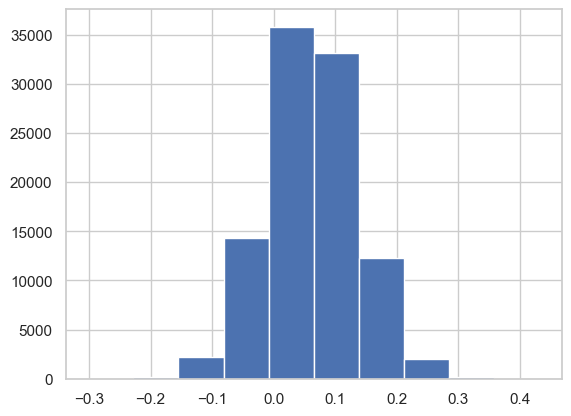

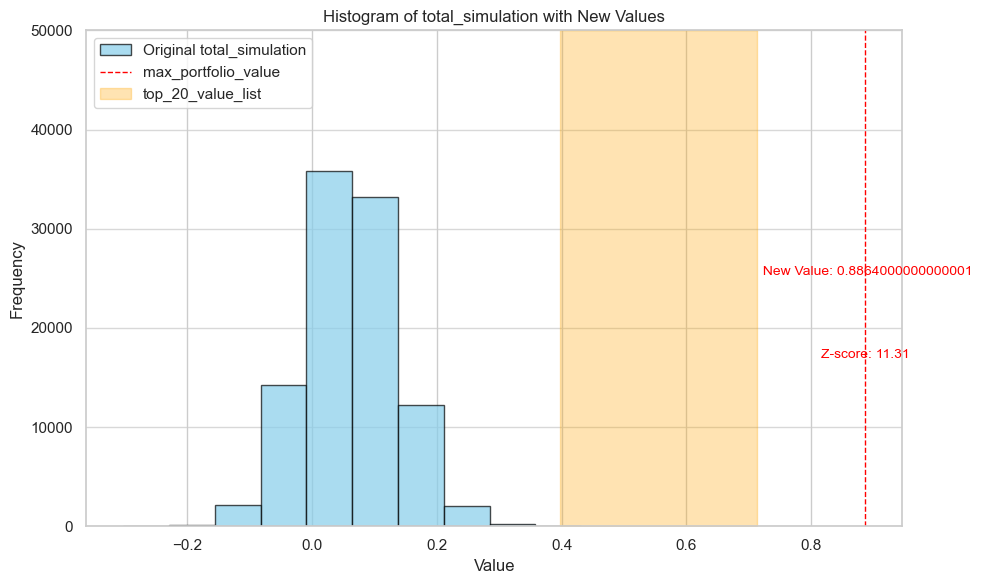

Mean of original total_simulation: 0.06
Standard deviation of original total_simulation: 0.07


In [362]:
etf_return = OHLCV[OHLCV['TCK_IEM_CD'].isin(divi_etf)].pivot(index='BSE_DT',columns='TCK_IEM_CD',values='BF_DD_CMP_IND_RT')*0.01
### 각각의 ETF를 테마라고 보고 테마를 잘 선택 했을때 유믜미 할지
# 인덱스를 문자열로 변환한 후 datetime으로 변환
etf_return.index = pd.to_datetime(etf_return.index.astype(str), format='%Y%m%d')
etf_return_weekly = etf_return.resample('W').sum()
#로그 수익률임으로 sum함
max_portfolio_value = 0
for i in etf_return_weekly.values:
    max_portfolio_value += max(i)
    

top_20_value_list = []
simulation_number_top_20 = 1000
# 각 로우에서 상위 20% 값을 뽑고 랜덤으로 선택
for _ in range(simulation_number_top_20):
    random_samples = []
    for i in range(len(etf_return_weekly)):
        row = etf_return_weekly.iloc[i]  # 각 로우 선택
        threshold = row.quantile(0.90)  # 상위 20%의 기준값 계산
        top_20_percent = row[row >= threshold]  # 상위 20% 값 필터링

        # 상위 20% 값 중 랜덤으로 하나 선택
        if not top_20_percent.empty:
            random_sample = np.random.choice(top_20_percent)
            random_samples.append(random_sample)
    top_20_value = sum(random_samples)
    
    top_20_value_list.append(top_20_value.copy())
    top_20_value = 0
total_simulation = []
simulation_number_all =100000
for i in range(simulation_number_all):
    sum_number = 0
    for i in etf_return_weekly.values:
        sum_number += np.random.choice(i)
    total_simulation.append(sum_number)
plt.hist(total_simulation)
# 새로운 값 추가 (단일 값 또는 리스트)
new_values = [max_portfolio_value,top_20_value_list]  # 예시로 단일 값과 리스트가 혼합됨
names = ["max_portfolio_value",'top_20_value_list']  # 각 값에 대한 이름

# 히스토그램 그리기
plt.figure(figsize=(10, 6))
plt.hist(total_simulation, bins=10, color='skyblue', edgecolor='black', alpha=0.7, label='Original total_simulation')

# 기존 데이터의 평균과 표준편차 계산
mean = np.mean(total_simulation)
std_dev = np.std(total_simulation)

# y축 최대값 설정
plt.ylim(0, len(total_simulation) // 2)  # 데이터 개수에 따라 적절히 조정

# 새로운 값들을 처리
for i, new_value in enumerate(new_values):
    if isinstance(new_value, list):
        # 리스트인 경우, 범위를 색칠 (투명하게)
        min_value = min(new_value)
        max_value = max(new_value)
        
        plt.fill_betweenx(y=[0, len(total_simulation) // 2], x1=min_value, x2=max_value, color='orange', alpha=0.3, label=names[i])
        
    else:
        # 단일 값인 경우, 점선으로 표시
        plt.axvline(new_value, color='red', linestyle='dashed', linewidth=1, label=names[i])
        plt.text(new_value, len(total_simulation) // 4, f' New Value: {new_value}', color='red', ha='center', va='bottom', fontsize=10)

        # 해당 값이 평균에서 얼마나 떨어져 있는지 계산 (z-score)
        z_score = (new_value - mean) / std_dev
        plt.text(new_value, len(total_simulation) // 6, f'Z-score: {z_score:.2f}', color='red', ha='center', va='bottom', fontsize=10)

# 히스토그램 레이블 및 스타일 설정
plt.title('Histogram of total_simulation with New Values')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.legend()
plt.grid(axis='y', alpha=0.75)
plt.tight_layout()
plt.show()

# 평균 및 표준편차 출력
print(f"Mean of original total_simulation: {mean:.2f}")
print(f"Standard deviation of original total_simulation: {std_dev:.2f}")

### 결론

투자자들이 많이 관심을 갖는 상품은 직접적으로 매수로 이어지지만, 이러한 종목들이 항상 높은 수익률과 관련이 있는 것은 아닙니다. 

조회수와 매수량을 비교해보았을 때, 당일에는 큰 관계가 없었으나 다음 날부터 유의미한 상관관계가 나타났습니다. 

이를 통해 투자자들이 예상보다 빠르게 투자 결정을 내리며, 그 결과가 기대에 미치지 못할 수 있음을 알 수 있습니다.

### 투자자들은 현재 뜨고 있는 종목(테마주)에 깊은 관심을 가지지만, 성급한 투자 결정으로 인해 좋은 성과를 내지 못하고 있습니다. 이는 다양한 요인에서 기인하지만, 이번 프로젝트에서는 정보의 양(판단의 양)에 초점을 맞추었습니다.

어떠한 테마가 상승할 때 그 테마를 매수하는 것은 합리적이지만, 때로는 하나의 ETF가 특정 테마를 충분히 대표하지 못할 수 있습니다. 예를 들어, AI 테마가 상승 중일 때, 생성형 AI에 투자하는지 아니면 AI를 활용하는 기업(예: Apple, Microsoft)에 투자하는지에 따라 내부적으로 수익률이 이질적일 수 있습니다. 즉, 하나로 묶여야 할 테마가 분리될 수 있고, 반대로 분리되어야 할 테마가 하나로 묶일 수도 있습니다.

### 따라서 현재 시장 상황에 적합한 테마를 구성하는 것이 사용자들이 투자 판단을 단순화하고, 더 나은 투자 결과를 얻는 데 도움이 될 것이라고 생각했습니다.

복잡한 금융 시장에서 항상 최선의 선택을 하기란 어렵습니다. 그러나 잘 묶인 데이터에서 선택하는 것은 무작위로 선택하는 것보다 훨씬 더 나은 성과를 보입니다.

특히 상위 20%의 종목만을 효과적으로 선별할 수 있다면, 이는 의미 있는 투자로 이어질 것입니다.

기존의 테마주는 시장의 변화를 완벽하게 반영하기 어렵습니다. 테마주는 매우 빠르게 변동하며, 이에 맞춰 새로운 상품이나 그룹을 생성하는 데는 상당한 비용이 소모됩니다.

따라서 우리는 시변하는 주식시장의 특성을 이해하고, 신속하게 새로운 테마를 구성하는 방법을 제시합니다. 이번 프로젝트에서는 특정 테마주가 상승할 것이라는 예측을 제공하지 않습니다. 

대신, 핵심은 각 테마가 명확하게 구분되고, 테마 자체가 잘 선정된다면 그 그룹 내에서 어떤 종목을 선택하더라도 좋은 수익을 올릴 수 있다는 관점에 있습니다.

이를 통해 투자자들이 보다 체계적이고 효율적으로 투자 결정을 내릴 수 있도록 지원하고자 합니다.

추가적으로 각 그룹의 포트폴리오 수익률을 가지고 해당 그룹 맞춤형 테마를 제시할 수 있도록 모델을 만들었습니다. 


----

### 즉, 우리는 그룹 내 자산들의 동질성과 동시성을 최대한 확보하고, 다른 집단과의 배제성을 강화하는 방향으로 모델을 설계할 계획입니다.




## etf를 잘 구별하는 특성이 어떤것이 있을지 확인

1. **BSE_DT** – 거래일자 (여러 테이블에서 사용됨)
2. **IEM_ONG_PR** – 종목시가 (시작 가격)
3. **IEM_HI_PR** – 종목고가 (최고 가격)
4. **IEM_LOW_PR** – 종목저가 (최저 가격)
5. **IEM_END_PR** – 종목종가 (종가)
6. **BF_DD_CMP_IND_PR** – 전일대비증감가격 (전일 종가 대비 변화)
7. **BF_DD_CMP_IND_RT** – 전일대비증감율 (전일 종가 대비 비율 변화)
8. **ACL_TRD_QTY** – 누적거래수량 (총 거래된 수량)
9. **TRD_CST** – 거래대금 (거래된 총 금액)
10. **SLL_CNS_SUM_QTY** – 매도체결합계수량 (매도된 수량)
11. **BYN_CNS_SUM_QTY** – 매수체결합계수량 (매수된 수량)
12. **SBY_BSE_XCG_RT** – 환율 (해외 거래시 적용되는 환율)
13. **TOT_HLD_ACT_CNT** – 총보유계좌수 (ETF를 보유하고 있는 계좌 수)
14. **TOT_HLD_QTY** – 총보유수량 (보유된 총 수량)
15. **TCO_AVG_HLD_QTY** – 당사평균보유수량 (회사의 평균 보유 수량)
16. **TCO_AVG_HLD_WHT_RT** – 당사평균보유비중비율 (평균 보유 비중 비율)
17. **TCO_AVG_EAL_PLS** – 당사평균평가손익 (평균 평가 손익)
18. **TCO_AVG_PHS_UIT_PR** – 당사평균매입단가 (평균 매입 가격)
19. **TCO_AVG_PFT_RT** – 당사평균수익율 (평균 수익률)
20. **TCO_AVG_HLD_TE_DD_CNT** – 당사평균보유기간일수 (평균 보유 기간)
21. **DIST_HNK_PCT10_NMV** – 분포상위10퍼센트수치 (상위 10% 수치)
22. **DIST_HNK_PCT30_NMV** – 분포상위30퍼센트수치 (상위 30% 수치)
23. **DIST_HNK_PCT50_NMV** – 분포상위50퍼센트수치 (상위 50% 수치)
24. **DIST_HNK_PCT70_NMV** – 분포상위70퍼센트수치 (상위 70% 수치)
25. **DIST_HNK_PCT90_NMV** – 분포상위90퍼센트수치 (상위 90% 수치)
26. **BSE_END_PR** – 기준종가 (종가)
27. **LSS_IVO_RT** – 손실투자자비율 (손실 투자자 비율)
28. **PFT_IVO_RT** – 수익투자자비율 (수익 투자자 비율)
29. **IFW_ACT_CNT** – 신규매수계좌수 (신규 매수 계좌 수)
30. **OFW_ACT_CNT** – 전량매도계좌수 (매도 계좌 수)
31. **VW_TGT_CNT** – 종목조회건수 (종목 조회 수)
32. **RGS_TGT_CNT** – 관심종목등록건수 (관심 종목 등록 수)
33. **MM1_TOT_PFT_RT** – 1개월총수익율 (1개월 수익률)
34. **MM3_TOT_PFT_RT** – 3개월총수익율 (3개월 수익률)
35. **YR1_TOT_PFT_RT** – 1년총수익율 (1년 수익률)
36. **ETF_SOR** – ETF점수 (ETF 평가 점수)
37. **ETF_Z_SOR** – ETFZ점수 (ETF Z-Score)
38. **Z_SOR_RNK** – Z점수순위 (Z-Score 순위)
39. **ACL_PFT_RT_Z_SOR** – 누적수익율Z점수 (누적 수익률 Z-Score)
40. **IFO_RT_Z_SOR** – 정보비율Z점수 (정보 비율 Z-Score)
41. **SHPR_Z_SOR** – 샤프지수Z점수 (Sharpe Ratio Z-Score)
42. **CRR_Z_SOR** – 상관관계Z점수 (상관관계 Z-Score)
43. **TRK_ERR_Z_SOR** – 트래킹에러Z점수 (Tracking Error Z-Score)
44. **MXDD_Z_SOR** – 최대낙폭Z점수 (Max Drawdown Z-Score)
45. **VTY_Z_SOR** – 변동성Z점수 (변동성 Z-Score)

### 1. **가격 관련 그룹 (Price-Related)**

- **IEM_ONG_PR** – 종목시가 (시작 가격)
- **IEM_HI_PR** – 종목고가 (최고 가격)
- **IEM_LOW_PR** – 종목저가 (최저 가격)
- **IEM_END_PR** – 종목종가 (종가)
- **BF_DD_CMP_IND_PR** – 전일대비증감가격 (전일 종가 대비 변화)
- **BF_DD_CMP_IND_RT** – 전일대비증감율 (전일 종가 대비 비율 변화)
- **BSE_END_PR** – 기준종가 (종가)

### 2. **거래 관련 그룹 (Trading-Related)**

- **ACL_TRD_QTY** – 누적거래수량 (총 거래된 수량)
- **TRD_CST** – 거래대금 (거래된 총 금액)
- **SLL_CNS_SUM_QTY** – 매도체결합계수량 (매도된 수량)
- **BYN_CNS_SUM_QTY** – 매수체결합계수량 (매수된 수량)

### 3. **계좌 및 보유 관련 그룹 (Account & Holdings)**

- **TOT_HLD_ACT_CNT** – 총보유계좌수 (ETF를 보유하고 있는 계좌 수)
- **TOT_HLD_QTY** – 총보유수량 (보유된 총 수량)
- **TCO_AVG_HLD_QTY** – 당사평균보유수량 (회사의 평균 보유 수량)
- **TCO_AVG_HLD_WHT_RT** – 당사평균보유비중비율 (평균 보유 비중 비율)
- **TCO_AVG_HLD_TE_DD_CNT** – 당사평균보유기간일수 (평균 보유 기간)

### 4. **수익 및 손익 관련 그룹 (Profit & Loss)**

- **TCO_AVG_EAL_PLS** – 당사평균평가손익 (평균 평가 손익)
- **TCO_AVG_PHS_UIT_PR** – 당사평균매입단가 (평균 매입 가격)
- **TCO_AVG_PFT_RT** – 당사평균수익율 (평균 수익률)
- **MM1_TOT_PFT_RT** – 1개월총수익율 (1개월 수익률)
- **MM3_TOT_PFT_RT** – 3개월총수익율 (3개월 수익률)
- **YR1_TOT_PFT_RT** – 1년총수익율 (1년 수익률)
- **ACL_PFT_RT_Z_SOR** – 누적수익율Z점수 (누적 수익률 Z-Score)

### 5. **투자자 관련 그룹 (Investor-Related)**

- **LSS_IVO_RT** – 손실투자자비율 (손실 투자자 비율)
- **PFT_IVO_RT** – 수익투자자비율 (수익 투자자 비율)
- **IFW_ACT_CNT** – 신규매수계좌수 (신규 매수 계좌 수)
- **OFW_ACT_CNT** – 전량매도계좌수 (매도 계좌 수)

### 6. **순위 및 점수 관련 그룹 (Ranking & Scores)**

- **ETF_SOR** – ETF점수 (ETF 평가 점수)
- **ETF_Z_SOR** – ETFZ점수 (ETF Z-Score)
- **Z_SOR_RNK** – Z점수순위 (Z-Score 순위)
- **IFO_RT_Z_SOR** – 정보비율Z점수 (정보 비율 Z-Score)
- **SHPR_Z_SOR** – 샤프지수Z점수 (Sharpe Ratio Z-Score)
- **CRR_Z_SOR** – 상관관계Z점수 (상관관계 Z-Score)
- **TRK_ERR_Z_SOR** – 트래킹에러Z점수 (Tracking Error Z-Score)
- **MXDD_Z_SOR** – 최대낙폭Z점수 (Max Drawdown Z-Score)
- **VTY_Z_SOR** – 변동성Z점수 (변동성 Z-Score)

### 7. **분포 및 지표 관련 그룹 (Distribution & Indicators)**

- **DIST_HNK_PCT10_NMV** – 분포상위10퍼센트수치 (상위 10% 수치)
- **DIST_HNK_PCT30_NMV** – 분포상위30퍼센트수치 (상위 30% 수치)
- **DIST_HNK_PCT50_NMV** – 분포상위50퍼센트수치 (상위 50% 수치)
- **DIST_HNK_PCT70_NMV** – 분포상위70퍼센트수치 (상위 70% 수치)
- **DIST_HNK_PCT90_NMV** – 분포상위90퍼센트수치 (상위 90% 수치)

### 8. **기타 (Miscellaneous)**

- **SBY_BSE_XCG_RT** – 환율 (해외 거래시 적용되는 환율)
- **VW_TGT_CNT** – 종목조회건수 (종목 조회 수)
- **RGS_TGT_CNT** – 관심종목등록건수 (관심 종목 등록 수)

## 독립성 가정

- GNN의 정의에 따라 변수들이 최대한 독립적인 것으로 뽑았습니다.

- 이때 제공해준 테이블 내에서 처리를 진행하였는데, 각 테이블이 의미하는 내용이 실질적으로 다르다고 판단하였고 그렇기에 통계적 처리 방법보다 의미론적 내용에 조금더 강점을 두어 테이블간의 독립성으로 데이터를 처리하지 않았습니다.

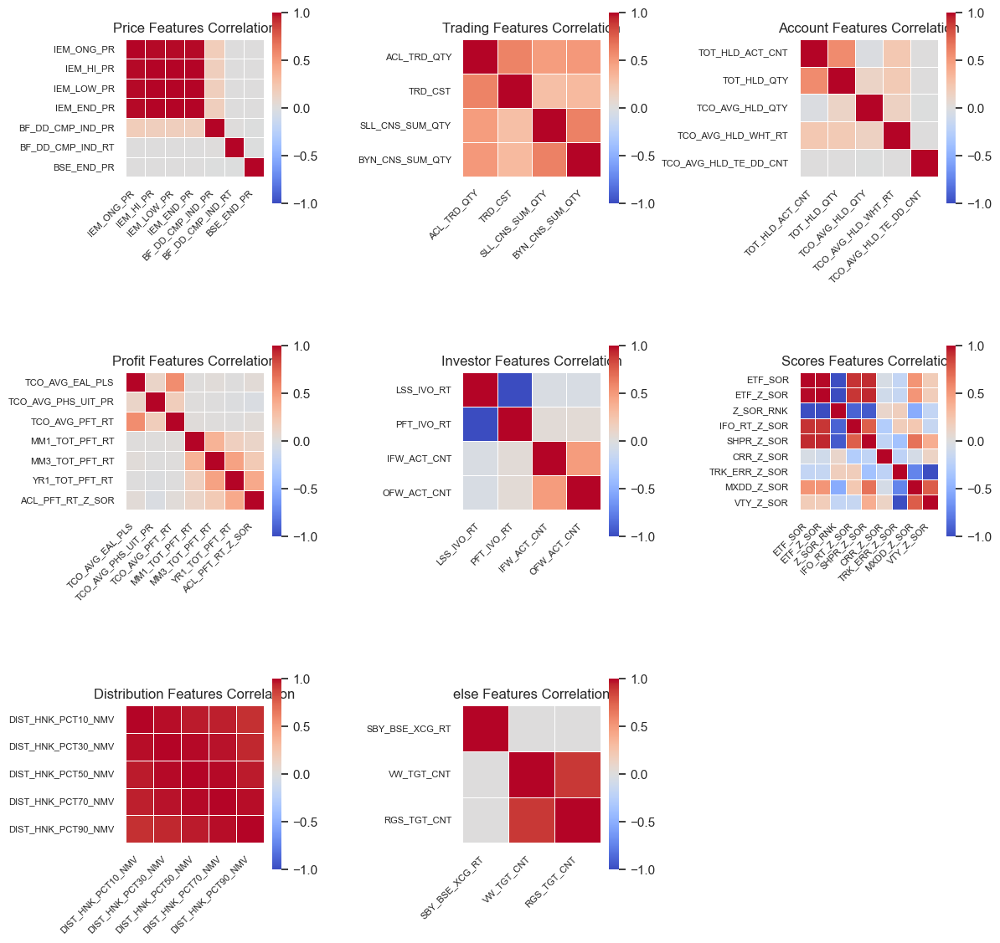

In [363]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import combinations
import math

# 예시로 데이터프레임 로드를 주석 해제하여 사용하세요.
# DIVIDEND = pd.read_csv("NH_CONTEST_DATA_HISTORICAL_DIVIDEND.csv")
# SCORE = pd.read_csv("NH_CONTEST_ETF_SOR_IFO.csv")
# ETF_Holding = pd.read_csv("NH_CONTEST_DATA_ETF_HOLDINGS.csv", encoding='EUC-KR')
# CUSTOMER = pd.read_csv("NH_CONTEST_NHDATA_CUS_TP_IFO.csv")
# INCOME_Outcome_Flow = pd.read_csv("NH_CONTEST_NHDATA_IFW_OFW_IFO.csv")
# DAY_Data = pd.read_csv("NH_CONTEST_NHDATA_STK_DD_IFO.csv", encoding='EUC-KR')
# STOCK_Explane = pd.read_csv("NH_CONTEST_NW_FC_STK_IEM_IFO.csv", encoding='EUC-KR')
# OHLCV = pd.read_csv("NH_CONTEST_STK_DT_QUT.csv")

# 모든 데이터프레임 열 이름을 대문자로 변경
for df in [DIVIDEND, SCORE, ETF_Holding, CUSTOMER, INCOME_Outcome_Flow, DAY_Data, STOCK_Explane, OHLCV]:
    df.columns = df.columns.str.upper()

# 그룹별 특성 정의
grouped_features_dict = {
    "Price": {
        "dataframe": [OHLCV, DAY_Data],
        "features": {
            "OHLCV": ['IEM_ONG_PR', 'IEM_HI_PR', 'IEM_LOW_PR', 'IEM_END_PR', 'BF_DD_CMP_IND_PR', 'BF_DD_CMP_IND_RT'],
            "DAY_Data": ['BSE_END_PR']
        }
    },
    "Trading": {
        "dataframe": OHLCV,
        "features": ['ACL_TRD_QTY', 'TRD_CST', 'SLL_CNS_SUM_QTY', 'BYN_CNS_SUM_QTY']
    },
    "Account": {
        "dataframe": DAY_Data,
        "features": ['TOT_HLD_ACT_CNT', 'TOT_HLD_QTY', 'TCO_AVG_HLD_QTY', 'TCO_AVG_HLD_WHT_RT', 'TCO_AVG_HLD_TE_DD_CNT']
    },
    "Profit": {
        "dataframe": [DAY_Data, SCORE],
        "features": {
            "DAY_Data": ['TCO_AVG_EAL_PLS', 'TCO_AVG_PHS_UIT_PR', 'TCO_AVG_PFT_RT'],
            "SCORE": ['MM1_TOT_PFT_RT', 'MM3_TOT_PFT_RT', 'YR1_TOT_PFT_RT', 'ACL_PFT_RT_Z_SOR']
        }
    },
    "Investor": {
        "dataframe": DAY_Data,
        "features": ['LSS_IVO_RT', 'PFT_IVO_RT', 'IFW_ACT_CNT', 'OFW_ACT_CNT']
    },
    "Scores": {
        "dataframe": SCORE,
        "features": ['ETF_SOR', 'ETF_Z_SOR', 'Z_SOR_RNK', 'IFO_RT_Z_SOR', 'SHPR_Z_SOR', 'CRR_Z_SOR', 'TRK_ERR_Z_SOR', 'MXDD_Z_SOR', 'VTY_Z_SOR']
    },
    "Distribution": {
        "dataframe": DAY_Data,
        "features": ['DIST_HNK_PCT10_NMV', 'DIST_HNK_PCT30_NMV', 'DIST_HNK_PCT50_NMV', 'DIST_HNK_PCT70_NMV', 'DIST_HNK_PCT90_NMV']
    },
    "else": {
        "dataframe": [OHLCV, DAY_Data],
        "features": {
            "OHLCV": ['SBY_BSE_XCG_RT'],
            "DAY_Data": ['VW_TGT_CNT', 'RGS_TGT_CNT']
        }
    }
}

# 데이터 처리 및 상관관계 시각화
correlation_matrices = []
group_names = []

for group, info in grouped_features_dict.items():
    if isinstance(info["dataframe"], list):  # 여러 데이터프레임에 분산된 경우
        combined_data = pd.DataFrame()
        for df_name, features in info["features"].items():
            df = locals()[df_name]  # 문자열로 데이터프레임 호출
            combined_data = pd.concat([combined_data, df[features]], axis=1)
    else:
        df = info["dataframe"]
        combined_data = df[info["features"]]
    
    # 상관관계 계산
    correlation_matrix = combined_data.corr()
    correlation_matrices.append(correlation_matrix)
    group_names.append(group)

# 전체 Heatmap을 그리기 위한 Subplots 설정
num_groups = len(correlation_matrices)
cols = 3  # 한 행에 표시할 Heatmap 개수
rows = math.ceil(num_groups / cols)

plt.figure(figsize=(cols * 4, rows * 4))  # 전체 Figure 크기 조정

for idx, (corr_matrix, group) in enumerate(zip(correlation_matrices, group_names)):
    plt.subplot(rows, cols, idx + 1)
    sns.heatmap(
        corr_matrix, 
        annot=False,  # 숫자 어노테이션 제거
        cmap='coolwarm', 
        linewidths=.5, 
        cbar_kws={"shrink": 0.8},
        square=True,
        vmin=-1, 
        vmax=1
    )
    plt.title(f'{group} Features Correlation', fontsize=12)
    plt.xticks(rotation=45, ha='right', fontsize=8)
    plt.yticks(rotation=0, fontsize=8)

plt.tight_layout()
plt.show()

- price 데이터를 살펴보면 'IEM_ONG_PR', 'IEM_HI_PR', 'IEM_LOW_PR', 'IEM_END_PR' 의 상관관계가 높음.
- trading : TRD_CST, ACL_TRD_QTY 그리고 BYN_CNS_SUM_QTY, SLL_CNS_SUM_QTY 가 각각 0.61의 상관관계를 보이지만 어느 정도 차이가 있는 데이터이다.
- Account: 거의 다 낮은 상관관계를 보임
- profit: 거의 다 낮은 상관관계를 보임
- Investor: LSS_IVO_RT와 PFT_IVO_RT는 방향성만 다른 거의 똑같은 데이터
- score:'ETF_SOR', 'ETF_Z_SOR', 'Z_SOR_RNK', 'IFO_RT_Z_SOR', 'SHPR_Z_SOR' 다섯개는 상관관계가 매우 높은 데이터로 거의 비슷한 데이터라고 할 수 있다. 
  'TRK_ERR_Z_SOR', 'MXDD_Z_SOR', 'VTY_Z_SOR'그리고 이 3개 상관관계가 높아 거의 유사한 데이터라고 볼 수 있다. 
- Distibution: 5개 모두 거의 비슷한 데이터 임을 알 수 있다.
- else: VW_TGT_CNT, RGS_TGT_CNT 이 두개가 거의 비슷하다. 

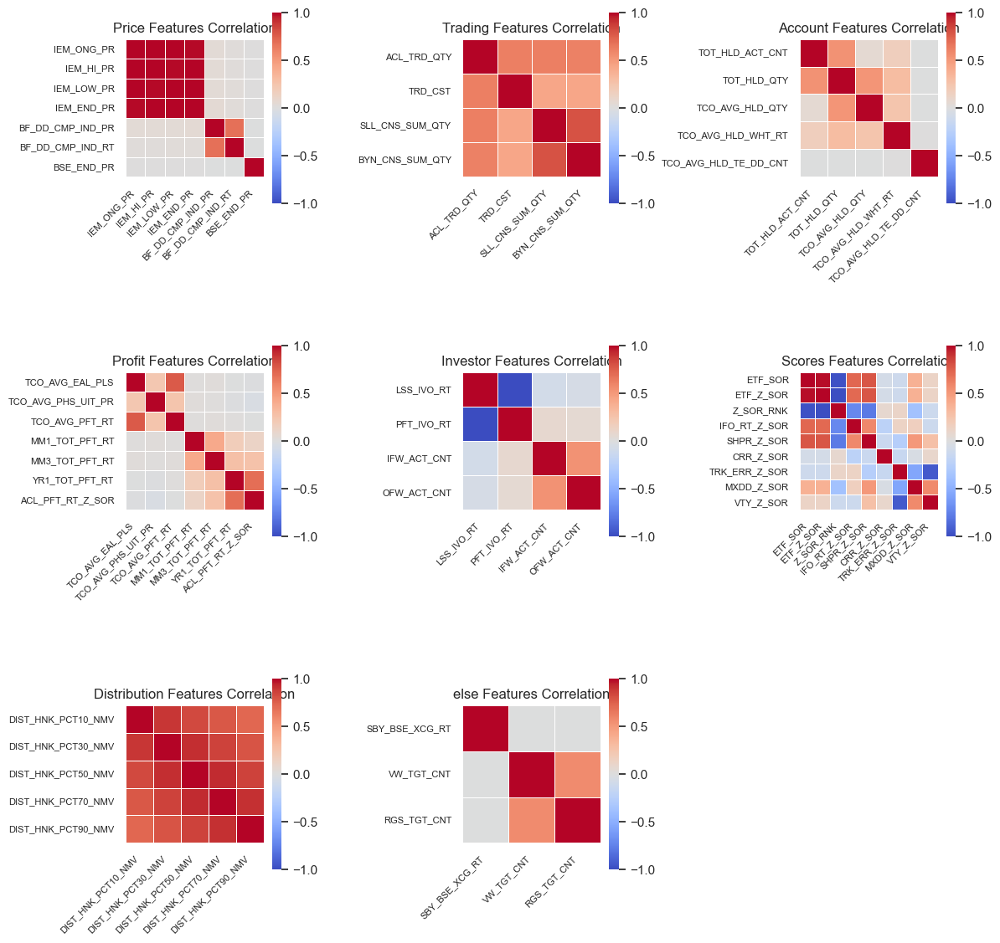

In [364]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import combinations
import math

#2.켄달상관계수를 이용하여 두변수간의 선형 상관관계 측정 - 비선형관계를 더 잘 포착할 수 있음.


# 그룹별 특성 정의
grouped_features_dict = {
    "Price": {
        "dataframe": [OHLCV, DAY_Data],
        "features": {
            "OHLCV": ['IEM_ONG_PR', 'IEM_HI_PR', 'IEM_LOW_PR', 'IEM_END_PR', 'BF_DD_CMP_IND_PR', 'BF_DD_CMP_IND_RT'],
            "DAY_Data": ['BSE_END_PR']
        }
    },
    "Trading": {
        "dataframe": OHLCV,
        "features": ['ACL_TRD_QTY', 'TRD_CST', 'SLL_CNS_SUM_QTY', 'BYN_CNS_SUM_QTY']
    },
    "Account": {
        "dataframe": DAY_Data,
        "features": ['TOT_HLD_ACT_CNT', 'TOT_HLD_QTY', 'TCO_AVG_HLD_QTY', 'TCO_AVG_HLD_WHT_RT', 'TCO_AVG_HLD_TE_DD_CNT']
    },
    "Profit": {
        "dataframe": [DAY_Data, SCORE],
        "features": {
            "DAY_Data": ['TCO_AVG_EAL_PLS', 'TCO_AVG_PHS_UIT_PR', 'TCO_AVG_PFT_RT'],
            "SCORE": ['MM1_TOT_PFT_RT', 'MM3_TOT_PFT_RT', 'YR1_TOT_PFT_RT', 'ACL_PFT_RT_Z_SOR']
        }
    },
    "Investor": {
        "dataframe": DAY_Data,
        "features": ['LSS_IVO_RT', 'PFT_IVO_RT', 'IFW_ACT_CNT', 'OFW_ACT_CNT']
    },
    "Scores": {
        "dataframe": SCORE,
        "features": ['ETF_SOR', 'ETF_Z_SOR', 'Z_SOR_RNK', 'IFO_RT_Z_SOR', 'SHPR_Z_SOR', 'CRR_Z_SOR', 'TRK_ERR_Z_SOR', 'MXDD_Z_SOR', 'VTY_Z_SOR']
    },
    "Distribution": {
        "dataframe": DAY_Data,
        "features": ['DIST_HNK_PCT10_NMV', 'DIST_HNK_PCT30_NMV', 'DIST_HNK_PCT50_NMV', 'DIST_HNK_PCT70_NMV', 'DIST_HNK_PCT90_NMV']
    },
    "else": {
        "dataframe": [OHLCV, DAY_Data],
        "features": {
            "OHLCV": ['SBY_BSE_XCG_RT'],
            "DAY_Data": ['VW_TGT_CNT', 'RGS_TGT_CNT']
        }
    }
}

# 데이터 처리 및 상관관계 시각화
correlation_matrices = []
group_names = []

for group, info in grouped_features_dict.items():
    if isinstance(info["dataframe"], list):  # 여러 데이터프레임에 분산된 경우
        combined_data = pd.DataFrame()
        for df_name, features in info["features"].items():
            df = locals()[df_name]  # 문자열로 데이터프레임 호출
            combined_data = pd.concat([combined_data, df[features]], axis=1)
    else:
        df = info["dataframe"]
        combined_data = df[info["features"]]
    
    # 상관관계 계산 (켄달 상관계수)
    correlation_matrix = combined_data.corr(method='kendall')
    correlation_matrices.append(correlation_matrix)
    group_names.append(group)

# 전체 Heatmap을 그리기 위한 Subplots 설정
num_groups = len(correlation_matrices)
cols = 3  # 한 행에 표시할 Heatmap 개수
rows = math.ceil(num_groups / cols)

plt.figure(figsize=(cols * 4, rows * 4))  # 전체 Figure 크기 조정

for idx, (corr_matrix, group) in enumerate(zip(correlation_matrices, group_names)):
    plt.subplot(rows, cols, idx + 1)
    sns.heatmap(
        corr_matrix, 
        annot=False,          # 숫자 어노테이션 제거
        cmap='coolwarm', 
        linewidths=.5, 
        cbar_kws={"shrink": 0.8},
        square=True,
        vmin=-1, 
        vmax=1
    )
    plt.title(f'{group} Features Correlation', fontsize=12)
    plt.xticks(rotation=45, ha='right', fontsize=8)
    plt.yticks(rotation=0, fontsize=8)

plt.tight_layout()
plt.show()

- price 데이터를 살펴보면 'IEM_ONG_PR', 'IEM_HI_PR', 'IEM_LOW_PR', 'IEM_END_PR' 의 상관관계가 높음.
- trading : TRD_CST, ACL_TRD_QTY 그리고 BYN_CNS_SUM_QTY, SLL_CNS_SUM_QTY 이 높은 상관관계를 보임.
  ACL_TRD_QTY이건 모든 데이터와 강한 상관관계를 보이므로 여기서 데이터를 이용한다면,TRD_CST와 BYN_CNS_SUM_QTY,SLL_CNS_SUM_QTY이거 둘중에 하나로 두개의 데이터를 써야할 것 같다.
- Account: 거의 다 낮은 상관관계를 보임
- profit: TCO_AVG_EAL_PLS 와 TCO_AVG_PFT_RT의 상관관계가 높고, ACL_PFT_RT_Z_SOR와 YR1_TOT_PFT_RT의 상관관계가 높다.
- Investor: LSS_IVO_RT와 PFT_IVO_RT는 방향성만 다른 거의 똑같은 데이터
- score:'ETF_SOR', 'ETF_Z_SOR', 'Z_SOR_RNK', 'IFO_RT_Z_SOR', 'SHPR_Z_SOR' 다섯개는 상관관계가 매우 높은 데이터로 거의 비슷한 데이터라고 할 수 있다. 'TRK_ERR_Z_SOR', 'MXDD_Z_SOR', 'VTY_Z_SOR'그리고 이 3개 상관관계가 높아 거의 유사한 데이터라고 볼 수 있다.
- Distibution: 5개 모두 거의 비슷한 데이터 임을 알 수 있다.
- else: VW_TGT_CNT, RGS_TGT_CNT 이 두개가 거의 비슷하다.

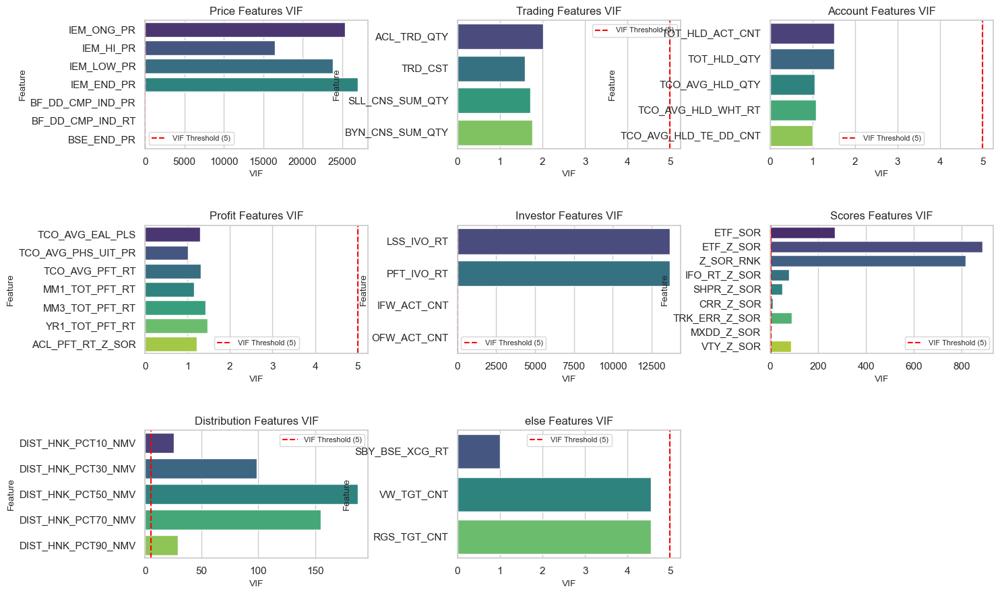

In [365]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import combinations
import math

# 예시로 데이터프레임 로드를 주석 해제하여 사용하세요.
# DIVIDEND = pd.read_csv("NH_CONTEST_DATA_HISTORICAL_DIVIDEND.csv")
# SCORE = pd.read_csv("NH_CONTEST_ETF_SOR_IFO.csv")
# ETF_Holding = pd.read_csv("NH_CONTEST_DATA_ETF_HOLDINGS.csv", encoding='EUC-KR')
# CUSTOMER = pd.read_csv("NH_CONTEST_NHDATA_CUS_TP_IFO.csv")
# INCOME_Outcome_Flow = pd.read_csv("NH_CONTEST_NHDATA_IFW_OFW_IFO.csv")
# DAY_Data = pd.read_csv("NH_CONTEST_NHDATA_STK_DD_IFO.csv", encoding='EUC-KR')
# STOCK_Explane = pd.read_csv("NH_CONTEST_NW_FC_STK_IEM_IFO.csv", encoding='EUC-KR')
# OHLCV = pd.read_csv("NH_CONTEST_STK_DT_QUT.csv")

# 모든 데이터프레임 열 이름을 대문자로 변경
for df in [DIVIDEND, SCORE, ETF_Holding, CUSTOMER, INCOME_Outcome_Flow, DAY_Data, STOCK_Explane, OHLCV]:
    df.columns = df.columns.str.upper()

# 그룹별 특성 정의
grouped_features_dict = {
    "Price": {
        "dataframe": {"OHLCV": OHLCV, "DAY_Data": DAY_Data},
        "features": {
            "OHLCV": ['IEM_ONG_PR', 'IEM_HI_PR', 'IEM_LOW_PR', 'IEM_END_PR', 'BF_DD_CMP_IND_PR', 'BF_DD_CMP_IND_RT'],
            "DAY_Data": ['BSE_END_PR']
        }
    },
    "Trading": {
        "dataframe": {"OHLCV": OHLCV},
        "features": {
            "OHLCV": ['ACL_TRD_QTY', 'TRD_CST', 'SLL_CNS_SUM_QTY', 'BYN_CNS_SUM_QTY']
        }
    },
    "Account": {
        "dataframe": {"DAY_Data": DAY_Data},
        "features": {
            "DAY_Data": ['TOT_HLD_ACT_CNT', 'TOT_HLD_QTY', 'TCO_AVG_HLD_QTY', 'TCO_AVG_HLD_WHT_RT', 'TCO_AVG_HLD_TE_DD_CNT']
        }
    },
    "Profit": {
        "dataframe": {"DAY_Data": DAY_Data, "SCORE": SCORE},
        "features": {
            "DAY_Data": ['TCO_AVG_EAL_PLS', 'TCO_AVG_PHS_UIT_PR', 'TCO_AVG_PFT_RT'],
            "SCORE": ['MM1_TOT_PFT_RT', 'MM3_TOT_PFT_RT', 'YR1_TOT_PFT_RT', 'ACL_PFT_RT_Z_SOR']
        }
    },
    "Investor": {
        "dataframe": {"DAY_Data": DAY_Data},
        "features": {
            "DAY_Data": ['LSS_IVO_RT', 'PFT_IVO_RT', 'IFW_ACT_CNT', 'OFW_ACT_CNT']
        }
    },
    "Scores": {
        "dataframe": {"SCORE": SCORE},
        "features": {
            "SCORE": ['ETF_SOR', 'ETF_Z_SOR', 'Z_SOR_RNK', 'IFO_RT_Z_SOR', 'SHPR_Z_SOR', 'CRR_Z_SOR', 'TRK_ERR_Z_SOR', 'MXDD_Z_SOR', 'VTY_Z_SOR']
        }
    },
    "Distribution": {
        "dataframe": {"DAY_Data": DAY_Data},
        "features": {
            "DAY_Data": ['DIST_HNK_PCT10_NMV', 'DIST_HNK_PCT30_NMV', 'DIST_HNK_PCT50_NMV', 'DIST_HNK_PCT70_NMV', 'DIST_HNK_PCT90_NMV']
        }
    },
    "else": {
        "dataframe": {"OHLCV": OHLCV, "DAY_Data": DAY_Data},
        "features": {
            "OHLCV": ['SBY_BSE_XCG_RT'],
            "DAY_Data": ['VW_TGT_CNT', 'RGS_TGT_CNT']
        }
    }
}

# VIF 계산 함수
def calculate_vif(data):
    """
    VIF를 계산하기 위한 함수. 데이터프레임을 입력받아 각 특성의 VIF 값을 반환.
    """
    X = add_constant(data)
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif_data

# VIF 계산 및 저장
vif_results = {}
for group, info in grouped_features_dict.items():
    # 데이터를 결합하여 하나의 데이터프레임으로 생성
    combined_data = pd.DataFrame()
    for df_name, features in info['features'].items():
        df = info['dataframe'][df_name]  # 데이터프레임 딕셔너리에서 참조
        combined_data = pd.concat([combined_data, df[features]], axis=1)
    
    combined_data = combined_data.dropna()  # 결측값 제거
    
    if combined_data.empty:
        print(f"\n{group} 그룹의 데이터가 비어있어 VIF를 계산할 수 없습니다.")
        continue
    
    # VIF 계산
    try:
        vif_result = calculate_vif(combined_data)
        vif_results[group] = vif_result
        # print(f"VIF for {group} Features:")
        # print(vif_result)
        # print("\n")
    except Exception as e:
        print(f"Error calculating VIF for {group}: {e}")

# VIF 결과 시각화
if vif_results:
    num_groups = len(vif_results)
    cols = 3  # 한 행에 표시할 그래프 개수
    rows = math.ceil(num_groups / cols)
    
    plt.figure(figsize=(cols * 5, rows * 3))  # 전체 Figure 크기 조정
    
    # VIF 기준선 (예: VIF > 5는 다중공선성 가능성)
    vif_threshold = 5
    
    for idx, (group, vif_df) in enumerate(vif_results.items()):
        plt.subplot(rows, cols, idx + 1)
        sns.barplot(x='VIF', y='Feature', data=vif_df[vif_df['Feature'] != 'const'], palette='viridis')
        plt.axvline(vif_threshold, color='red', linestyle='--', label=f'VIF Threshold ({vif_threshold})')
        plt.title(f'{group} Features VIF', fontsize=12)
        plt.xlabel('VIF', fontsize=10)
        plt.ylabel('Feature', fontsize=10)
        plt.legend(fontsize=8)
        plt.tight_layout()
    
    plt.subplots_adjust(wspace=0.4, hspace=0.6)
    plt.show()
else:
    print("VIF 결과가 없습니다.")

VIF 값 해석 기준:

	- VIF = 1:
	 변수 간 완전 독립.
	 해당 변수가 다른 독립 변수와 전혀 상관이 없음을 의미합니다.
	- 1 < VIF ≤ 5:
	 약한 상관관계.
	 다중공선성이 문제되지 않는 수준이며, 모델에 포함해도 무방합니다.
	- 5 < VIF < 10:
	 다중공선성 의심.
	 변수 간 상관관계가 강해지고 있음을 나타냅니다. 모델의 해석에 영향을 줄 수 있으므로 추가 검토가 필요합니다.
	- VIF ≥ 10:
	 심각한 다중공선성.
	 해당 변수는 다른 독립 변수와 강한 상관관계를 가지며, 모델의 계수 추정이 불안정할 가능성이 높습니다. 이 경우:
	1.해당 변수를 제거하거나,
	2.차원 축소 기법(예: PCA)을 통해 다중공선성 문제를 해결하는 것을 고려합니다.


- price: IEM_ONG_PR, IEM_HI_PR, IEM_LOW_PR, IEM_END_PR의 VIF 값이 매우 높음.
  이 변수들은 서로 강하게 상관되어 있어 다중공선성이 심각합니다.
  BF_DD_CMP_IND_RT와 BSE_END_PR는 다중공선성이 거의 없음.
- trading: 모든 변수의 VIF 값이 5미만으로 다중공산성 문제가 없음.
- account: 모든 변수의 VIF 값이 낮아 다중공산성 문제가 없음.
- profit: 모든 변수의 VIF 값이 5미만으로 다중공산성 문제가 없음.
- investor: LSS_IVO_RT와 PFT_IVO_RT의 VIF 값이 매우 높음.
  두 변수는 매우 강한 다중공선성을 가집니다.
- score: ETF_Z_SOR, Z_SOR_RNK, IFO_RT_Z_SOR, SHPR_Z_SOR의 VIF 값이 매우 높음.
  해당 변수들 간에 다중공선성이 강하게 나타남.
- distibution: 	모든 변수의 VIF가 25 이상으로 매우 높음.
  이는 모든 변수들이 강하게 상관되어 있음을 의미합니다.
- else: 모든 변수의 VIF 값이 5미만으로 다중공산성 문제가 없음.

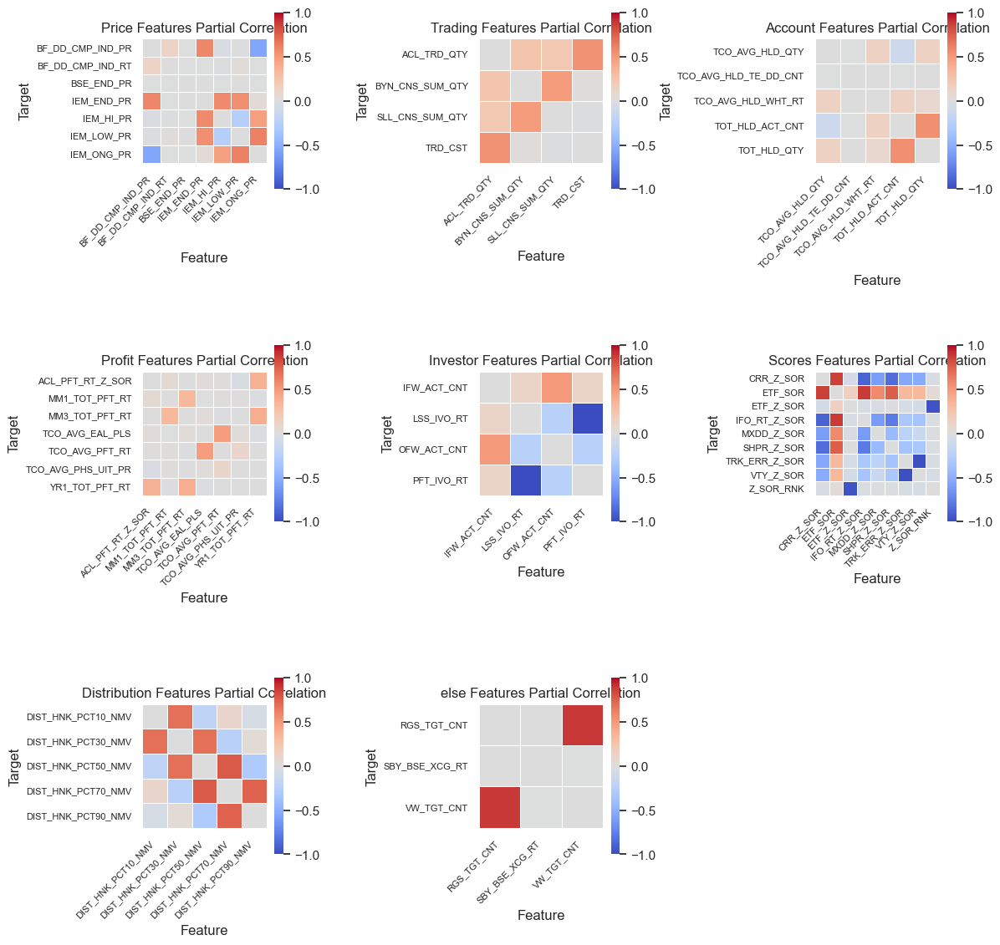

In [366]:
from pingouin import partial_corr
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import combinations
import math



# 모든 데이터프레임 열 이름을 대문자로 변경
for df in [DIVIDEND, SCORE, ETF_Holding, CUSTOMER, INCOME_Outcome_Flow, DAY_Data, STOCK_Explane, OHLCV]:
    df.columns = df.columns.str.upper()

# 그룹별 특성 정의
grouped_features_dict = {
    "Price": {
        "dataframe": {"OHLCV": OHLCV, "DAY_Data": DAY_Data},
        "features": {
            "OHLCV": ['IEM_ONG_PR', 'IEM_HI_PR', 'IEM_LOW_PR', 'IEM_END_PR', 'BF_DD_CMP_IND_PR', 'BF_DD_CMP_IND_RT'],
            "DAY_Data": ['BSE_END_PR']
        }
    },
    "Trading": {
        "dataframe": {"OHLCV": OHLCV},
        "features": {
            "OHLCV": ['ACL_TRD_QTY', 'TRD_CST', 'SLL_CNS_SUM_QTY', 'BYN_CNS_SUM_QTY']
        }
    },
    "Account": {
        "dataframe": {"DAY_Data": DAY_Data},
        "features": {
            "DAY_Data": ['TOT_HLD_ACT_CNT', 'TOT_HLD_QTY', 'TCO_AVG_HLD_QTY', 'TCO_AVG_HLD_WHT_RT', 'TCO_AVG_HLD_TE_DD_CNT']
        }
    },
    "Profit": {
        "dataframe": {"DAY_Data": DAY_Data, "SCORE": SCORE},
        "features": {
            "DAY_Data": ['TCO_AVG_EAL_PLS', 'TCO_AVG_PHS_UIT_PR', 'TCO_AVG_PFT_RT'],
            "SCORE": ['MM1_TOT_PFT_RT', 'MM3_TOT_PFT_RT', 'YR1_TOT_PFT_RT', 'ACL_PFT_RT_Z_SOR']
        }
    },
    "Investor": {
        "dataframe": {"DAY_Data": DAY_Data},
        "features": {
            "DAY_Data": ['LSS_IVO_RT', 'PFT_IVO_RT', 'IFW_ACT_CNT', 'OFW_ACT_CNT']
        }
    },
    "Scores": {
        "dataframe": {"SCORE": SCORE},
        "features": {
            "SCORE": ['ETF_SOR', 'ETF_Z_SOR', 'Z_SOR_RNK', 'IFO_RT_Z_SOR', 'SHPR_Z_SOR', 'CRR_Z_SOR', 'TRK_ERR_Z_SOR', 'MXDD_Z_SOR', 'VTY_Z_SOR']
        }
    },
    "Distribution": {
        "dataframe": {"DAY_Data": DAY_Data},
        "features": {
            "DAY_Data": ['DIST_HNK_PCT10_NMV', 'DIST_HNK_PCT30_NMV', 'DIST_HNK_PCT50_NMV', 'DIST_HNK_PCT70_NMV', 'DIST_HNK_PCT90_NMV']
        }
    },
    "else": {
        "dataframe": {"OHLCV": OHLCV, "DAY_Data": DAY_Data},
        "features": {
            "OHLCV": ['SBY_BSE_XCG_RT'],
            "DAY_Data": ['VW_TGT_CNT', 'RGS_TGT_CNT']
        }
    }
}

# Partial Correlation 계산 함수
def calculate_partial_correlation_group(data, features):
    """
    특정 그룹의 변수들 간 Partial Correlation을 계산합니다.
    
    Args:
    - data: DataFrame
    - features: 분석할 변수 목록

    Returns:
    - DataFrame: 각 변수 쌍에 대한 Partial Correlation
    """
    results = []
    for target in features:
        control_features = [col for col in features if col != target]
        for feature in control_features:
            # Partial Correlation은 x vs y, controlling for other variables except y
            controlling_vars = [col for col in control_features if col != feature]
            if len(controlling_vars) == 0:
                # 컨트롤 변수가 없는 경우, 단순 상관계수 사용
                corr = data[target].corr(data[feature], method='kendall')
                p_val = pd.Series(dtype='float')
            else:
                partial_corr_result = partial_corr(data=data, x=target, y=feature, covar=controlling_vars)
                corr = partial_corr_result['r'].values[0]
                p_val = partial_corr_result['p-val'].values[0]
            results.append({
                'Target': target,
                'Feature': feature,
                'Partial_Correlation': corr,
                'p-value': p_val
            })
    return pd.DataFrame(results)

# 그룹별 Partial Correlation 계산 및 시각화
correlation_matrices = []
group_names = []

for group, info in grouped_features_dict.items():
    combined_data = pd.DataFrame()
    
    # 데이터프레임별 열을 결합하지 않고 개별적으로 가져오기
    for df_name, features in info['features'].items():
        df = info['dataframe'][df_name]  # 데이터프레임 딕셔너리에서 참조
        combined_data = pd.concat([combined_data, df[features]], axis=1)

    combined_data = combined_data.dropna()  # 결측값 제거
    
    if combined_data.empty:
        print(f"\n{group} 그룹의 데이터가 비어있어 Partial Correlation을 계산할 수 없습니다.")
        continue
    
    # Partial Correlation 계산
    partial_corr_results = calculate_partial_correlation_group(combined_data, combined_data.columns.tolist())
    
    # Partial Correlation 결과 시각화을 위한 피벗 테이블 생성
    pivot_corr = partial_corr_results.pivot(index="Target", columns="Feature", values="Partial_Correlation")
    
    # 피벗 테이블을 상관관계 매트릭스로 변환
    correlation_matrix = pivot_corr.reindex(pivot_corr.columns, axis=1).fillna(0)
    
    correlation_matrices.append(correlation_matrix)
    group_names.append(group)

# 전체 Partial Correlation Heatmap을 그리기 위한 Subplots 설정
num_groups = len(correlation_matrices)
cols = 3  # 한 행에 표시할 Heatmap 개수
rows = math.ceil(num_groups / cols)

plt.figure(figsize=(cols * 4, rows * 4))  # 전체 Figure 크기 조정

for idx, (corr_matrix, group) in enumerate(zip(correlation_matrices, group_names)):
    plt.subplot(rows, cols, idx + 1)
    sns.heatmap(
        corr_matrix, 
        annot=False,          # 숫자 어노테이션 제거
        cmap='coolwarm', 
        linewidths=.5, 
        cbar_kws={"shrink": 0.8},
        square=True,
        vmin=-1, 
        vmax=1
    )
    plt.title(f'{group} Features Partial Correlation', fontsize=12)
    plt.xticks(rotation=45, ha='right', fontsize=8)
    plt.yticks(rotation=0, fontsize=8)

plt.tight_layout()
plt.show()

- price : 'IEM_HI_PR', 'IEM_LOW_PR', 'IEM_END_PR','IEM_ONG_PR'와 'IEM_END_PR','BF_DD_CMP_IND_PR 의 상관관계가 높음.
- trading : TRD_CST, ACL_TRD_QTY 그리고 BYN_CNS_SUM_QTY, SLL_CNS_SUM_QTY 이 높은 상관관계를 보임.
- Account: TOT_HLD_ACT_CNT,TOT_HLD_QTY의 상관관계가 높음.
- profit: TCO_AVG_EAL_PLS 와 TCO_AVG_PFT_RT의 상관관계가 높다.
- Investor: LSS_IVO_RT와 PFT_IVO_RT는 방향성만 다른 거의 똑같은 데이터이고, OFW_ACT_CNT,IFW_ACT_CNT의 상관관계가 높음.
- score: 
	1.	상관성 높은 변수 그룹:
	CRR_Z_SOR, ETF_SOR, IFO_RT_Z_SOR는 서로 강한 양의 상관관계를 보입니다.
	이 변수들은 함께 변동할 가능성이 높으므로, 중복 정보를 포함할 수 있습니다.
	2.	음의 상관관계 탐지:
	CRR_Z_SOR와 IFO_RT_Z_SOR, SHPR_Z_SOR 간에 강한 음의 상관관계가 존재.
	VTY_Z_SOR와 TRK_ERR_Z_SOR는 서로 거의 완벽하게 반대로 움직임.
	3.	Z_SOR_RNK의 독립성:
	대부분의 변수들과 상관성이 낮아, 상대적으로 독립적인 변수로 보입니다.
	ETF_Z_SOR와는 강한 음의 관계를 가지므로, 두 변수를 함께 사용할 때 의미를 신중히 해석해야 합니다.
- Distibution: 	
    1.	높은 상관관계 그룹:
	DIST_HNK_PCT50_NMV, DIST_HNK_PCT70_NMV, DIST_HNK_PCT90_NMV 간에는 강한 양의 상관관계가 나타납니다.
	이 변수들은 서로 비슷한 패턴을 보이며, 중복 정보를 포함할 가능성이 있습니다.
	2.	약한 상관관계:
	일부 변수(예: DIST_HNK_PCT10_NMV와 DIST_HNK_PCT50_NMV)는 약한 음의 상관관계를 보입니다.
	독립적인 움직임을 보일 가능성이 있음을 시사합니다.
- else: VW_TGT_CNT, RGS_TGT_CNT 이 두개가 거의 비슷하다.

### <결론>

1. 가격 관련 그룹 (Price-Related)
- IEM_ONG_PR – 종목시가 (시작 가격)
- IEM_HI_PR – 종목고가 (최고 가격)
- IEM_LOW_PR – 종목저가 (최저 가격)
- IEM_END_PR – 종목종가 (종가)
 -----
2. 거래 관련 그룹 (Trading-Related)
- ACL_TRD_QTY – 누적거래수량 (총 거래된 수량)
- TRD_CST – 거래대금 (거래된 총 금액)
----
- SLL_CNS_SUM_QTY – 매도체결합계수량 (매도된 수량)
- BYN_CNS_SUM_QTY – 매수체결합계수량 (매수된 수량)
----
3. 계좌 및 보유 관련 그룹 (Account & Holdings)
- TOT_HLD_ACT_CNT – 총보유계좌수 (ETF를 보유하고 있는 계좌 수)
- TOT_HLD_QTY – 총보유수량 (보유된 총 수량)
- TCO_AVG_HLD_QTY – 당사평균보유수량 (회사의 평균 보유 수량)
- TCO_AVG_HLD_WHT_RT – 당사평균보유비중비율 (평균 보유 비중 비율)
- TCO_AVG_HLD_TE_DD_CNT – 당사평균보유기간일수 (평균 보유 기간)
------
4. 수익 및 손익 관련 그룹 (Profit & Loss)
- TCO_AVG_EAL_PLS – 당사평균평가손익 (평균 평가 손익)
- TCO_AVG_PFT_RT – 당사평균수익율 (평균 수익률)
-----
- YR1_TOT_PFT_RT – 1년총수익율 (1년 수익률)
- ACL_PFT_RT_Z_SOR – 누적수익율Z점수 (누적 수익률 Z-Score)

5. 투자자 관련 그룹 (Investor-Related)
- LSS_IVO_RT – 손실투자자비율 (손실 투자자 비율)
- PFT_IVO_RT – 수익투자자비율 (수익 투자자 비율)

6. 순위 및 점수 관련 그룹 (Ranking & Scores)
- ETF_SOR – ETF점수 (ETF 평가 점수)
- ETF_Z_SOR – ETFZ점수 (ETF Z-Score)
- Z_SOR_RNK – Z점수순위 (Z-Score 순위)
- IFO_RT_Z_SOR – 정보비율Z점수 (정보 비율 Z-Score)
- SHPR_Z_SOR – 샤프지수Z점수 (Sharpe Ratio Z-Score)

-----
- TRK_ERR_Z_SOR – 트래킹에러Z점수 (Tracking Error Z-Score)
- MXDD_Z_SOR – 최대낙폭Z점수 (Max Drawdown Z-Score)
- VTY_Z_SOR – 변동성Z점수 (변동성 Z-Score)

7. 분포 및 지표 관련 그룹 (Distribution & Indicators)
- DIST_HNK_PCT10_NMV – 분포상위10퍼센트수치 (상위 10% 수치)
- DIST_HNK_PCT30_NMV – 분포상위30퍼센트수치 (상위 30% 수치)
- DIST_HNK_PCT50_NMV – 분포상위50퍼센트수치 (상위 50% 수치)
- DIST_HNK_PCT70_NMV – 분포상위70퍼센트수치 (상위 70% 수치)
- DIST_HNK_PCT90_NMV – 분포상위90퍼센트수치 (상위 90% 수치)
-----


- 위의 특성들을 각각 어떤 것들이 변동성이 높은지, 변동성 높은 것이 정보를 많이 담고 있다고 판단하여 그러한 데이터만 쓰고자 합니다. 

In [367]:
import pandas as pd


# 분석 대상 열 목록 그룹별 정의
grouped_features_dict = {
    "Price": ['IEM_ONG_PR', 'IEM_HI_PR', 'IEM_LOW_PR', 'IEM_END_PR'],
    "Trading": ['ACL_TRD_QTY', 'TRD_CST', 'SLL_CNS_SUM_QTY', 'BYN_CNS_SUM_QTY'],
    "Account": ['TOT_HLD_ACT_CNT', 'TOT_HLD_QTY', 'TCO_AVG_HLD_QTY', 'TCO_AVG_HLD_WHT_RT', 'TCO_AVG_HLD_TE_DD_CNT'],
    "Profit": ['TCO_AVG_EAL_PLS', 'TCO_AVG_PFT_RT', 'YR1_TOT_PFT_RT', 'ACL_PFT_RT_Z_SOR'],
    "Investor": ['LSS_IVO_RT', 'PFT_IVO_RT'],
    "Scores": ['ETF_SOR', 'ETF_Z_SOR', 'Z_SOR_RNK', 'IFO_RT_Z_SOR', 'SHPR_Z_SOR', 'TRK_ERR_Z_SOR', 'MXDD_Z_SOR', 'VTY_Z_SOR'],
    "Distribution": ['DIST_HNK_PCT10_NMV', 'DIST_HNK_PCT30_NMV', 'DIST_HNK_PCT50_NMV', 'DIST_HNK_PCT70_NMV', 'DIST_HNK_PCT90_NMV'],
    "else": ['VW_TGT_CNT', 'RGS_TGT_CNT']
}

# 각 그룹별 분산 계산
variance_results = {}
for group, features in grouped_features_dict.items():
    for df in [OHLCV, DAY_Data, SCORE, ETF_Holding, CUSTOMER]:
        existing_columns = [col for col in features if col in df.columns]
        if existing_columns:
            variance_results[group] = df[existing_columns].var()

# 분산 결과 출력
for group, variance in variance_results.items():
    print(f"\nVariance for {group} group:")
    print(variance)


Variance for Price group:
IEM_ONG_PR    8.626746e+07
IEM_HI_PR     8.948765e+07
IEM_LOW_PR    8.654051e+07
IEM_END_PR    8.795059e+07
dtype: float64

Variance for Trading group:
ACL_TRD_QTY        6.923695e+13
TRD_CST            1.034742e+18
SLL_CNS_SUM_QTY    5.774417e+13
BYN_CNS_SUM_QTY    6.881084e+13
dtype: float64

Variance for Account group:
TOT_HLD_ACT_CNT          1.682818e+07
TOT_HLD_QTY              2.388727e+11
TCO_AVG_HLD_QTY          5.348340e+05
TCO_AVG_HLD_WHT_RT       4.116106e+01
TCO_AVG_HLD_TE_DD_CNT    6.523490e-01
dtype: float64

Variance for Profit group:
YR1_TOT_PFT_RT      497.310788
ACL_PFT_RT_Z_SOR    902.794154
dtype: float64

Variance for Investor group:
LSS_IVO_RT    0.140185
PFT_IVO_RT    0.140351
dtype: float64

Variance for Scores group:
ETF_SOR             141.007548
ETF_Z_SOR           897.949953
Z_SOR_RNK        113709.092907
IFO_RT_Z_SOR        795.136502
SHPR_Z_SOR          760.062913
TRK_ERR_Z_SOR       698.120836
MXDD_Z_SOR          622.645307
VTY

### 결론
### 1. **가격 관련 그룹 (Price-Related)**

- **IEM_HI_PR** – 종목고가 (최고 가격)
- **BF_DD_CMP_IND_PR** – 전일대비증감가격 (전일 종가 대비 변화)
- **BF_DD_CMP_IND_RT** – 전일대비증감율 (전일 종가 대비 비율 변화)
- **BSE_END_PR** – 기준종가 (종가)

### 2. **거래 관련 그룹 (Trading-Related)**

- **ACL_TRD_QTY** – 누적거래수량 (총 거래된 수량)
- **BYN_CNS_SUM_QTY** – 매수체결합계수량 (매수된 수량)

### 3. **계좌 및 보유 관련 그룹 (Account & Holdings)**

- **TOT_HLD_ACT_CNT** – 총보유계좌수 (ETF를 보유하고 있는 계좌 수)
- **TOT_HLD_QTY** – 총보유수량 (보유된 총 수량)
- **TCO_AVG_HLD_QTY** – 당사평균보유수량 (회사의 평균 보유 수량)
- **TCO_AVG_HLD_WHT_RT** – 당사평균보유비중비율 (평균 보유 비중 비율)
- **TCO_AVG_HLD_TE_DD_CNT** – 당사평균보유기간일수 (평균 보유 기간)

### 4. **수익 및 손익 관련 그룹 (Profit & Loss)**

- **TCO_AVG_EAL_PLS** – 당사평균평가손익 (평균 평가 손익)
- **TCO_AVG_PHS_UIT_PR** – 당사평균매입단가 (평균 매입 가격)
- **TCO_AVG_PFT_RT** – 당사평균수익율 (평균 수익률)
- **MM1_TOT_PFT_RT** – 1개월총수익율 (1개월 수익률)
- **MM3_TOT_PFT_RT** – 3개월총수익율 (3개월 수익률)
- **ACL_PFT_RT_Z_SOR** – 누적수익율Z점수 (누적 수익률 Z-Score)

### 5. **투자자 관련 그룹 (Investor-Related)**

- **PFT_IVO_RT** – 수익투자자비율 (수익 투자자 비율)
- **IFW_ACT_CNT** – 신규매수계좌수 (신규 매수 계좌 수)
- **OFW_ACT_CNT** – 전량매도계좌수 (매도 계좌 수)

### 6. **순위 및 점수 관련 그룹 (Ranking & Scores)**


- **ETF_Z_SOR** – ETFZ점수 (ETF Z-Score)
- **Z_SOR_RNK** – Z점수순위 (Z-Score 순위)
- **CRR_Z_SOR** – 상관관계Z점수 (상관관계 Z-Score)
- **TRK_ERR_Z_SOR** – 트래킹에러Z점수 (Tracking Error Z-Score)

### 7. **분포 및 지표 관련 그룹 (Distribution & Indicators)**

- **DIST_HNK_PCT90_NMV** – 분포상위90퍼센트수치 (상위 90% 수치)


------
- 우선 독립성이 있는 위 특성만을 이용하기로 하였습니다.

In [374]:
grouped_features_dict = {
    "Price": [
         'IEM_HI_PR', 'BF_DD_CMP_IND_PR', 'BF_DD_CMP_IND_RT', 'BSE_END_PR'
    ],
    "Trading": [
        'ACL_TRD_QTY', 'BYN_CNS_SUM_QTY'
    ],
    "Account": [
        'TOT_HLD_ACT_CNT', 'TOT_HLD_QTY', 'TCO_AVG_HLD_QTY',
        'TCO_AVG_HLD_WHT_RT',
    ],
    "Profit": [
        'TCO_AVG_EAL_PLS', 'TCO_AVG_PHS_UIT_PR', 'TCO_AVG_PFT_RT',
        'MM1_TOT_PFT_RT', 'MM3_TOT_PFT_RT', 'ACL_PFT_RT_Z_SOR'
    ],
    "Investor": [
        'PFT_IVO_RT', 'IFW_ACT_CNT', 'OFW_ACT_CNT'
    ],
    "Scores": [
        'ETF_Z_SOR', 'Z_SOR_RNK', 'CRR_Z_SOR', 'TRK_ERR_Z_SOR'
    ],
    "Distribution": [
        'DIST_HNK_PCT90_NMV'
    ]
}



In [375]:
OHLCV_1 = OHLCV.rename(columns={'TCK_IEM_CD': 'ETF_IEM_CD'})
DAY_Data_1 = DAY_Data.rename(columns={'TCK_IEM_CD': 'ETF_IEM_CD'})

# 각각의 파일에서 중복되는 etf만 추출
filtered_OHLCV_1 = OHLCV_1[OHLCV_1['ETF_IEM_CD'].isin(divi_etf)]
filtered_OHLCV_1['BSE_DT'] = pd.to_datetime(filtered_OHLCV_1['BSE_DT'].astype(str), format='%Y%m%d')
filtered_score = SCORE[SCORE['ETF_IEM_CD'].isin(divi_etf)]
filtered_day_data_1 = DAY_Data_1[DAY_Data_1['ETF_IEM_CD'].isin(divi_etf)]
filtered_score['BSE_DT'] = pd.to_datetime(filtered_score['BSE_DT'].astype(str), format='%Y%m%d')
filtered_day_data_1['BSE_DT'] = pd.to_datetime(filtered_day_data_1['BSE_DT'].astype(str), format='%Y%m%d')
# 추출한 etf끼리 병합 병합 기준은 날짜와 etf이름
merge_score_day = pd.merge(filtered_score, filtered_day_data_1, on=['BSE_DT', 'ETF_IEM_CD'], how='inner')
merge_date_df = pd.merge(merge_score_day, filtered_OHLCV_1, on=['BSE_DT', 'ETF_IEM_CD'], how='inner')

merge_date_df.head()

,BSE_DT,ETF_IEM_CD,MM1_TOT_PFT_RT,MM3_TOT_PFT_RT,YR1_TOT_PFT_RT,ETF_SOR,ETF_Z_SOR,Z_SOR_RNK,ACL_PFT_RT_Z_SOR,IFO_RT_Z_SOR,...,IEM_HI_PR,IEM_LOW_PR,IEM_END_PR,BF_DD_CMP_IND_PR,BF_DD_CMP_IND_RT,ACL_TRD_QTY,TRD_CST,SLL_CNS_SUM_QTY,BYN_CNS_SUM_QTY,SBY_BSE_XCG_RT
0,2024-07-17,CIBR,6.1196,8.8162,28.1019,48.240248,65.957447,385,77.659574,81.648936,...,57.695,56.94,57.16,-1.27,-2.17,518819.0,29863337.0,0.0,0.0,1386.0
1,2024-06-11,CIBR,-1.7525,-6.9114,24.8726,46.758123,58.483755,461,73.285199,75.902527,...,54.740,53.97,54.64,0.01,0.02,418842.0,22885527.0,215883.0,202959.0,1377.9
2,2024-07-11,CIBR,5.7728,1.4921,28.2238,48.550222,66.488889,378,77.511111,80.888889,...,57.850,56.84,57.08,0.06,0.11,606786.0,34701727.0,684928.0,828618.0,1385.6
3,2024-08-21,CIBR,4.4013,4.8979,33.8371,52.891399,80.973067,220,86.794092,87.489140,...,59.210,58.70,59.20,0.19,0.32,462862.0,27284002.0,677107.0,3598526.0,1332.0
4,2024-07-09,CIBR,7.1225,3.3159,27.7462,48.783111,65.422222,390,78.844444,80.355556,...,57.730,56.62,56.86,-0.63,-1.10,525555.0,29918479.0,804432.0,498629.0,1379.4


In [376]:
grouped_features_dict

{'Price': ['IEM_HI_PR', 'BF_DD_CMP_IND_PR', 'BF_DD_CMP_IND_RT', 'BSE_END_PR'],
 'Trading': ['ACL_TRD_QTY', 'BYN_CNS_SUM_QTY'],
 'Account': ['TOT_HLD_ACT_CNT',
  'TOT_HLD_QTY',
  'TCO_AVG_HLD_QTY',
  'TCO_AVG_HLD_WHT_RT'],
 'Profit': ['TCO_AVG_EAL_PLS',
  'TCO_AVG_PHS_UIT_PR',
  'TCO_AVG_PFT_RT',
  'MM1_TOT_PFT_RT',
  'MM3_TOT_PFT_RT',
  'ACL_PFT_RT_Z_SOR'],
 'Investor': ['PFT_IVO_RT', 'IFW_ACT_CNT', 'OFW_ACT_CNT'],
 'Scores': ['ETF_Z_SOR', 'Z_SOR_RNK', 'CRR_Z_SOR', 'TRK_ERR_Z_SOR'],
 'Distribution': ['DIST_HNK_PCT90_NMV']}

In [377]:
import numpy as np
from fastdtw import fastdtw
from scipy.cluster.hierarchy import fcluster, linkage
from scipy.spatial.distance import squareform
from sklearn.preprocessing import StandardScaler
from tqdm import tqdm 

# 각 그룹의 변수 결과를 저장할 딕셔너리 초기화
clustered_results = {feature: [] for group in grouped_features_dict.values() for feature in group}

for k, v in tqdm(grouped_features_dict.items()):
    numeric_cols = v
    for numeric_col in numeric_cols:
        df_numeric = merge_date_df[numeric_col].dropna().values.reshape(-1, 1)  # reshape 필요
        scaler = StandardScaler()
        df_scaled = scaler.fit_transform(df_numeric)

        num_samples = df_scaled.shape[0]
        dist_matrix = np.zeros((num_samples, num_samples))

        for i in range(num_samples):
            for j in range(i + 1, num_samples):
                distance, _ = fastdtw(df_scaled[i], df_scaled[j])
                dist_matrix[i, j] = distance
                dist_matrix[j, i] = distance

        # 클러스터링 진행
        new_merge_date_df = merge_date_df.copy()
        linked = linkage(squareform(dist_matrix), method='ward')
        clusters = fcluster(linked, 20, criterion='maxclust')
        
        # 각 클러스터의 ETF_IEM_CD 값을 리스트로 저장
        new_merge_date_df['Cluster'] = clusters
        df_clustered_etf = new_merge_date_df.groupby('Cluster')['ETF_IEM_CD'].apply(lambda x: list(set(x)))
        
        # 변수를 키로 하여 클러스터 결과 추가
        clustered_results[numeric_col].append([len(cases) for cases in df_clustered_etf])

# 결과 출력


100%|████████████████████████████████████████████| 7/7 [25:44<00:00, 220.66s/it]


In [378]:
variance_list = []

# 각 feature의 variance 계산 및 저장
for feature, cluster_counts in clustered_results.items():
    variance_value = np.array(cluster_counts[0]).var()
    variance_list.append((feature, variance_value))  # feature 이름과 variance 함께 저장
    print(f"{feature}: {cluster_counts}")

# 분산을 기준으로 정렬하여 상위 5개의 feature 이름 추출
top_5_features = sorted(variance_list, key=lambda x: x[1])[:9]
top_5_feature_names = [feature for feature, var in top_5_features]



IEM_HI_PR: [[4, 3, 2, 2, 2, 1, 3, 5, 7, 13, 9, 8, 9, 16, 16, 10, 11, 16, 16, 11]]
BF_DD_CMP_IND_PR: [[18, 25, 13, 12, 7, 3, 5, 15, 10, 23, 28, 63, 47, 92, 60, 43, 99, 91, 103, 102]]
BF_DD_CMP_IND_RT: [[76, 99, 101, 102, 7, 72, 12, 36, 7, 1, 45, 82, 78, 103, 102, 102, 92, 88, 103, 103]]
BSE_END_PR: [[4, 3, 3, 2, 5, 1, 4, 7, 7, 11, 5, 12, 9, 15, 18, 16, 16, 14, 7, 11]]
ACL_TRD_QTY: [[48, 65, 58, 48, 16, 15, 25, 32, 37, 4, 2, 1, 3, 3, 1, 10, 8, 6, 4, 4]]
BYN_CNS_SUM_QTY: [[1, 1, 2, 1, 1, 1, 30, 35, 50, 102, 88, 85, 73, 19, 15, 14, 9, 4, 10, 8]]
TOT_HLD_ACT_CNT: [[1, 1, 3, 1, 1, 7, 3, 23, 43, 11, 8, 2, 1, 1, 2, 1, 1, 1, 1, 1]]
TOT_HLD_QTY: [[1, 1, 1, 1, 2, 2, 2, 2, 1, 2, 2, 51, 23, 8, 18, 4, 5, 2, 2, 2]]
TCO_AVG_HLD_QTY: [[1, 1, 1, 4, 4, 7, 4, 6, 1, 2, 1, 16, 28, 25, 38, 7, 12, 16, 22, 23]]
TCO_AVG_HLD_WHT_RT: [[4, 5, 5, 1, 1, 3, 1, 4, 28, 25, 31, 9, 15, 26, 30, 24, 20, 15, 23, 20]]
TCO_AVG_EAL_PLS: [[46, 36, 25, 2, 9, 1, 48, 44, 1, 1, 1, 9, 8, 15, 15, 1, 2, 6, 5, 3]]
TCO_AVG_PHS_UIT_PR: [

In [379]:
print("\nVariance가 낮은 상위 5개의 Feature:")
for feature, var in top_5_features:
    print(f"{feature}: Variance = {var}")

# 상위 5개의 feature 이름 리스트
print("\nFeature Names:", top_5_feature_names)


Variance가 낮은 상위 5개의 Feature:
TCO_AVG_PHS_UIT_PR: Variance = 13.11
TRK_ERR_Z_SOR: Variance = 22.11
DIST_HNK_PCT90_NMV: Variance = 24.527499999999996
BSE_END_PR: Variance = 26.55
IEM_HI_PR: Variance = 26.860000000000003
CRR_Z_SOR: Variance = 73.21000000000001
Z_SOR_RNK: Variance = 86.7475
ACL_PFT_RT_Z_SOR: Variance = 88.64750000000001
ETF_Z_SOR: Variance = 89.3875

Feature Names: ['TCO_AVG_PHS_UIT_PR', 'TRK_ERR_Z_SOR', 'DIST_HNK_PCT90_NMV', 'BSE_END_PR', 'IEM_HI_PR', 'CRR_Z_SOR', 'Z_SOR_RNK', 'ACL_PFT_RT_Z_SOR', 'ETF_Z_SOR']


In [380]:
top_5_feature_names

['TCO_AVG_PHS_UIT_PR',
 'TRK_ERR_Z_SOR',
 'DIST_HNK_PCT90_NMV',
 'BSE_END_PR',
 'IEM_HI_PR',
 'CRR_Z_SOR',
 'Z_SOR_RNK',
 'ACL_PFT_RT_Z_SOR',
 'ETF_Z_SOR']

In [381]:
# 예시로 선택된 5개의 피처 리스트
selected_features = top_5_feature_names

# 새로운 딕셔너리 생성
selected_features_dict = {}

for key, features in grouped_features_dict.items():
    # 선택된 피처와 겹치는 항목들만 필터링
    matching_features = [feature for feature in features if feature in selected_features]
    if matching_features:
        selected_features_dict[key] = matching_features

# 결과 확인


In [382]:
selected_features_dict

{'Price': ['IEM_HI_PR', 'BSE_END_PR'],
 'Profit': ['TCO_AVG_PHS_UIT_PR', 'ACL_PFT_RT_Z_SOR'],
 'Scores': ['ETF_Z_SOR', 'Z_SOR_RNK', 'CRR_Z_SOR', 'TRK_ERR_Z_SOR'],
 'Distribution': ['DIST_HNK_PCT90_NMV']}

In [383]:
selected_features_dict={'Price': ['IEM_HI_PR', 'BSE_END_PR'],
 'Profit': ['TCO_AVG_PHS_UIT_PR'],
 'Scores': ['Z_SOR_RNK', 'CRR_Z_SOR', 'TRK_ERR_Z_SOR'],
 'Distribution': ['DIST_HNK_PCT90_NMV']}

## XGboost로 관련 특성중 GNN모델에 사용할 특성 정하기

In [384]:
grouped_features_dict =selected_features_dict

In [385]:
CUSTOMER['BSE_DT'] = pd.to_datetime(CUSTOMER['BSE_DT'], format='%Y%m%d')

OHLCV['BSE_DT'] = pd.to_datetime(OHLCV['BSE_DT'], format='%Y%m%d')
# 날짜와 중간 분류 코드, 종목별로 그룹화하여 시계열 분석
grouped_by_time_and_class = CUSTOMER.groupby(['BSE_DT', 'CUS_CGR_MLF_CD', 'TCK_IEM_CD'])

# 계좌 비율과 투자 비율의 시계열 분석 (날짜별로 그룹화)
account_ratio_by_time = grouped_by_time_and_class['CUS_CGR_ACT_CNT_RT'].sum().unstack(level='CUS_CGR_MLF_CD')
investment_ratio_by_time = grouped_by_time_and_class['CUS_CGR_IVS_RT'].sum().unstack(level='CUS_CGR_MLF_CD')
investment_ratio_by_time_Custom_fillna_B1 = investment_ratio_by_time[[11,12]].fillna(0)

DAY_Data['BSE_DT'] = pd.to_datetime(DAY_Data['BSE_DT'], format='%Y%m%d')

# 날짜와 중간 분류 코드, 종목별로 그룹화하여 시계열 분석
grouped_by_time_and_class_DD = DAY_Data.groupby(['BSE_DT', 'TCK_IEM_CD', 'TOT_HLD_QTY'])
day_data_allocation = DAY_Data.sort_values('BSE_DT')[['BSE_DT', 'TCK_IEM_CD', 'TOT_HLD_QTY','BSE_END_PR']]
merged_data_B1 = pd.merge(investment_ratio_by_time_Custom_fillna_B1, day_data_allocation, how='inner', on=['BSE_DT', 'TCK_IEM_CD'])
merged_data_B1 = pd.merge(investment_ratio_by_time_Custom_fillna_B1, day_data_allocation, how='inner', on=['BSE_DT', 'TCK_IEM_CD'])

# 각 그룹별로 투자 금액 계산
merged_data_B1['Group_11_investment'] = merged_data_B1['TOT_HLD_QTY'] * merged_data_B1[11]*0.01 * merged_data_B1['BSE_END_PR']
merged_data_B1['Group_12_investment'] = merged_data_B1['TOT_HLD_QTY'] * merged_data_B1[12]*0.01 * merged_data_B1['BSE_END_PR']


# 최종 결과
group_investment_by_date = merged_data_B1.groupby(['BSE_DT', 'TCK_IEM_CD'])[['Group_11_investment', 'Group_12_investment']].sum()

print(group_investment_by_date)
# 그룹 11과 그룹 12의 투자 금액을 계산


# 날짜별로 각 그룹의 총 투자 금액을 계산
daily_group_11_investment = merged_data_B1.groupby('BSE_DT')['Group_11_investment'].sum().reset_index()
daily_group_12_investment = merged_data_B1.groupby('BSE_DT')['Group_12_investment'].sum().reset_index()


# 원본 데이터에 날짜별 총 투자 금액을 병합
merged_data_B1 = pd.merge(merged_data_B1, daily_group_11_investment, on='BSE_DT', suffixes=('', '_total_11'))
merged_data_B1 = pd.merge(merged_data_B1, daily_group_12_investment, on='BSE_DT', suffixes=('', '_total_12'))



# 각 자산의 날짜별 투자 비중 계산 (날짜별 총 투자 금액을 사용하여 비중을 재계산)
merged_data_B1['Group_11_ratio'] = merged_data_B1['Group_11_investment'] / merged_data_B1['Group_11_investment_total_11']
merged_data_B1['Group_12_ratio'] = merged_data_B1['Group_12_investment'] / merged_data_B1['Group_12_investment_total_12']


# 2. 종가 증감율을 이용한 수익률 계산
# OHLCV에서 날짜와 종목 코드를 기준으로 데이터 병합
merged_data_B1 = pd.merge(merged_data_B1, OHLCV[['BSE_DT', 'TCK_IEM_CD', 'BF_DD_CMP_IND_RT']], how='inner', on=['BSE_DT', 'TCK_IEM_CD'])

# 각 그룹의 수익률 계산 (자산의 수익률에 비중을 곱해 포트폴리오 수익률 구함)
merged_data_B1['Group_11_return'] = merged_data_B1['Group_11_ratio'] * merged_data_B1['BF_DD_CMP_IND_RT']
merged_data_B1['Group_12_return'] = merged_data_B1['Group_12_ratio'] * merged_data_B1['BF_DD_CMP_IND_RT']

# 날짜별 포트폴리오 수익률 계산
portfolio_return_B1 = merged_data_B1.groupby('BSE_DT')[['Group_11_return', 'Group_12_return']].sum()

# 최종 결과 출력


                       Group_11_investment  Group_12_investment
BSE_DT     TCK_IEM_CD                                          
2024-05-28 A                  4.112642e+05         3.581451e+08
           AA                 2.029725e+07         4.736612e+08
           AADI               2.763559e+04         4.986987e+06
           AAL                1.075592e+08         4.103843e+09
           AAME               6.465876e+05         2.901748e+07
...                                    ...                  ...
2024-08-26 ZTS                4.849310e+05         2.775718e+08
           ZUO                1.206226e+04         6.247545e+06
           ZURA               0.000000e+00         1.987243e+08
           ZVRA               1.972473e+06         1.349763e+08
           ZYME               3.006982e+06         4.983608e+07

[114612 rows x 2 columns]


In [386]:
portfolio_return_B1

,Group_11_return,Group_12_return
BSE_DT,,
2024-05-28,3.740250,0.873366
2024-05-29,-0.527498,-0.995198
2024-05-30,-1.693396,-0.561217
2024-05-31,-0.872200,-0.068357
2024-06-03,2.677856,0.664595
...,...,...
2024-08-20,-1.185937,-0.817796
2024-08-21,1.369111,1.060955
2024-08-22,-3.740722,-3.262375


In [387]:
grouped_features_dict

{'Price': ['IEM_HI_PR', 'BSE_END_PR'],
 'Profit': ['TCO_AVG_PHS_UIT_PR'],
 'Scores': ['Z_SOR_RNK', 'CRR_Z_SOR', 'TRK_ERR_Z_SOR'],
 'Distribution': ['DIST_HNK_PCT90_NMV']}

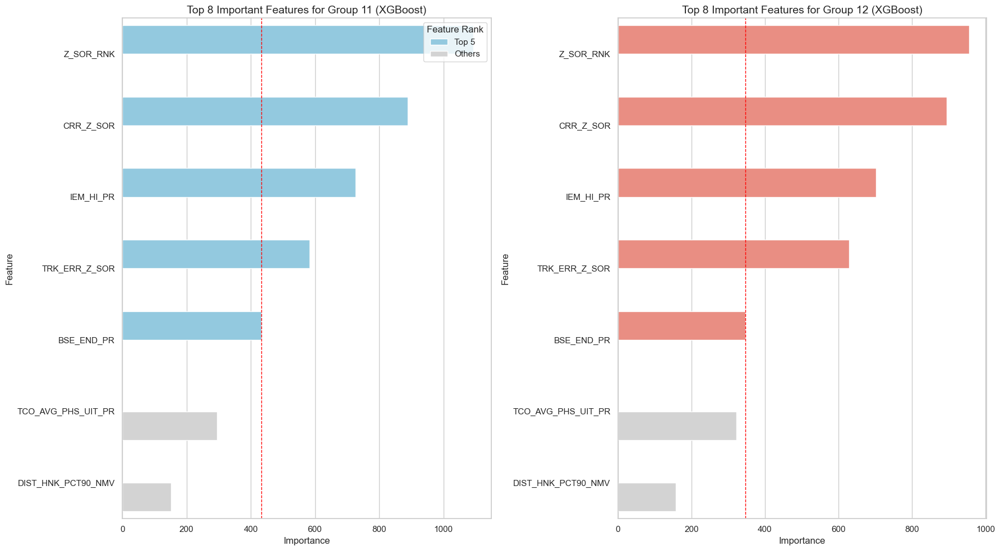

In [388]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import math
import pandas as pd
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# 예시로 데이터프레임 로드를 주석 해제하여 사용하세요.
# DIVIDEND = pd.read_csv("NH_CONTEST_DATA_HISTORICAL_DIVIDEND.csv")
# SCORE = pd.read_csv("NH_CONTEST_ETF_SOR_IFO.csv")
# ETF_Holding = pd.read_csv("NH_CONTEST_DATA_ETF_HOLDINGS.csv", encoding='EUC-KR')
# CUSTOMER = pd.read_csv("NH_CONTEST_NHDATA_CUS_TP_IFO.csv")
# INCOME_Outcome_Flow = pd.read_csv("NH_CONTEST_NHDATA_IFW_OFW_IFO.csv")
# DAY_Data = pd.read_csv("NH_CONTEST_NHDATA_STK_DD_IFO.csv", encoding='EUC-KR')
# STOCK_Explane = pd.read_csv("NH_CONTEST_NW_FC_STK_IEM_IFO.csv", encoding='EUC-KR')
# OHLCV = pd.read_csv("NH_CONTEST_STK_DT_QUT.csv")
# portfolio_return_B1 = pd.read_csv("path_to_portfolio_return_B1.csv")

# 모든 데이터프레임 열 이름을 대문자로 변경

# VIF 계산 함수
def calculate_vif(data):
    """
    VIF를 계산하기 위한 함수. 데이터프레임을 입력받아 각 특성의 VIF 값을 반환.
    """
    X = add_constant(data)
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif_data

# 데이터 준비 및 병합
merge_date_df_1 = merge_date_df[["BSE_DT"]+ grouped_features_dict["Price"]+grouped_features_dict["Profit"]  + grouped_features_dict["Scores"] + grouped_features_dict["Distribution"]]
# 필요한 경우, 위의 데이터 병합 방식을 그룹별로 조정해야 할 수 있습니다.
# 예를 들어, 각 그룹이 다른 데이터프레임에 속한다면, 이에 맞게 병합 방식을 수정해야 합니다.
# 아래는 예시입니다. 실제 데이터 구조에 맞게 조정하세요.
merged_df = pd.merge(merge_date_df_1, portfolio_return_B1, on='BSE_DT')

# 독립 변수와 종속 변수 설정
X = merged_df.drop(['BSE_DT', 'Group_11_return', 'Group_12_return'], axis=1)
y_group_11 = merged_df['Group_11_return']  # Group 11의 수익률
y_group_12 = merged_df['Group_12_return']  # Group 12의 수익률

# 데이터셋을 학습용과 테스트용으로 분할 (Group 11과 Group 12)
X_train_11, X_test_11, y_train_11, y_test_11 = train_test_split(X, y_group_11, test_size=0.2, random_state=42)
X_train_12, X_test_12, y_train_12, y_test_12 = train_test_split(X, y_group_12, test_size=0.2, random_state=42)

# XGBoost 모델 정의 및 학습 (Group 11)
model_11 = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.05, max_depth=6, random_state=42)
model_11.fit(X_train_11, y_train_11)

# XGBoost 모델 정의 및 학습 (Group 12)
model_12 = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.05, max_depth=6, random_state=42)
model_12.fit(X_train_12, y_train_12)

# Feature 중요도 추출 (Group 11)
importance_11 = model_11.get_booster().get_score(importance_type='weight')
importance_df_11 = pd.DataFrame({
    'Feature': list(importance_11.keys()),
    'Importance': list(importance_11.values())
}).sort_values(by='Importance', ascending=False)

# Feature 중요도 추출 (Group 12)
importance_12 = model_12.get_booster().get_score(importance_type='weight')
importance_df_12 = pd.DataFrame({
    'Feature': list(importance_12.keys()),
    'Importance': list(importance_12.values())
}).sort_values(by='Importance', ascending=False)

# 상위 8개 특성 추출 (Group 11)
top_8_features_11 = importance_df_11.nlargest(8, 'Importance')

# 상위 8개 특성 추출 (Group 12)
top_8_features_12 = importance_df_12.nlargest(8, 'Importance')

# 상위 5개 특징을 강조하기 위해 색상 컬럼 추가
def add_color_column(df):
    df = df.copy()
    if len(df) >= 5:
        df['Color'] = ['Top 5'] * 5 + ['Others'] * (len(df) - 5)
    else:
        df['Color'] = ['Top 5'] * len(df)
    return df

top_8_features_11 = add_color_column(top_8_features_11)
top_8_features_12 = add_color_column(top_8_features_12)

# 상위 8개 특징 시각화
fig, axes = plt.subplots(1, 2, figsize=(18, 10), sharey=False)

# Group 11 시각화
sns.barplot(
    x='Importance', 
    y='Feature', 
    hue='Color', 
    data=top_8_features_11, 
    palette={'Top 5': 'skyblue', 'Others': 'lightgray'}, 
    ax=axes[0]
)
# 상위 5개와 나머지 사이에 구분선 추가
if len(top_8_features_11) > 5:
    cutoff = top_8_features_11['Importance'].iloc[4]
    axes[0].axvline(x=cutoff, color='red', linestyle='--', linewidth=1)
axes[0].set_title('Top 8 Important Features for Group 11 (XGBoost)', fontsize=14)
axes[0].set_xlabel('Importance', fontsize=12)
axes[0].set_ylabel('Feature', fontsize=12)
axes[0].legend(title='Feature Rank', loc='upper right')

# Group 12 시각화
sns.barplot(
    x='Importance', 
    y='Feature', 
    hue='Color', 
    data=top_8_features_12, 
    palette={'Top 5': 'salmon', 'Others': 'lightgray'}, 
    ax=axes[1]
)
# 상위 5개와 나머지 사이에 구분선 추가
if len(top_8_features_12) > 5:
    cutoff = top_8_features_12['Importance'].iloc[4]
    axes[1].axvline(x=cutoff, color='red', linestyle='--', linewidth=1)
axes[1].set_title('Top 8 Important Features for Group 12 (XGBoost)', fontsize=14)
axes[1].set_xlabel('Importance', fontsize=12)
axes[1].set_ylabel('Feature', fontsize=12)
axes[1].legend_.remove()  # 오른쪽에 중복된 범례 제거

# 전체 레이아웃 조정
plt.tight_layout()
plt.show()

In [389]:
top_8_features_11

,Feature,Importance,Color
3,Z_SOR_RNK,1094.0,Top 5
4,CRR_Z_SOR,889.0,Top 5
0,IEM_HI_PR,727.0,Top 5
5,TRK_ERR_Z_SOR,584.0,Top 5
1,BSE_END_PR,433.0,Top 5
2,TCO_AVG_PHS_UIT_PR,295.0,Others
6,DIST_HNK_PCT90_NMV,152.0,Others


#### 결론
- Z_SOR_RNK
- CRR_Z_SOR
- IEM_HI_PR
- TRK_ERR_Z_SOR
- BSE_END_PR
-----
위 특성을 쓰고자 합니다.

## 특성 테이블 만들기

In [392]:
feature_list = rf_importance_12['Feature'].values.tolist()

In [393]:
import pandas as pd
import numpy as np
from functools import reduce

# 데이터프레임 매핑 설정
tables = {
    'DIVIDEND': DIVIDEND,
    'SCORE': SCORE,
    'ETF_Holding': ETF_Holding,
    'CUSTOMER': CUSTOMER,
    'INCOME_Outcome_Flow': INCOME_Outcome_Flow,
    'DAY_Data': DAY_Data,
    'STOCK_Explane': STOCK_Explane,
    'OHLCV': OHLCV
}

# 병합된 데이터프레임을 생성하는 함수
def generate_merged_df(feature_list):
    reshaped_dfs = []
    
    for feature_name in feature_list:
        found = False

        # 각 테이블에서 컬럼을 찾아 데이터프레임을 구성
        for table_name, df in tables.items():
            if feature_name in df.columns:
                found = True
                # ETF 식별자 컬럼 찾기
                etf_id_col = 'ETF_IEM_CD' if 'ETF_IEM_CD' in df.columns else 'TCK_IEM_CD'
                
                # 필터링 및 피벗
                df_filtered = df[df[etf_id_col].isin(divi_etf)].pivot(index='BSE_DT', columns=etf_id_col, values=feature_name)
                df_reset = df_filtered.reset_index()

                # BSE_DT를 datetime으로 변환
                if df_reset['BSE_DT'].dtype != 'datetime64[ns]':
                    df_reset['BSE_DT'] = pd.to_datetime(df_reset['BSE_DT'].astype(str), format='%Y%m%d')

                # melt 함수로 긴 형식으로 변환
                df_melted = df_reset.melt(id_vars=['BSE_DT'], var_name='ETF_ID', value_name=feature_name)

                # ETF_ID의 데이터 타입 통일
                df_melted['ETF_ID'] = df_melted['ETF_ID'].astype(str)
                reshaped_dfs.append(df_melted)
                break
        
        if not found:
            print(f"Feature '{feature_name}' is not found in any table.")

    # 데이터프레임을 순차적으로 병합
    merged_df = reduce(lambda left, right: pd.merge(left, right, on=['BSE_DT', 'ETF_ID'], how='outer'), reshaped_dfs)

    return merged_df

# 함수 사용 예시
features_to_include = feature_list
merged_df = generate_merged_df(features_to_include)
# 결과 확인
print(merged_df.isna().sum())

BSE_DT             0
ETF_ID             0
CRR_Z_SOR        425
Z_SOR_RNK        425
TRK_ERR_Z_SOR    425
BSE_END_PR       206
IEM_HI_PR        322
dtype: int64


In [394]:
# NaN이 포함된 행의 BSE_DT 값을 추출
nan_data_df = merged_df[merged_df.isna().any(axis=1)]
dates_with_nan = nan_data_df['BSE_DT'].unique()



In [395]:
dates_with_nan

array(['2024-06-28T00:00:00.000000000', '2024-08-27T00:00:00.000000000',
       '2024-06-19T00:00:00.000000000', '2024-07-04T00:00:00.000000000',
       '2024-06-06T00:00:00.000000000', '2024-08-15T00:00:00.000000000'],
      dtype='datetime64[ns]')

In [396]:
# merged_df에서 해당 날짜에 해당하는 모든 행 삭제
merged_df_cleaned = merged_df[~merged_df['BSE_DT'].isin(dates_with_nan)]

# 결과 확인
merged_df_cleaned

,BSE_DT,ETF_ID,CRR_Z_SOR,Z_SOR_RNK,TRK_ERR_Z_SOR,BSE_END_PR,IEM_HI_PR
0,2024-05-28,AWAY,13.771377,819.0,91.089109,27171.491,19.9900
1,2024-05-29,AWAY,13.579137,804.0,91.007194,26931.758,19.6803
2,2024-05-30,AWAY,11.341134,787.0,90.909091,26800.588,19.9900
3,2024-05-31,AWAY,11.891892,845.0,90.990991,27257.402,19.8800
4,2024-06-03,AWAY,11.101083,896.0,90.884477,27438.541,20.0500
...,...,...,...,...,...,...,...
6380,2024-08-20,XSD,15.008726,990.0,97.731239,314316.110,235.2300
6381,2024-08-21,XSD,14.682884,964.0,97.741095,310062.960,238.6000
6382,2024-08-22,XSD,14.509123,1003.0,97.741095,317137.848,238.9900
6383,2024-08-23,XSD,13.975694,1020.0,97.829861,308606.259,239.6400


In [397]:
# StandardScaler를 사용하여 데이터프레임 스케일링
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_features = scaler.fit_transform(merged_df_cleaned.iloc[:,2:])
merged_df_1 = merged_df_cleaned.copy()
merged_df_cleaned.iloc[:,2:] = scaled_features

In [398]:
merged_df_cleaned

,BSE_DT,ETF_ID,CRR_Z_SOR,Z_SOR_RNK,TRK_ERR_Z_SOR,BSE_END_PR,IEM_HI_PR
0,2024-05-28,AWAY,-1.047704,0.890276,1.240412,-0.977625,-0.977385
1,2024-05-29,AWAY,-1.054484,0.845609,1.237310,-0.979073,-0.979939
2,2024-05-30,AWAY,-1.133406,0.794987,1.233594,-0.979865,-0.977385
3,2024-05-31,AWAY,-1.113983,0.967698,1.236696,-0.977106,-0.978292
4,2024-06-03,AWAY,-1.141871,1.119564,1.232662,-0.976012,-0.976891
...,...,...,...,...,...,...,...
6380,2024-08-20,XSD,-1.004070,1.399475,1.491988,0.756971,0.797147
6381,2024-08-21,XSD,-1.015561,1.322053,1.492362,0.731278,0.824930
6382,2024-08-22,XSD,-1.021688,1.438186,1.492362,0.774017,0.828146
6383,2024-08-23,XSD,-1.040499,1.488808,1.495724,0.722479,0.833505


## 데이터 정규성 검증

spillover를 계산할때 window size가 필요함 
기존 데이터를 온전히 사용하기위해 과거 데이터를 yf에서 들고와 해당 데이터로 spillover를 추정함

In [399]:
## 데이터의 정규성 검정 shapiro테스트
import pandas as pd
import numpy as np
from scipy.stats import shapiro

# 각 컬럼에 대해 Shapiro-Wilk 테스트 수행
def normality_test(data):
    normality_results = {}
    for column in data.columns:
        stat, p_value = shapiro(data[column].dropna())  # NaN 값 제거
        normality_results[column] = {'Statistic': stat, 'p-value': p_value}

    # 결과 데이터프레임 생성
    normality_df = pd.DataFrame(normality_results).T
    
    # p-value가 0.05 이상인 경우 정규성을 만족하는 것으로 간주
    normality_ratio = (normality_df['p-value'] >= 0.05).mean()
    print(f"정규성을 만족하는 상품 비율은 전체의 {normality_ratio:.2%} 입니다.")

# 함수 호출 예시
normality_test(ETF_OHLCV_pivot_return)

정규성을 만족하는 상품 비율은 전체의 61.54% 입니다.


In [400]:
ETF_OHLCV_pivot_return.sum().sum()

6.291

생각보다 많은 데이터들이 정규서을 만족하지 않음  -> log_return으로 변경합니다. 

In [401]:
log_return = np.log(ETF_OHLCV_pivot_close / ETF_OHLCV_pivot_close.shift(1)).iloc[1:,:]

normality_test(log_return)


정규성을 만족하는 상품 비율은 전체의 61.54% 입니다.


기존 데이터의 수익률이 덜 정규성을 만족함으로 로그수익률을 사용합니다.

In [402]:
return_yf = daily_data_drop.pct_change().iloc[1:,:]
log_return_yf = np.log(daily_data_drop / daily_data_drop.shift(1)).iloc[1:,:]
normality_test(return_yf)
normality_test(log_return_yf)

정규성을 만족하는 상품 비율은 전체의 43.69% 입니다.
정규성을 만족하는 상품 비율은 전체의 33.98% 입니다.


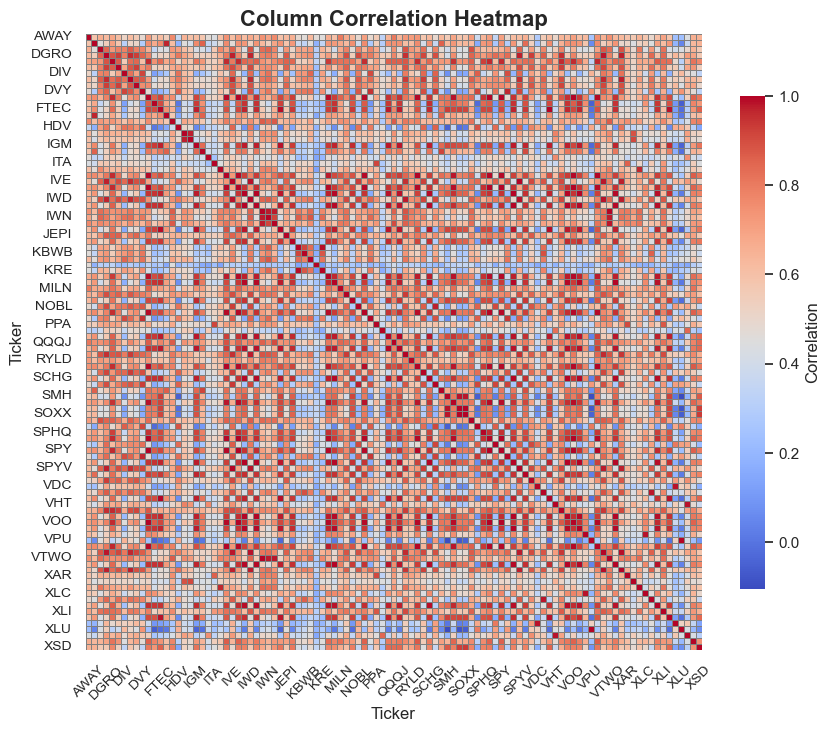

In [403]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
correlation_matrix = return_yf.corr()

# 히트맵 시각화
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=False, linewidths=0.5, linecolor='gray',
            cbar_kws={'shrink': 0.8, 'label': 'Correlation'},
            square=True)

# 그래프 설정
plt.title("Column Correlation Heatmap", fontsize=16, fontweight='bold')
plt.xticks(fontsize=10, rotation=45)
plt.yticks(fontsize=10, rotation=0)
plt.show()

In [404]:
correlation_matrix = return_yf.corr().abs()  # 절대값으로 변환하여 양수 기준으로 계산

# 상관계수 0.6 이상인 데이터 비율 계산
threshold = 0.5
correlation_high = correlation_matrix > threshold
np.fill_diagonal(correlation_high.values, False)  # 대각 요소는 제외

# 비율 계산
high_corr_count = correlation_high.sum().sum()  # 조건을 만족하는 요소 수
total_corr_count = correlation_matrix.size - len(df.columns)  # 전체 상관계수 개수 (대각 제외)
high_corr_ratio = high_corr_count / total_corr_count

# 결과 출력
print(f"상관계수가 0.6 이상인 데이터 비율: {high_corr_ratio:.2%}")

상관계수가 0.6 이상인 데이터 비율: 66.19%


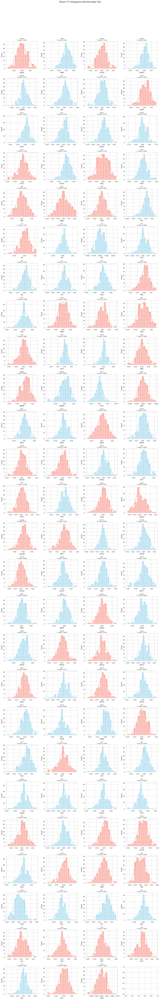

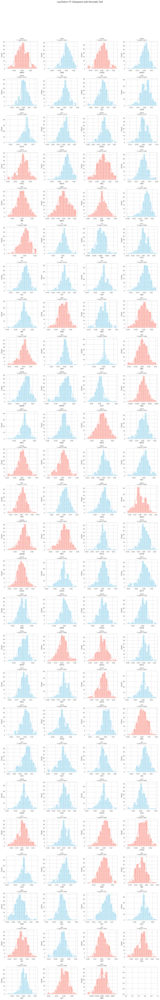

In [405]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import shapiro

# 히스토그램을 위한 서브플롯 생성 함수
def plot_histograms_with_pvalue(data, title, threshold=0.05):
    num_cols = len(data.columns)
    num_rows = int(np.ceil(num_cols / 4))
    fig, axes = plt.subplots(num_rows, 4, figsize=(16, 4 * num_rows))
    fig.suptitle(title, fontsize=16)

    for i, col in enumerate(data.columns):
        row, col_pos = divmod(i, 4)
        
        # 정규성 검정 수행
        stat, p_value = shapiro(data[col].dropna())
        
        # p-value에 따른 그래프 색상 설정
        color = "skyblue" if p_value < threshold else "salmon"
        sns.histplot(data[col].dropna(), kde=True, ax=axes[row, col_pos], color=color)
        
        # 그래프 제목에 p-value 표시
        axes[row, col_pos].set_title(f"{col}\nP-value: {p_value:.4f}", fontsize=10)
        
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# 히스토그램 플롯
plot_histograms_with_pvalue(return_yf, "Return YF Histograms with Normality Test", threshold=0.05)
plot_histograms_with_pvalue(log_return_yf, "Log Return YF Histograms with Normality Test", threshold=0.05)

# 히트맵 생성 (값 표시 없이 색상만)


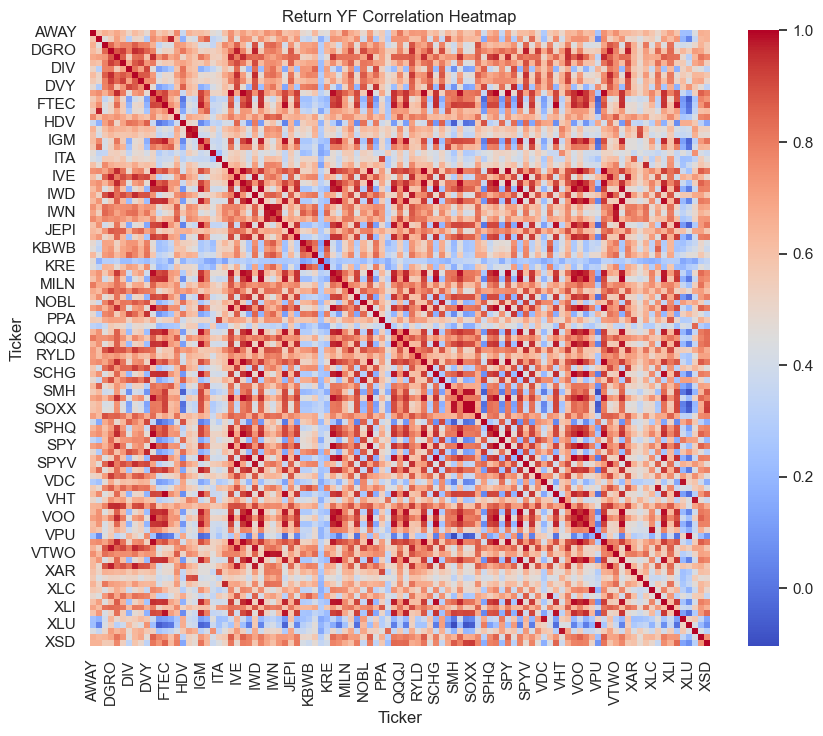

Return YF Statistics:
 Ticker        AWAY        CIBR        COWZ        DGRO        DGRW  \
count   167.000000  167.000000  167.000000  167.000000  167.000000   
mean      0.000106    0.000817    0.000700    0.000924    0.001009   
std       0.012490    0.011932    0.008705    0.005989    0.006727   
min      -0.034352   -0.050009   -0.024474   -0.023303   -0.026545   
25%      -0.008111   -0.005685   -0.004668   -0.002674   -0.002393   
50%      -0.000053    0.001052    0.000866    0.001270    0.001040   
75%       0.008325    0.008971    0.005863    0.004415    0.004704   
max       0.034430    0.027195    0.025156    0.016747    0.022140   

Ticker         DIA         DIV        DIVB        DIVO         DVY  ...  \
count   167.000000  167.000000  167.000000  167.000000  167.000000  ...   
mean      0.000675    0.000646    0.001016    0.000805    0.000872  ...   
std       0.006837    0.007540    0.006891    0.005356    0.007966  ...   
min      -0.025987   -0.024555   -0.024444   -

In [406]:
plt.figure(figsize=(10, 8))
sns.heatmap(return_yf.corr(), cmap="coolwarm", cbar=True)
plt.title("Return YF Correlation Heatmap")
plt.show()

# 통계량 출력
print("Return YF Statistics:\n", return_yf.describe())
print("\nLog Return YF Statistics:\n", log_return_yf.describe())

많은 자산들이 상관관계를 가지고 있음을 알 수 있습니다.

## spillover 계산 엣지 계산

In [407]:
import numpy as np
import pandas as pd
from statsmodels.tsa.api import VAR
from tqdm import tqdm

def compute_A_matrices(Phi_list, max_lags):
    N = Phi_list[0].shape[0]
    A_matrices = [np.eye(N)]  # A_0은 단위 행렬
    
    for i in range(1, max_lags + 1):
        A_i = np.zeros((N, N))
        for j in range(1, min(i, len(Phi_list)) + 1):
            A_i += Phi_list[j-1] @ A_matrices[i-j]
        A_matrices.append(A_i)
    
    return A_matrices

def kpps_fevd(results, A_matrices, H):
    sigma_u = results.sigma_u.to_numpy()  # 오차 공분산 행렬을 NumPy 배열로 변환
    n = sigma_u.shape[0]
    fevd_matrix = np.zeros((n, n, H))

    for h in range(H):
        for i in range(n):
            for j in range(n):
                numerator = 0
                denominator = 0
                for l in range(h + 1):
                    impact = A_matrices[l] @ sigma_u @ A_matrices[l].T
                    numerator += impact[i, j] ** 2
                    denominator += impact[i, i]
                fevd_matrix[i, j, h] = numerator / denominator if denominator != 0 else 0

    return fevd_matrix

def compute_spillover(group_data, window_size, horizon=5):
    spillover_matrices = []
    dates = []
    
    # PCA 적용이 필요한 경우 여기에 함수 정의 및 적용
    # group_data = apply_pca(group_data, variance_threshold=variance_threshold)
    
    # 날짜 기준으로 데이터프레임 정렬
    group_data = group_data.sort_index()
    
    # 롤링 윈도우를 사용하여 VAR 모델 적합
    for start in tqdm(range(len(group_data) - window_size + 1), desc="스필오버 매트릭스 계산 중"):
        end = start + window_size
        data_window = group_data.iloc[start:end]
        
        # Step 1: VAR 모델 적합
        model = VAR(data_window)
        try:
            results = model.fit(5)  # VAR(2) 모델; 필요에 따라 조정
        except np.linalg.LinAlgError:
            continue  # 모델 적합이 실패하면 해당 윈도우 건너뜀

        # Step 2: VAR 계수 추출
        Phi_list = [results.coefs[i] for i in range(results.k_ar)]
        
        # Step 3: A 매트릭스 계산
        A_matrices = compute_A_matrices(Phi_list, horizon)
        
        # Step 4: FEVD 매트릭스 계산
        gfevd_results = kpps_fevd(results, A_matrices, horizon)
        
        # Step 5: FEVD 정규화 (theta_tilde)
        theta_tilde = np.zeros_like(gfevd_results)
        for h in range(horizon):
            for i in range(gfevd_results.shape[0]):
                theta_sum = gfevd_results[i, :, h].sum()
                if theta_sum != 0:
                    theta_tilde[i, :, h] = gfevd_results[i, :, h] / theta_sum
        
        # Step 6: 원하는 지평선의 FEVD 선택
        selected_h = horizon - 1  # 0 기반 인덱스
        spillover_matrix = theta_tilde[:, :, selected_h]
        
        # Step 7: 스필오버 매트릭스를 pandas Series로 변환 (MultiIndex 사용)
        spillover_series = pd.Series(
            spillover_matrix.flatten(),
            index=pd.MultiIndex.from_product(
                [group_data.columns, group_data.columns],
                names=["From_ETF", "To_ETF"]
            )
        )
        
        # Step 8: 리스트에 추가
        spillover_matrices.append(spillover_series)
        dates.append(group_data.index[end-1])  # 윈도우의 마지막 날짜 저장
    
    # Step 9: 스필오버 매트릭스 리스트를 데이터프레임으로 변환
    spillover_df = pd.DataFrame(spillover_matrices, index=dates)
    spillover_long = spillover_df.stack(level=['From_ETF', 'To_ETF']).reset_index()
    spillover_long.columns = ['Time', 'From_ETF', 'To_ETF', 'Spillover_Value']
   
   
    
    return spillover_long


In [408]:
import warnings
#warnings.filterwarnings('default')
warnings.filterwarnings('ignore')

In [ ]:
spillover_long = compute_spillover(return_yf,window_size= 20, horizon = 5)

스필오버 매트릭스 계산 중: 100%|██████████| 128/128 [1:32:08<00:00, 43.19s/it]


In [441]:
spillover_long_vola = compute_spillover(volatility_ts,window_size= 20, horizon = 5)

스필오버 매트릭스 계산 중: 100%|██████████| 129/129 [1:00:21<00:00, 28.07s/it]


In [409]:
volatility_ts = return_yf.rolling(window=20).std()
volatility_ts = volatility_ts.dropna()

In [410]:
spillover_long_vola = pd.read_csv('spillover_long_vola.csv')

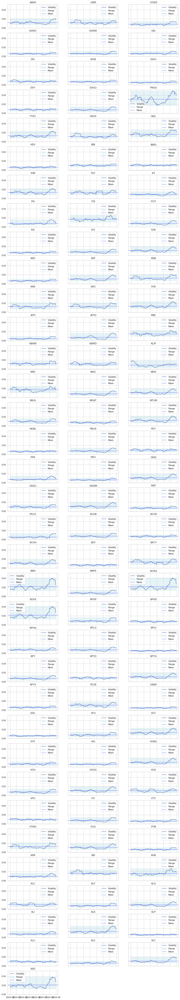

In [411]:
import matplotlib.pyplot as plt
import seaborn as sns

# 서브플롯 설정
num_assets = volatility_ts.shape[1]
num_cols = 3  # 한 행에 3개의 그래프
num_rows = (num_assets + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 2.5 * num_rows), sharex=True, sharey=True)
axes = axes.flatten()

# 각 자산별로 변동성 시계열을 플롯
for i, asset in enumerate(volatility_ts.columns):
    ax = axes[i]
    asset_volatility = volatility_ts[asset].dropna()
    
    # 평균값, 전체 최대값, 최소값 계산
    mean_val = asset_volatility.mean()
    min_val = asset_volatility.min()
    max_val = asset_volatility.max()
    
    # 변동성 시계열 플롯
    ax.plot(asset_volatility.index, asset_volatility, color='b', label='Volatility')
    
    # 평균값과 범위 영역 추가
    ax.fill_between(asset_volatility.index, min_val, max_val, color='lightblue', alpha=0.3, label='Range')
    ax.axhline(mean_val, color='blue', linestyle='--', linewidth=1, label='Mean')
    
    # 제목과 스타일 설정
    ax.set_title(asset)
    ax.grid(True)
    ax.legend()

# 남은 빈 서브플롯 제거
for j in range(num_assets, len(axes)):
    fig.delaxes(axes[j])

# 전체 평균, 최대, 최소값의 시계열 계산
overall_mean = volatility_ts.mean(axis=1)
overall_min = volatility_ts.min(axis=1)
overall_max = volatility_ts.max(axis=1)

# 전체 시계열 평균, 최대, 최소값 플롯


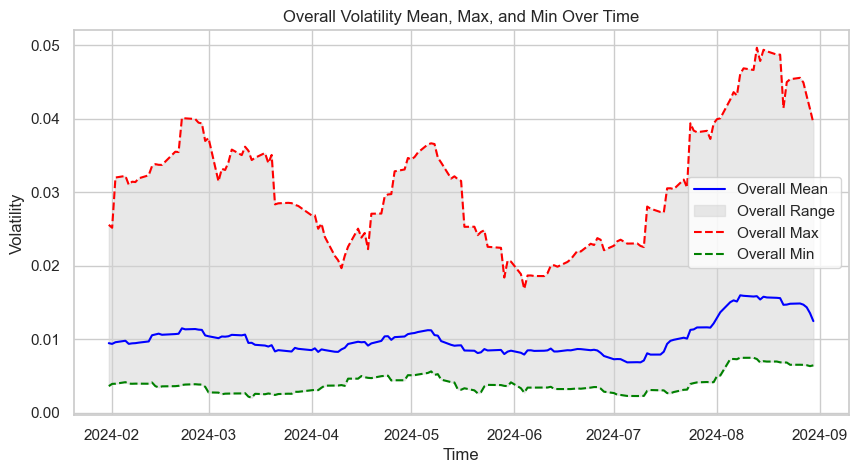

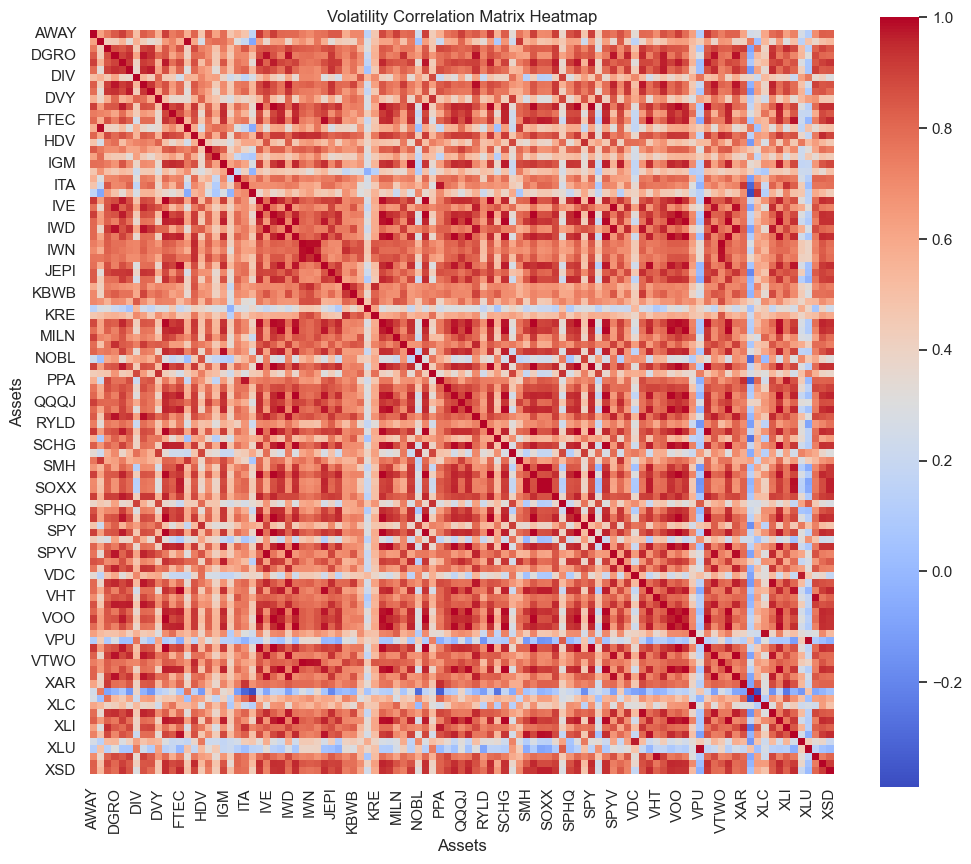

In [412]:
import matplotlib.pyplot as plt
import seaborn as sns

# 전체 평균, 최대, 최소값의 시계열 계산
overall_mean = volatility_ts.mean(axis=1)
overall_min = volatility_ts.min(axis=1)
overall_max = volatility_ts.max(axis=1)

# 전체 시계열 평균, 최대, 최소값 플롯
plt.figure(figsize=(10, 5))
plt.plot(overall_mean.index, overall_mean, label='Overall Mean', color='blue')
plt.fill_between(overall_mean.index, overall_min.values, overall_max.values, color='lightgrey', alpha=0.5, label='Overall Range')
plt.plot(overall_max.index, overall_max, label='Overall Max', color='red', linestyle='--')
plt.plot(overall_min.index, overall_min, label='Overall Min', color='green', linestyle='--')

plt.title("Overall Volatility Mean, Max, and Min Over Time")
plt.xlabel("Time")
plt.ylabel("Volatility")
plt.legend()
plt.grid(True)
plt.show()

correlation_matrix = volatility_ts.corr()

# 상관 관계 히트맵 생성
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, cmap='coolwarm', cbar=True, square=True, annot=False)
plt.title("Volatility Correlation Matrix Heatmap")
plt.xlabel("Assets")
plt.ylabel("Assets")
plt.show()

### 일정한 패턴이 보이는 것 같음

In [413]:
# spillover_long.to_csv('spillover_long.csv')

In [414]:
# spillover_long_vola.to_csv('spillover_long_vola.csv')

### spillover가 edge가 되기 충분한가?

In [415]:
filtered_df = spillover_long_vola[spillover_long_vola['To_ETF'] != spillover_long_vola['From_ETF']]

# Date와 To_ETF별로 그룹화하여 Spillover_Value 합계 계산
spillover_sum_by_date = filtered_df.groupby(['Time', 'From_ETF'])['Spillover_Value'].sum().reset_index()


In [416]:
spillover_sum_by_date

,Time,From_ETF,Spillover_Value
0,2024-02-28,AWAY,0.985446
1,2024-02-28,CIBR,0.952715
2,2024-02-28,COWZ,0.994119
3,2024-02-28,DGRO,0.997105
4,2024-02-28,DGRW,0.994502
...,...,...,...
13282,2024-08-30,XLP,0.993313
13283,2024-08-30,XLU,0.993877
13284,2024-08-30,XLV,0.991580
13285,2024-08-30,XLY,0.981903


In [417]:
total_vola_spillover = spillover_sum_by_date.groupby('Time')['Spillover_Value'].mean()

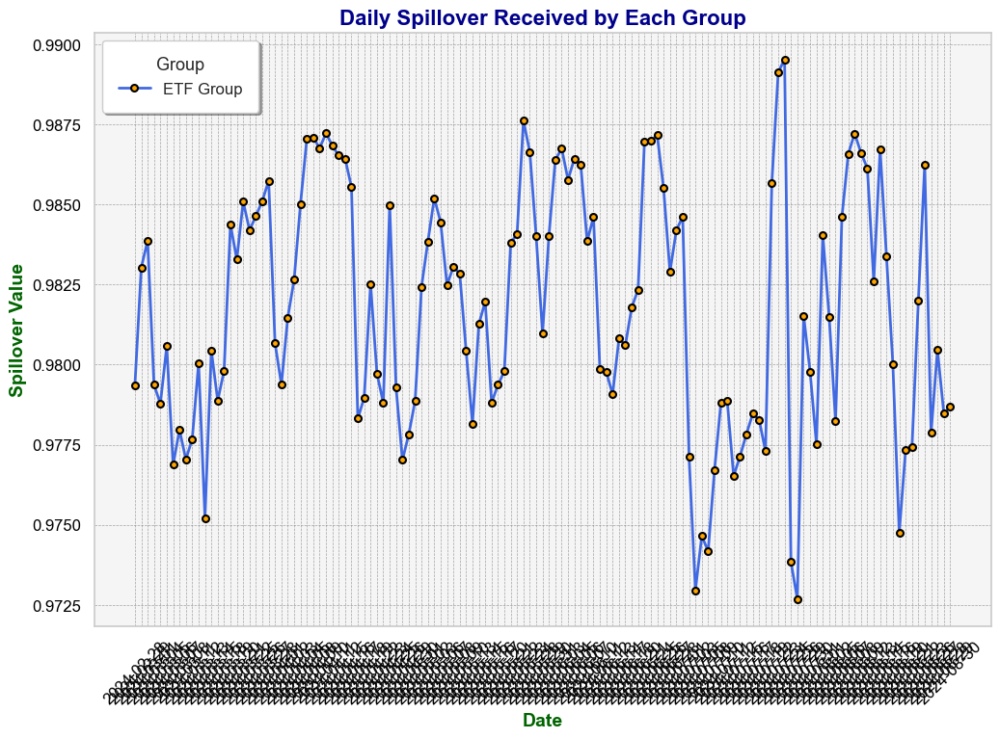

In [418]:
import matplotlib.pyplot as plt

# Plotting the spillover data with customized appearance
plt.figure(figsize=(12, 8))

# 주요 스타일 추가
plt.plot(total_vola_spillover, color='royalblue', linestyle='-', linewidth=2, marker='o', markersize=5, markerfacecolor='orange', markeredgewidth=1.5, markeredgecolor='black')

# Adding title and labels with customized fonts
plt.title("Daily Spillover Received by Each Group", fontsize=16, fontweight='bold', color='darkblue')
plt.xlabel("Date", fontsize=14, fontweight='bold', color='darkgreen')
plt.ylabel("Spillover Value", fontsize=14, fontweight='bold', color='darkgreen')

# Adding legend and customizing its position and appearance
plt.legend(["ETF Group"], loc='upper left', fontsize=12, title="Group", title_fontsize='13', fancybox=True, shadow=True, borderpad=1)

# Adding grid with a subtle line style
plt.grid(True, linestyle='--', linewidth=0.5, color='grey', alpha=0.7)

# Customizing ticks and tick labels
plt.xticks(fontsize=12, rotation=45, color='black')
plt.yticks(fontsize=12, color='black')

# Adding background color to the plot area
plt.gca().set_facecolor('whitesmoke')

plt.show()

## egde

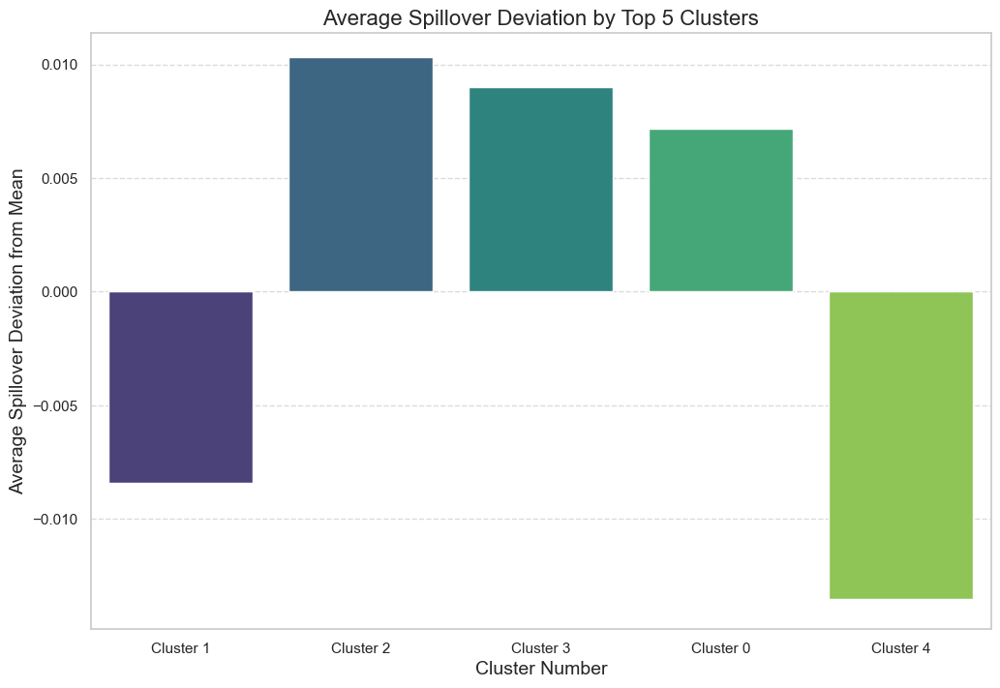

p-value 값이 0.0 임으로, 집단간의 유의미한 차이가 존재합니다.
p-value 값이 0.0000 임으로, 집단간의 유의미한 차이가 존재합니다.
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower   upper  reject
---------------------------------------------------
     0      1   0.0188   0.0  0.0185   0.019   True
     0      2   0.0174   0.0  0.0172  0.0177   True
     0      3   0.0156   0.0  0.0153  0.0159   True
     0      4  -0.0051   0.0 -0.0053 -0.0049   True
     1      2  -0.0013   0.0 -0.0016 -0.0011   True
     1      3  -0.0032   0.0 -0.0035 -0.0029   True
     1      4  -0.0238   0.0 -0.0241 -0.0236   True
     2      3  -0.0018   0.0 -0.0021 -0.0016   True
     2      4  -0.0225   0.0 -0.0227 -0.0223   True
     3      4  -0.0207   0.0 -0.0209 -0.0204   True
---------------------------------------------------


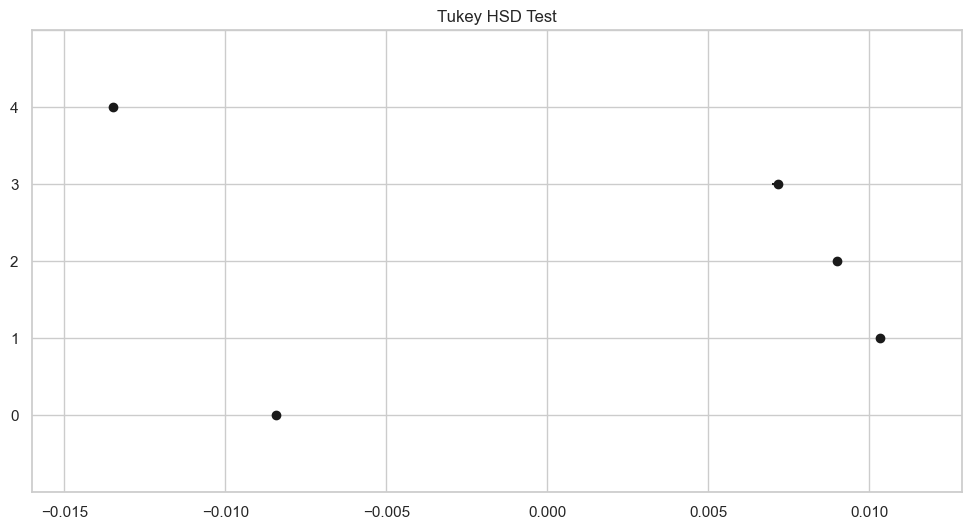

In [419]:
import pandas as pd
from sklearn.cluster import AgglomerativeClustering
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import f_oneway
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.multicomp import pairwise_tukeyhsd
# 데이터 준비
# 이미 merged_df_cleaned와 spillover_sum_by_date가 정의되어 있다고 가정합니다.
# merged_df_cleaned: ETF별 특징이 포함된 데이터프레임
# spillover_sum_by_date: ETF 간 Spillover 값을 포함한 데이터프레임

# 예시 데이터 로드 (실제 데이터로 교체하세요)
# merged_df_cleaned = pd.read_csv('path_to_merged_df_cleaned.csv')
# spillover_sum_by_date = pd.read_csv('path_to_spillover_sum_by_date.csv')

# 클러스터링에 사용할 특징들을 동적으로 선택
feature_cols = merged_df_cleaned.iloc[:, 2:].columns.tolist()

# 특징들의 평균 계산
feature_means = merged_df_cleaned[feature_cols].mean()

# Spillover 값의 평균 계산
spillover_mean = spillover_sum_by_date['Spillover_Value'].mean()

# 특징들의 평균을 빼서 중앙 정렬 (편차 계산)
merged_df_cleaned[feature_cols] = merged_df_cleaned[feature_cols] - feature_means

# Spillover 값의 평균을 빼서 중앙 정렬
spillover_sum_by_date['Spillover_Value'] = spillover_sum_by_date['Spillover_Value'] - spillover_mean



# 클러스터 수 설정 (예: 5)
k = 5

# 계층적 군집화 (Agglomerative Clustering) 수행
agg_clustering = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward')
merged_df_cleaned['Cluster'] = agg_clustering.fit_predict(merged_df_cleaned[feature_cols])

# 클러스터링 결과를 Spillover 데이터와 병합
# 병합 키가 정확한지 확인 (예: 'ETF_ID'와 'From_ETF')
# 만약 병합 키가 다르다면, 올바른 키로 수정해야 합니다.
merged_df = pd.merge(merged_df_cleaned, spillover_sum_by_date, left_on='ETF_ID', right_on='From_ETF')

# 클러스터별 평균 Spillover Deviation 계산
clustered_spillover = merged_df.groupby('Cluster')['Spillover_Value'].mean().sort_values(ascending=False)

# 상위 8개 클러스터 선택 (클러스터 수가 8보다 작을 경우 조정)
top_k = 8
if k < top_k:
    top_k = k
clustered_spillover = clustered_spillover.iloc[:top_k]

# 클러스터별 평균 Spillover Deviation 시각화
plt.figure(figsize=(12, 8))
sns.barplot(x=clustered_spillover.index, y=clustered_spillover.values, palette="viridis")

plt.title(f"Average Spillover Deviation by Top {top_k} Clusters", fontsize=16)
plt.xlabel("Cluster Number", fontsize=14)
plt.ylabel("Average Spillover Deviation from Mean", fontsize=14)

# y축 한계 설정 (데이터 범위에 약간의 여유 추가)
plt.ylim(min(clustered_spillover.values)*1.1, max(clustered_spillover.values)*1.1)

# x축 레이블 설정
plt.xticks(ticks=range(len(clustered_spillover)), labels=[f"Cluster {i}" for i in clustered_spillover.index])

# y축 그리드 추가
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 상위 5개 클러스터와 나머지 클러스터를 구분하기 위한 빨간색 점선 추가
if top_k > 5:
    plt.axvline(x=4.5, color='red', linestyle='--', linewidth=1)

# 그래프 표시
plt.show()

# 덴드로그램 시각화 (옵션)
# plt.figure(figsize=(15, 7))
# linked = linkage(merged_df_cleaned[feature_cols], method='ward')
# dendrogram(linked,
#            orientation='top',
#            distance_sort='descending',
#            show_leaf_counts=False)
# plt.title('Dendrogram for Hierarchical Clustering')
# plt.xlabel('Sample index')
# plt.ylabel('Distance')
# plt.show()

# ANOVA 테스트: 클러스터 간 Spillover Deviation의 차이가 유의미한지 검정
anova_data = [merged_df[merged_df['Cluster'] == cluster]['Spillover_Value'] for cluster in clustered_spillover.index]
anova_result = f_oneway(*anova_data)

# ANOVA 결과 출력
if anova_result.pvalue < 0.05:
    print(f'p-value 값이 {anova_result.pvalue} 임으로, 집단간의 유의미한 차이가 존재합니다.')
else:
    print('집단간 차이가 존재하지 않습니다.')

if anova_result.pvalue < 0.05:
    print(f'p-value 값이 {anova_result.pvalue:.4f} 임으로, 집단간의 유의미한 차이가 존재합니다.')
    
    # 사후 검정 수행 (Tukey's HSD)
    tukey = pairwise_tukeyhsd(endog=merged_df['Spillover_Value'],
                              groups=merged_df['Cluster'],
                              alpha=0.05)
    print(tukey)
    
    # 시각화
    tukey.plot_simultaneous(figsize=(12,6))
    plt.title('Tukey HSD Test')
    plt.show()
else:
    print('집단간 차이가 존재하지 않습니다.')

특성 데이터를 통해 데이터를 군집화 하고 해당 군집에 속해있는 자산의 spillover값을 비교하였습니다.
각 군집에서 spillover값은 전체 데이터에서 상당히 이질적인 모습을 보였습니다. 즉, spillover가 노드의 특성을 잘 구분지을 수 있을 것입니다. 

즉, spillover를 edge로 쓸 것입니다. 

## GNN 모델 구축

In [420]:
import pandas as pd

In [421]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv
from torch.optim import Adam
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt


In [422]:
# merged_df = merged_df.fillna(method='backfill')

In [423]:
import torch
import pandas as pd
from torch_geometric.data import Data

# 재현성을 위해 시드 고정
np.random.seed(10)
torch.manual_seed(10)

def construct_temporal_graphs(spillover_df, etf_features_df):

    """
    스필오버 데이터와 ETF 특성 데이터를 기반으로 시변 그래프 데이터 리스트를 생성합니다.

    Parameters:
    - spillover_df (pd.DataFrame): 스필오버 데이터 (spillover_long).
    - etf_features_df (pd.DataFrame): ETF 특성 데이터 (merged_df_cleaned).

    Returns:
    - temporal_graphs (list of Data): 시변 그래프 데이터 리스트.
    """

    # 날짜 컬럼 이름 통일 ('Time'으로)
    spillover_df['Time'] = pd.to_datetime(spillover_df['Time'])
    etf_features_df['Time'] = pd.to_datetime(etf_features_df['BSE_DT'])

    # 공통된 날짜와 ETF ID 추출
    common_times = sorted(set(spillover_df['Time']) & set(etf_features_df['Time']))
    common_etf_ids = sorted(set(spillover_df['From_ETF']) & set(spillover_df['To_ETF']) & set(etf_features_df['ETF_ID']))

    # 공통 시간과 ETF ID로 데이터 필터링
    spillover_df = spillover_df[spillover_df['Time'].isin(common_times) & spillover_df['From_ETF'].isin(common_etf_ids) & spillover_df['To_ETF'].isin(common_etf_ids)]
    etf_features_df = etf_features_df[etf_features_df['Time'].isin(common_times) & etf_features_df['ETF_ID'].isin(common_etf_ids)]

    # 시간별로 ETF 특성 데이터 그룹화
    etf_features_grouped = etf_features_df.groupby('Time')
    spillover_grouped = spillover_df.groupby('Time')

    temporal_graphs = []

    # 공통 시간 리스트로 그래프 생성
    for time in common_times:
        # 해당 시간의 스필오버 데이터
        spillover_group = spillover_grouped.get_group(time)

        # 해당 시간의 ETF 특성 데이터
        etf_features_group = etf_features_grouped.get_group(time)

        # 시간별 ETF ID만으로 인덱스 생성
        etf_ids_time = etf_features_group['ETF_ID'].unique()
        etf_id_to_idx_time = {etf_id: idx for idx, etf_id in enumerate(etf_ids_time)}

        # 노드 특성 준비
        node_features_df = etf_features_group.set_index('ETF_ID').loc[etf_ids_time]
        node_features = torch.tensor(node_features_df.drop(columns=['Time', 'BSE_DT']).values, dtype=torch.float)

        # 노드 특성 정규화
        node_features = (node_features - node_features.mean(dim=0)) / node_features.std(dim=0)

        # 엣지와 가중치 추출
        from_nodes = spillover_group['From_ETF'].map(etf_id_to_idx_time).dropna().astype(int).values
        to_nodes = spillover_group['To_ETF'].map(etf_id_to_idx_time).dropna().astype(int).values

        edge_index = torch.tensor([from_nodes, to_nodes], dtype=torch.long)
        edge_attr = torch.tensor(spillover_group['Spillover_Value'].values, dtype=torch.float).unsqueeze(1)  # Feature 차원 추가

        # 그래프 데이터 생성
        data = Data(x=node_features, edge_index=edge_index, edge_attr=edge_attr)
        temporal_graphs.append(data)

    return temporal_graphs

# 시변 그래프 데이터 생성
temporal_graphs = construct_temporal_graphs(spillover_long_vola, merged_df_cleaned.iloc[:,:-1]) # cluster 부분
print("\n시변 그래프 데이터 요약:")
print(f"시간 단계 수: {len(temporal_graphs)}")
print(f"노드 수 (첫 번째 시간 단계): {temporal_graphs[0].num_nodes}")
print(f"엣지 수 (첫 번째 시간 단계): {temporal_graphs[0].num_edges}")


시변 그래프 데이터 요약:
시간 단계 수: 60
노드 수 (첫 번째 시간 단계): 103
엣지 수 (첫 번째 시간 단계): 10609


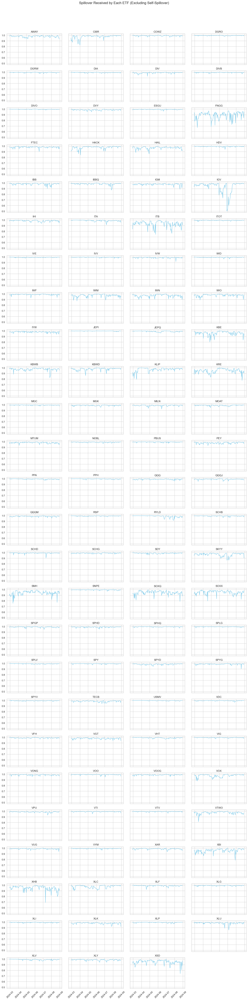

In [424]:
import pandas as pd
import matplotlib.pyplot as plt

# 모든 ETF에 대해 자기 자신에게 준 스필오버를 제외한 값을 계산
etf_list = spillover_long_vola['From_ETF'].unique()
spillover_timeseries = {}

for etf in etf_list:
    # 특정 ETF가 받는 스필오버 값 중 자기 자신에게 준 스필오버를 제외한 데이터 필터링
    etf_spillover = spillover_long_vola[(spillover_long_vola['From_ETF'] == etf) & (spillover_long_vola['To_ETF'] != etf)]
    
    # 날짜별 스필오버 합계 계산
    etf_spillover_sum = etf_spillover.groupby('Time')['Spillover_Value'].sum()
    spillover_timeseries[etf] = etf_spillover_sum

# DataFrame 생성
spillover_df_timeseries = pd.DataFrame(spillover_timeseries)

# 서브플롯 설정
num_etfs = len(spillover_df_timeseries.columns)
num_cols = 4  # 한 행에 4개의 서브플롯
num_rows = (num_etfs + num_cols - 1) // num_cols  # 필요 행 수 계산

fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 2.5 * num_rows), sharex=True, sharey=True)
axes = axes.flatten()

# 각 ETF별 시계열 데이터를 서브플롯으로 생성
for i, etf in enumerate(spillover_df_timeseries.columns):
    axes[i].plot(spillover_df_timeseries.index, spillover_df_timeseries[etf], label=etf, color="skyblue")
    axes[i].set_title(etf)
    axes[i].grid(True)
    axes[i].tick_params(axis='x', rotation=45)

# 빈 서브플롯 제거
for i in range(num_etfs, len(axes)):
    fig.delaxes(axes[i])

plt.suptitle("Spillover Received by Each ETF (Excluding Self-Spillover)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # 전체 레이아웃 설정
plt.show()

In [427]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau
import matplotlib.pyplot as plt
import random

# =========================
# 0. 재현성을 위한 랜덤 시드 설정
# =========================

random_seed = 42
np.random.seed(random_seed)
torch.manual_seed(random_seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed(random_seed)
    torch.cuda.manual_seed_all(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
random.seed(random_seed)

# =========================
# 1. 데이터 전처리 (노드 특성 정규화 추가)
# =========================

# 각 그래프의 노드 특성을 정규화합니다.
for graph in temporal_graphs:
    mean = graph.x.mean(dim=0, keepdim=True)
    std = graph.x.std(dim=0, keepdim=True) + 1e-6  # 분모가 0이 되지 않도록 작은 값 추가
    graph.x = (graph.x - mean) / std

# =========================
# 2. 모델 정의 및 학습
# =========================

class TemporalGNN(nn.Module):
    def __init__(self, node_feature_size, hidden_size, embedding_size, num_gcn_layers=10, dropout=0.5):
        super(TemporalGNN, self).__init__()
        
        # 다중 GCN 레이어와 Residual Connection
        self.gcn_layers = nn.ModuleList()
        for i in range(num_gcn_layers):
            in_channels = node_feature_size if i == 0 else hidden_size
            self.gcn_layers.append(GCNConv(in_channels, hidden_size))
        
        # 배치 정규화 레이어
        self.batch_norms = nn.ModuleList([nn.BatchNorm1d(hidden_size) for _ in range(num_gcn_layers)])
        
        # GRU 레이어에 드롭아웃 추가
        self.gru = nn.GRU(hidden_size, hidden_size, batch_first=True, dropout=dropout)
        
        # 임베딩과 디코더 레이어
        self.embedding = nn.Linear(hidden_size, embedding_size)
        self.decoder = nn.Linear(embedding_size, node_feature_size)
        
        # 드롭아웃
        self.dropout = nn.Dropout(dropout)
    
    def forward(self, graph_sequence):
        hidden = None
        embeddings = []
        reconstructions = []
        
        for graph in graph_sequence:
            x = graph.x
            residual = x  # Residual Connection을 위한 저장
            for i, gcn in enumerate(self.gcn_layers):
                x = gcn(x, graph.edge_index)
                x = torch.relu(x)
                x = self.batch_norms[i](x)
                x = self.dropout(x)
                if i == 0 and x.shape == residual.shape:
                    x = x + residual  # Residual Connection
            
            # GRU를 통해 시퀀스 처리
            x = x.unsqueeze(0)  # 배치 차원 추가: (1, num_nodes, hidden_size)
            output, hidden = self.gru(x, hidden)
            output = output.squeeze(0)  # (num_nodes, hidden_size)
            
            # 임베딩 생성
            emb = self.embedding(output)
            embeddings.append(emb)
            
            # 노드 특성 재구성
            recon = self.decoder(emb)
            reconstructions.append(recon)
        
        return reconstructions, embeddings

def train_model(temporal_graphs, node_feature_size, hidden_size=256, embedding_size=64, num_gcn_layers=10, learning_rate=0.001, epochs=300, patience=20, weight_decay=1e-4):
    """
    시변 그래프 신경망 모델을 학습시킵니다.

    Parameters:
    - temporal_graphs (list of Data): 시변 그래프 데이터 리스트.
    - node_feature_size (int): 노드 특성의 크기.
    - hidden_size (int): 은닉층 크기.
    - embedding_size (int): 임베딩 크기.
    - num_gcn_layers (int): GCN 레이어 수.
    - learning_rate (float): 옵티마이저 학습률.
    - epochs (int): 학습 에폭 수.
    - patience (int): 조기 종료를 위한 에폭 수.
    - weight_decay (float): L2 정규화를 위한 weight decay 값.

    Returns:
    - model (TemporalGNN): 학습된 모델.
    - embeddings (torch.Tensor): 최종 노드 임베딩.
    - loss_history (list): 학습 손실 기록.
    """
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = TemporalGNN(node_feature_size, hidden_size, embedding_size, num_gcn_layers=num_gcn_layers, dropout=0.5).to(device)
    optimizer = Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.8, patience=10, verbose=True)
    criterion = nn.MSELoss()
    
    best_loss = float('inf')
    epochs_no_improve = 0
    loss_history = []

    model.train()
    
    for epoch in range(epochs):
        total_loss = 0
        for t in range(len(temporal_graphs) - 1):
            graph_current = temporal_graphs[t].to(device)
            graph_next = temporal_graphs[t + 1].to(device)
            optimizer.zero_grad()
            
            # 현재 그래프로부터 재구성 및 임베딩
            recon, embeddings_batch = model([graph_current])
            recon = recon[0]  # 첫 번째 (유일한) 그래프의 재구성 결과
            
            # 목표값: 다음 시간 단계의 노드 특성
            target = graph_next.x
            
            # 손실 계산
            loss = criterion(recon, target)
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item()
        
        # 평균 손실 기록
        avg_loss = total_loss / (len(temporal_graphs) - 1)
        loss_history.append(avg_loss)
        
        # 학습률 스케줄러에 현재 손실 전달
        scheduler.step(avg_loss)
        
        # 조기 종료 조건 확인
        if avg_loss < best_loss:
            best_loss = avg_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1

        if epochs_no_improve >= patience:
            print(f"조기 종료: {epoch+1} 에폭에서 개선이 없으므로 학습을 종료합니다.")
            break
        
        # 10 에폭마다 손실 출력
        if (epoch + 1) % 10 == 0 or epoch == 0:
            print(f'Epoch {epoch+1}/{epochs}, Loss: {avg_loss:.4f}')
    
    # 학습 완료 후 마지막 시간 단계의 임베딩 추출
    model.eval()
    with torch.no_grad():
        recon, embeddings = model([temporal_graphs[-1].to(device)])
        embeddings = embeddings[0].cpu()
    
    return model, embeddings, loss_history

# =========================
# 모델 학습
# =========================

print("\n시변 그래프 신경망 모델 학습 중...")

# 모델 하이퍼파라미터 설정
node_feature_size = 5  # 실제 노드 특성 수로 설정
hidden_size = 256
embedding_size = 30
num_gcn_layers = 10  # GCN 레이어 수

model, embeddings, loss_history = train_model(
    temporal_graphs=temporal_graphs,
    node_feature_size=node_feature_size,
    hidden_size=hidden_size,
    embedding_size=embedding_size,
    num_gcn_layers=num_gcn_layers,
    learning_rate=0.001,
    epochs=500,
    patience=40,  # 조기 종료를 위한 설정
    weight_decay=1e-4  # L2 정규화 추가
)
print("모델 학습 완료.")

# =========================
# 손실 그래프 그리기
# =========================

plt.figure(figsize=(10, 5))
plt.plot(loss_history, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title(f'Training Loss over Epochs\nLayers: {num_gcn_layers}, Hidden Size: {hidden_size}')
plt.legend()
plt.grid(True)
plt.show()


시변 그래프 신경망 모델 학습 중...
Epoch 1/500, Loss: 0.9773


KeyboardInterrupt: 

In [296]:
model



TemporalGNN(
  (gcn_layers): ModuleList(
    (0): GCNConv(5, 32)
    (1): GCNConv(32, 32)
    (2): GCNConv(32, 32)
    (3): GCNConv(32, 32)
    (4): GCNConv(32, 32)
    (5): GCNConv(32, 32)
    (6): GCNConv(32, 32)
    (7): GCNConv(32, 32)
    (8): GCNConv(32, 32)
    (9): GCNConv(32, 32)
  )
  (batch_norms): ModuleList(
    (0): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): BatchNorm1d(32, eps=1e-05, momentum=0.1, affi

In [297]:
import plotly.io as pio
pio.renderers.default = 'notebook_connected'

In [298]:
import plotly.graph_objects as go
import networkx as nx

def visualize_graph_plotly(graph_data, etf_labels=None):
    """
    Plotly를 사용한 그래프 시각화 함수.

    Parameters:
    - graph_data (Data): GNN에서 사용된 그래프 데이터 (torch_geometric.data.Data 형식).
    - etf_labels (list of str): ETF 라벨 목록 (optional).
    """
    # NetworkX 그래프 생성
    G = nx.Graph()
    
    # 노드 추가
    num_nodes = graph_data.num_nodes
    for i in range(num_nodes):
        G.add_node(i)
    
    # 엣지 추가 (엣지 속성으로 가중치 추가)
    edge_index = graph_data.edge_index.cpu().numpy()
    edge_attr = graph_data.edge_attr.cpu().numpy().flatten()
    
    for i in range(edge_index.shape[1]):
        source = edge_index[0, i]
        target = edge_index[1, i]
        weight = edge_attr[i]
        G.add_edge(source, target, weight=weight)
    
    # 그래프 레이아웃 설정 (spring_layout은 노드 간의 힘 기반 레이아웃)
    pos = nx.spring_layout(G, seed=42)

    # Plotly를 위한 엣지 좌표 준비
    edge_x = []
    edge_y = []
    for edge in G.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.append(x0)
        edge_x.append(x1)
        edge_x.append(None)  # 선의 끝을 표시하기 위한 None
        edge_y.append(y0)
        edge_y.append(y1)
        edge_y.append(None)

    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=0.5, color='#888'),
        hoverinfo='none',
        mode='lines')

    # 노드 좌표 및 특성 준비
    node_x = []
    node_y = []
    for node in G.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)

    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers+text',
        text=etf_labels,
        textposition="top center",
        hoverinfo='text',
        marker=dict(
            showscale=True,
            colorscale='YlGnBu',
            size=20,
            colorbar=dict(
                thickness=15,
                title='Node Connections',
                xanchor='left',
                titleside='right'
            ),
            line_width=2))

    # 그래프 그리기
    fig = go.Figure(data=[edge_trace, node_trace],
                    layout=go.Layout(
                        title='<br>Interactive Graph Visualization(Before learning)',
                        titlefont_size=16,
                        showlegend=False,
                        hovermode='closest',
                        margin=dict(b=0, l=0, r=0, t=40),
                        xaxis=dict(showgrid=False, zeroline=False),
                        yaxis=dict(showgrid=False, zeroline=False))
                    )
    fig.show()

# 그래프 시각화 예시 (첫 번째 시간 단계의 그래프를 사용)
etf_labels = merged_df_cleaned['ETF_ID'].unique().tolist()# ETF 라벨이 있다면 사용
visualize_graph_plotly(temporal_graphs[0], etf_labels)

In [299]:
import plotly.graph_objects as go
import networkx as nx

def visualize_learned_graph(graph_data, embeddings, etf_labels=None):
    """
    학습된 그래프의 노드 및 엣지 관계를 시각화하는 함수.

    Parameters:
    - graph_data (Data): GNN에서 사용된 그래프 데이터 (torch_geometric.data.Data 형식).
    - embeddings (torch.Tensor): 학습된 노드 임베딩 텐서.
    - etf_labels (list of str): ETF 라벨 목록 (optional).
    """
    # NetworkX 그래프 생성
    G = nx.Graph()
    
    # 노드 추가
    num_nodes = graph_data.num_nodes
    for i in range(num_nodes):
        G.add_node(i)
    
    # 엣지 추가 (엣지 속성으로 가중치 추가)
    edge_index = graph_data.edge_index.cpu().numpy()
    edge_attr = graph_data.edge_attr.cpu().numpy().flatten()
    
    for i in range(edge_index.shape[1]):
        source = edge_index[0, i]
        target = edge_index[1, i]
        weight = edge_attr[i]
        G.add_edge(source, target, weight=weight)
    
    # 그래프 레이아웃 설정 (임베딩을 레이아웃으로 사용)
    pos = {i: (embeddings[i, 0].item(), embeddings[i, 1].item()) for i in range(num_nodes)}

    # Plotly를 위한 엣지 좌표 준비
    edge_x = []
    edge_y = []
    for edge in G.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.append(x0)
        edge_x.append(x1)
        edge_x.append(None)  # 선의 끝을 표시하기 위한 None
        edge_y.append(y0)
        edge_y.append(y1)
        edge_y.append(None)

    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=0.5, color='#888'),
        hoverinfo='none',
        mode='lines')

    # 노드 좌표 및 특성 준비
    node_x = []
    node_y = []
    for node in G.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)

    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers+text',
        text=etf_labels,
        textposition="top center",
        hoverinfo='text',
        marker=dict(
            showscale=True,
            colorscale='YlGnBu',
            size=20,
            colorbar=dict(
                thickness=15,
                title='Node Connections',
                xanchor='left',
                titleside='right'
            ),
            line_width=2))

    # 그래프 그리기
    fig = go.Figure(data=[edge_trace, node_trace],
                    layout=go.Layout(
                        title='<br>Learned Graph Visualization',
                        titlefont_size=16,
                        showlegend=False,
                        hovermode='closest',
                        margin=dict(b=0, l=0, r=0, t=40),
                        xaxis=dict(showgrid=False, zeroline=False),
                        yaxis=dict(showgrid=False, zeroline=False))
                    )
    fig.show()

# 학습된 그래프와 임베딩을 시각화
visualize_learned_graph(temporal_graphs[6], embeddings, etf_labels)

In [300]:

def cluster_embeddings(embeddings, num_clusters=5):
    """
    K-Means를 사용하여 ETF 임베딩을 클러스터링합니다.

    Parameters:
    - embeddings (torch.Tensor): 노드 임베딩.

    - num_clusters (int): 클러스터 수.

    Returns:
    - clusters (np.ndarray): 각 ETF의 클러스터 라벨.
    """
    embeddings_np = embeddings.numpy()
    kmeans = KMeans(n_clusters=num_clusters, random_state=0)
    clusters = kmeans.fit_predict(embeddings_np)
    return clusters


In [301]:
df_all = pd.DataFrame()

In [302]:
num_clusters = 5
df_all = pd.DataFrame()
clusters = cluster_embeddings(embeddings, num_clusters=num_clusters)
df_all['ETF_ID'] = merged_df_cleaned['ETF_ID'].unique().copy()

df_all['Cluster'] = clusters


In [303]:

df_all['Cluster'].value_counts()

3    47
4    21
2    17
1    10
0     8
Name: Cluster, dtype: int64


클러스터 시각화 중...


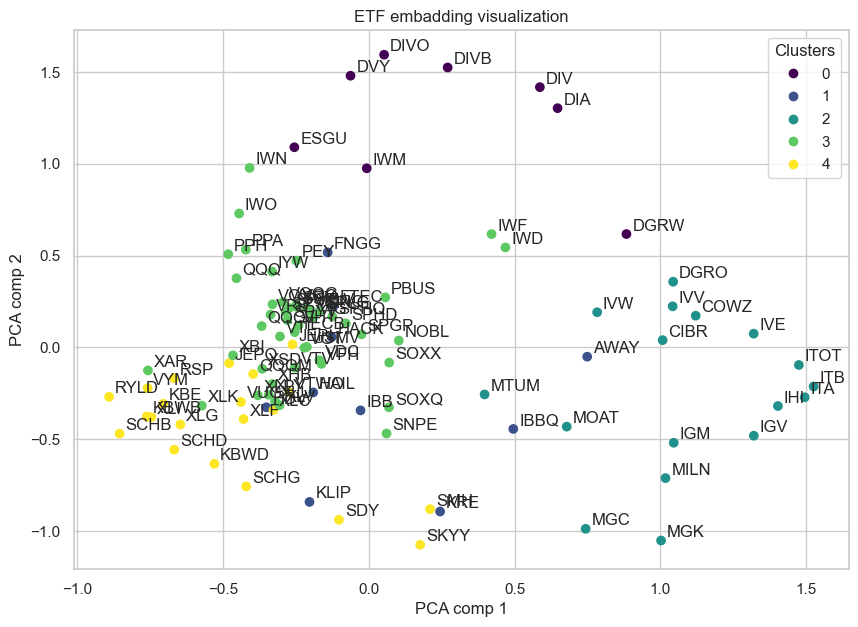

In [304]:
def visualize_clusters(embeddings, clusters, etf_features):
    """
    PCA를 사용하여 ETF 임베딩을 2차원으로 축소하고 클러스터를 시각화합니다.

    Parameters:
    - embeddings (torch.Tensor): 노드 임베딩.
    - clusters (np.ndarray): 클러스터 라벨.
    - etf_features (pd.DataFrame): ETF 특성 데이터프레임.
    """
    from sklearn.decomposition import PCA
    import matplotlib.pyplot as plt

    pca = PCA(n_components=2)
    embeddings_2d = pca.fit_transform(embeddings.numpy())

    plt.figure(figsize=(10, 7))
    scatter = plt.scatter(embeddings_2d[:,0], embeddings_2d[:,1], c=clusters, cmap='viridis')

    for i, etf_id in enumerate(etf_features['ETF_ID']):
        plt.annotate(etf_id, (embeddings_2d[i,0]+0.02, embeddings_2d[i,1]+0.02))

    plt.title('ETF embadding visualization')
    plt.xlabel('PCA comp 1')
    plt.ylabel('PCA comp 2')
    plt.legend(*scatter.legend_elements(), title="Clusters")
    plt.grid(True)
    plt.show()

# 클러스터 시각화
print("\n클러스터 시각화 중...")
visualize_clusters(embeddings, clusters, df_all)

In [305]:
df_all

,ETF_ID,Cluster
0,AWAY,1
1,CIBR,2
2,COWZ,2
3,DGRO,2
4,DGRW,0
...,...,...
98,XLP,3
99,XLU,3
100,XLV,3
101,XLY,3


## 노드 따라 진행하기

In [306]:
import torch
import torch.nn.functional as F
from torch_geometric.data import Data

def create_graph_from_embeddings(embeddings, threshold=0.8, max_edges_per_node=5):
    # 임베딩 정규화
    embeddings_norm = F.normalize(embeddings, p=2, dim=1)
    similarity_matrix = torch.mm(embeddings_norm, embeddings_norm.t())

    # 유사도 행렬에서 임계값을 적용하여 기본 인접 행렬 생성
    adjacency_matrix = (similarity_matrix > threshold).float()
    adjacency_matrix.fill_diagonal_(0)  # 자기 자신과의 연결 제거

    # 각 노드별로 유사도가 가장 높은 max_edges_per_node개의 노드만 선택
    for i in range(adjacency_matrix.size(0)):
        similarities = similarity_matrix[i]
        top_k_indices = similarities.topk(max_edges_per_node + 1).indices  # 본인을 포함하므로 +1
        mask = torch.ones_like(similarities, dtype=torch.bool)
        mask[top_k_indices] = False
        adjacency_matrix[i][mask] = 0  # 상위 K개 외의 값은 0으로

    new_edge_index = adjacency_matrix.nonzero(as_tuple=False).t().contiguous()
    return new_edge_index

# 사용 예시
new_edge_index = create_graph_from_embeddings(embeddings, threshold=0.8, max_edges_per_node=5)
new_data = Data(x=temporal_graphs[-1].x, edge_index=new_edge_index)


In [307]:
import plotly.express as px
etf_id_to_cluster = dict(zip(df_all['ETF_ID'], df_all['Cluster']))
node_clusters = [etf_id_to_cluster[label] for label in etf_labels]
# 고유한 클러스터 수 확인
num_clusters = df_all['Cluster'].nunique()

# Plotly의 색상 팔레트 사용
color_scale = px.colors.qualitative.Plotly  # 또는 다른 팔레트 사용 가능
cluster_colors = color_scale * (num_clusters // len(color_scale) + 1)  # 색상 반복

# 클러스터 번호를 색상으로 매핑
cluster_to_color = {cluster: cluster_colors[i] for i, cluster in enumerate(sorted(df_all['Cluster'].unique()))}

# 노드 색상 리스트 생성
node_colors = [cluster_to_color[cluster] for cluster in node_clusters]

In [308]:
import numpy as np
import umap.umap_ as umap
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import plotly.graph_objs as go

# 1. 임베딩과 엣지 데이터 준비
# embeddings: (노드 수, 임베딩 차원)의 NumPy 배열
# edge_index: (2, 엣지 수)의 PyTorch Tensor

# 예시로 embeddings와 edge_index를 생성합니다. 실제 데이터로 대체하세요.
# embeddings = np.random.rand(노드_수, 임베딩_차원)
# edge_index = torch.tensor([[...], [...]])

# edge_index를 NumPy 배열로 변환하고 인덱스 조정
edge_index_np = new_edge_index.numpy() - 1  # 인덱스가 1부터 시작하면 1을 빼줍니다
edges = list(zip(edge_index_np[0], edge_index_np[1]))

# 2. 임베딩을 3차원으로 축소
reducer = umap.UMAP(n_components=3)
embeddings_3d = reducer.fit_transform(embeddings)

# 3. Plotly를 사용하여 그래프 시각화

node_labels = df_all['ETF_ID']
edge_trace = []
for edge in edges:
    start, end = edge
    x_coords = [embeddings_3d[start, 0], embeddings_3d[end, 0], None]
    y_coords = [embeddings_3d[start, 1], embeddings_3d[end, 1], None]
    z_coords = [embeddings_3d[start, 2], embeddings_3d[end, 2], None]
    edge_trace.append(go.Scatter3d(
        x=x_coords, y=y_coords, z=z_coords,
        mode='lines',
        line=dict(color='gray', width=1),
        hoverinfo='none'
    ))

# 노드 트레이스 생성 (색상 적용)
node_trace = go.Scatter3d(
    x=embeddings_3d[:, 0],
    y=embeddings_3d[:, 1],
    z=embeddings_3d[:, 2],
    mode='markers',
    marker=dict(
        size=5,
        color=node_colors,  # 클러스터에 따른 색상 적용
    ),
    text=node_labels,  # 호버 정보로 ETF_ID 표시
    hoverinfo='text',
)

fig = go.Figure(data=edge_trace + [node_trace])

fig.update_layout(
    title='인터랙티브 3D 그래프 시각화 (클러스터별 색상 적용)',
    showlegend=False,
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    )
)

fig.show()

-----

## 군집별 수익률

In [309]:
etf_return = OHLCV[OHLCV['TCK_IEM_CD'].isin(score_etf)].pivot(index='BSE_DT',columns='TCK_IEM_CD',values='BF_DD_CMP_IND_RT')*0.01

In [310]:
etf_return

TCK_IEM_CD,AIYY,AMZY,APLY,AWAY,CIBR,COWZ,DGRO,DGRW,DIA,DIV,...,XLF,XLG,XLI,XLK,XLP,XLU,XLV,XLY,XSD,YMAG
BSE_DT,,,,,,,,,,,,,,,,,,,,,
2024-05-28,0.0000,0.0106,-0.0052,-0.0045,-0.0133,-0.0016,-0.0071,-0.0026,-0.0052,-0.0017,...,-0.0111,0.0074,-0.0122,0.0042,-0.0078,-0.0010,-0.0121,-0.0024,0.0137,-0.0010
2024-05-29,-0.0105,0.0000,0.0017,-0.0087,-0.0075,-0.0095,-0.0103,-0.0087,-0.0103,-0.0110,...,-0.0080,-0.0052,-0.0142,-0.0063,-0.0072,-0.0129,-0.0078,-0.0066,-0.0189,0.0035
2024-05-30,0.1400,-0.0131,0.0115,0.0084,-0.0244,0.0132,0.0034,-0.0005,-0.0081,0.0111,...,0.0054,-0.0126,0.0068,-0.0228,0.0026,0.0135,0.0005,0.0059,0.0049,-0.0098
2024-05-31,0.0216,-0.0163,-0.0028,0.0030,0.0021,0.0187,0.0137,0.0104,0.0159,0.0174,...,0.0146,0.0046,0.0121,0.0016,0.0156,0.0176,0.0146,0.0056,0.0004,-0.0025
2024-06-03,0.0038,0.0085,0.0057,0.0020,-0.0103,-0.0130,-0.0045,-0.0021,-0.0033,0.0023,...,-0.0062,0.0069,-0.0122,0.0025,-0.0004,-0.0114,0.0070,-0.0005,-0.0006,0.0074
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-08-20,-0.0240,0.0036,0.0062,-0.0165,0.0072,-0.0090,-0.0025,-0.0002,-0.0013,-0.0033,...,-0.0032,-0.0002,-0.0027,-0.0035,0.0050,-0.0021,0.0040,-0.0009,-0.0092,0.0016
2024-08-21,0.0118,0.0082,-0.0022,0.0163,0.0032,0.0114,0.0040,0.0044,0.0011,0.0067,...,-0.0016,0.0019,0.0060,0.0059,0.0068,0.0071,0.0017,0.0126,0.0225,0.0052
2024-08-22,-0.0282,-0.0188,-0.0050,-0.0165,-0.0118,-0.0034,-0.0016,-0.0058,-0.0037,-0.0028,...,0.0057,-0.0118,-0.0012,-0.0230,-0.0015,-0.0012,0.0006,-0.0173,-0.0295,-0.0192


In [311]:
# 빈 딕셔너리 생성

cluster_dict = {}
def add_value(key, value):
    if key in cluster_dict:
        cluster_dict[key].append(value)
    else:
        cluster_dict[key] = [value]

# 값 추가 예시


In [312]:

for i in df_all[['ETF_ID', 'Cluster']].iterrows():
    add_value(i[1][1],etf_return[i[1][0]].values)

In [313]:
cluster_0_return  = pd.DataFrame(cluster_dict[0]).T
cluster_1_return = pd.DataFrame(cluster_dict[1]).T
cluster_2_return = pd.DataFrame(cluster_dict[2]).T
cluster_3_return = pd.DataFrame(cluster_dict[3]).T
cluster_4_return = pd.DataFrame(cluster_dict[4]).T



In [314]:
cluster_1_return

,0,1,2,3,4,5,6,7,8,9
0,-0.0045,0.0144,0.0097,-0.0153,0.0004,-0.0043,-0.0117,-0.0131,0.0007,-0.0084
1,-0.0087,-0.0100,-0.0053,-0.0062,-0.0106,-0.0108,-0.0117,-0.0128,-0.0082,-0.0241
2,0.0084,-0.0354,-0.0236,-0.0263,0.0092,0.0057,0.0063,0.0185,0.0084,0.0175
3,0.0030,-0.0144,-0.0023,0.0013,0.0059,0.0195,0.0040,0.0010,-0.0120,0.0141
4,0.0020,0.0109,0.0064,-0.0047,-0.0024,-0.0061,0.0121,0.0158,-0.0021,-0.0174
...,...,...,...,...,...,...,...,...,...,...
58,-0.0165,0.0005,-0.0036,0.0042,-0.0147,-0.0048,-0.0028,0.0012,-0.0156,-0.0187
59,0.0163,0.0101,0.0064,0.0039,0.0167,0.0039,0.0052,0.0041,0.0071,0.0059
60,-0.0165,-0.0735,-0.0192,-0.0102,-0.0148,-0.0003,-0.0115,-0.0090,-0.0031,0.0029
61,0.0255,0.0287,0.0166,0.0124,0.0357,0.0095,0.0102,0.0095,0.0028,0.0508


In [315]:
from scipy import stats
def df_ANONVA(cluster_return):
    group_data = [cluster_return[col].dropna() for col in cluster_return.columns]
    group_names = cluster_return.columns.tolist()
    # ANOVA 검정 수행
   
    if len(group_data) != 1:
        f_stat, p_value = stats.f_oneway(*group_data)

        print('ANOVA 검정 결과:')
        print(f'F-통계량: {f_stat:.4f}, p-값: {p_value:.4f}')

        # 결과 해석
        if p_value < 0.05:
            print('그룹 간 평균에 유의한 차이가 있습니다.')
        else:
            print('그룹 간 평균에 유의한 차이가 없습니다.')
    else:
        pass

In [316]:
df_ANONVA(cluster_0_return)
df_ANONVA(cluster_1_return)
df_ANONVA(cluster_2_return)
df_ANONVA(cluster_3_return)
df_ANONVA(cluster_4_return)



ANOVA 검정 결과:
F-통계량: 0.0416, p-값: 0.9999
그룹 간 평균에 유의한 차이가 없습니다.
ANOVA 검정 결과:
F-통계량: 0.3492, p-값: 0.9579
그룹 간 평균에 유의한 차이가 없습니다.
ANOVA 검정 결과:
F-통계량: 0.1464, p-값: 1.0000
그룹 간 평균에 유의한 차이가 없습니다.
ANOVA 검정 결과:
F-통계량: 0.0974, p-값: 1.0000
그룹 간 평균에 유의한 차이가 없습니다.
ANOVA 검정 결과:
F-통계량: 0.1133, p-값: 1.0000
그룹 간 평균에 유의한 차이가 없습니다.


각각의 그룹내에서 차이가 존재하지 않았음 즉, 잘 묶어졌음을 확인할 수 있다!

## 서비스화

In [317]:
import numpy as np
import umap.umap_ as umap
import plotly.graph_objs as go
import networkx as nx
import torch

# 재현성을 위해 시드 고정
np.random.seed(10)
torch.manual_seed(10)



In [318]:
# import numpy as np
# import umap.umap_ as umap
# import plotly.graph_objs as go
# import networkx as nx
# import torch

# # 재현성을 위해 시드 고정
# np.random.seed(10)
# torch.manual_seed(10)

# # 1. 임베딩과 엣지 데이터 준비
# # new_data: PyTorch Geometric의 그래프 데이터 객체
# # embeddings: (노드 수, 임베딩 차원)의 PyTorch Tensor
# # new_edge_index: (2, 엣지 수)의 PyTorch Tensor

# # edge_index를 NumPy 배열로 변환하고 인덱스 조정
# edge_index_np = new_data.edge_index.numpy() - 1  # 인덱스가 1부터 시작하면 1을 빼줍니다
# edges = list(zip(edge_index_np[0], edge_index_np[1]))

# # 2. 임베딩을 3차원으로 축소
# reducer = umap.UMAP(n_components=3)
# embeddings_3d = reducer.fit_transform(embeddings.numpy())

# # 3. Plotly를 사용하여 그래프 시각화

# def visualize_node_neighbors_3d_by_etf_name_umap(embeddings_3d, edges, etf_labels, node_colors, target_etf_id, num_hops=1, title='Node Neighborhood Visualization'):
#     # 선택한 ETF 이름의 인덱스 찾기
#     try:
#         node_idx = etf_labels.index(target_etf_id)
#     except ValueError:
#         print(f"ETF ID '{target_etf_id}'를 찾을 수 없습니다.")
#         return

#     # 선택한 노드로부터 특정 깊이까지의 노드 탐색
#     G = nx.Graph()
#     G.add_edges_from(edges)
#     nodes_within_hops = nx.single_source_shortest_path_length(G, node_idx, cutoff=num_hops)
#     subgraph_nodes = list(nodes_within_hops.keys())

#     # 선택한 노드로부터의 거리 계산
#     distances_from_node = np.linalg.norm(embeddings_3d - embeddings_3d[node_idx], axis=1)

#     # 전체 엣지와 노드를 시각화하기 위한 트레이스 생성
#     edge_trace = []
#     for edge in edges:
#         start, end = edge
#         if start in subgraph_nodes and end in subgraph_nodes:
#             x_coords = [embeddings_3d[start, 0], embeddings_3d[end, 0], None]
#             y_coords = [embeddings_3d[start, 1], embeddings_3d[end, 1], None]
#             z_coords = [embeddings_3d[start, 2], embeddings_3d[end, 2], None]
#             edge_trace.append(go.Scatter3d(
#                 x=x_coords, y=y_coords, z=z_coords,
#                 mode='lines',
#                 line=dict(color='gray', width=1),
#                 hoverinfo='none'
#             ))

#     # 노드 트레이스 생성 (선택한 노드와 각 클러스터 강조)
#     node_x = []
#     node_y = []
#     node_z = []
#     node_color_list = []
#     node_text = []

#     for i in range(len(embeddings_3d)):
#         x, y, z = embeddings_3d[i]
#         node_x.append(x)
#         node_y.append(y)
#         node_z.append(z)
#         node_text.append(etf_labels[i])

#         if i == node_idx:
#             node_color_list.append('black')  # 선택한 노드는 검은색으로 고정
#         elif i in subgraph_nodes:
#             # 선택한 노드와의 거리 비례하여 투명도 설정
#             distance_ratio = distances_from_node[i] / max(distances_from_node[subgraph_nodes])  # 0 ~ 1 사이 값
#             alpha = 1.0 - distance_ratio  # 가까울수록 투명하게, 멀수록 진하게

#             original_color = node_colors[i]
#             rgb_color = original_color.lstrip('#')
#             r, g, b = int(rgb_color[0:2], 16), int(rgb_color[2:4], 16), int(rgb_color[4:6], 16)
#             rgba_color = f'rgba({r}, {g}, {b}, {alpha:.2f})'
#             node_color_list.append(rgba_color)
#         else:
#             node_color_list.append(node_colors[i])  # 그 외 노드는 클러스터에 따른 색상 유지

#     node_trace = go.Scatter3d(
#         x=node_x, y=node_y, z=node_z,
#         mode='markers',
#         marker=dict(
#             size=5,
#             color=node_color_list,
#         ),
#         text=node_text,
#         hoverinfo='text'
#     )

#     # 그래프 레이아웃 설정
#     fig = go.Figure(data=edge_trace + [node_trace])
#     fig.update_layout(
#         title=title,
#         showlegend=False,
#         scene=dict(
#             xaxis_title='X',
#             yaxis_title='Y',
#             zaxis_title='Z'
#         )
#     )
#     fig.show()


# # 선택한 ETF 이름을 사용하여 시각화 (예: 'IVV')
# selected_etf = 'XLG'
# visualize_node_neighbors_3d_by_etf_name_umap(embeddings_3d, edges, etf_labels, node_colors, target_etf_id=selected_etf, num_hops=1, title=f'Graph with Selected Node {selected_etf} Highlighted')


In [319]:
def print_cluster_distances_by_etf_name(embeddings_3d, etf_labels, node_colors, target_etf_id):
    # 선택한 ETF 이름의 인덱스 찾기
    try:
        node_idx = etf_labels.index(target_etf_id)
    except ValueError:
        print(f"ETF ID '{target_etf_id}'를 찾을 수 없습니다.")
        return

    # 선택한 노드로부터의 거리 계산
    distances_from_node = np.linalg.norm(embeddings_3d - embeddings_3d[node_idx], axis=1)

    # 각 클러스터별로 노드를 분류하여 거리를 저장
    clusters = {}
    for i in range(len(embeddings_3d)):
        cluster_label = node_colors[i]  # 클러스터 색상으로 클러스터 구분
        if cluster_label not in clusters:
            clusters[cluster_label] = []
        clusters[cluster_label].append((i, distances_from_node[i]))  # (노드 인덱스, 거리) 저장

    # 각 클러스터별로 거리를 오름차순으로 정렬하여 출력
    for cluster_label, nodes in clusters.items():
        print(f"\n클러스터 '{cluster_label}'의 노드들에 대한 선택된 노드 '{target_etf_id}'와의 거리 (오름차순):")
        sorted_nodes = sorted(nodes, key=lambda x: x[1])  # 거리 기준 오름차순 정렬
        for node_idx, distance in sorted_nodes:
            print(f"노드 {etf_labels[node_idx]} (인덱스 {node_idx}): 거리 {distance:.2f}")

# 선택한 ETF 이름을 사용하여 클러스터별 거리 출력 (예: 'QQQ')
selected_etf = 'QQQ'
print_cluster_distances_by_etf_name(embeddings, etf_labels, node_colors, target_etf_id=selected_etf)



클러스터 '#EF553B'의 노드들에 대한 선택된 노드 'QQQ'와의 거리 (오름차순):
노드 FNGG (인덱스 11): 거리 1.44
노드 IBB (인덱스 16): 거리 1.51
노드 FTEC (인덱스 12): 거리 1.52
노드 HDV (인덱스 15): 거리 1.57
노드 HACK (인덱스 13): 거리 1.62
노드 KLIP (인덱스 38): 거리 1.70
노드 IBBQ (인덱스 17): 거리 1.72
노드 AWAY (인덱스 0): 거리 1.75
노드 HAIL (인덱스 14): 거리 1.81
노드 KRE (인덱스 39): 거리 1.85

클러스터 '#00CC96'의 노드들에 대한 선택된 노드 'QQQ'와의 거리 (오름차순):
노드 MTUM (인덱스 44): 거리 1.47
노드 IVW (인덱스 26): 거리 1.70
노드 CIBR (인덱스 1): 거리 1.75
노드 DGRO (인덱스 3): 거리 1.78
노드 IVV (인덱스 25): 거리 1.79
노드 COWZ (인덱스 2): 거리 1.79
노드 IVE (인덱스 24): 거리 1.93
노드 MOAT (인덱스 43): 거리 1.95
노드 IGM (인덱스 18): 거리 1.96
노드 MGC (인덱스 40): 거리 2.07
노드 ITOT (인덱스 23): 거리 2.09
노드 MILN (인덱스 42): 거리 2.12
노드 IGV (인덱스 19): 거리 2.13
노드 IHI (인덱스 20): 거리 2.16
노드 ITB (인덱스 22): 거리 2.16
노드 MGK (인덱스 41): 거리 2.17
노드 ITA (인덱스 21): 거리 2.17

클러스터 '#636EFA'의 노드들에 대한 선택된 노드 'QQQ'와의 거리 (오름차순):
노드 IWM (인덱스 29): 거리 1.26
노드 ESGU (인덱스 10): 거리 1.49
노드 DVY (인덱스 9): 거리 1.75
노드 DGRW (인덱스 4): 거리 1.87
노드 DIA (인덱스 5): 거리 1.90
노드 DIVO (인덱스 8): 거리 1.94
노드 DIVB (인덱스 

In [320]:
def visualize_clusters_with_transparency_by_distance(embeddings_3d, edges, etf_labels, node_colors, target_etf_id, title='Node Neighborhood Visualization'):
    # 선택한 ETF 이름의 인덱스 찾기
    try:
        node_idx = etf_labels.index(target_etf_id)
    except ValueError:
        print(f"ETF ID '{target_etf_id}'를 찾을 수 없습니다.")
        return

    # 선택한 노드로부터의 거리 계산
    distances_from_node = np.linalg.norm(embeddings_3d - embeddings_3d[node_idx], axis=1)

    # 각 클러스터별로 노드를 분류하고 거리 순으로 정렬하여 투명도 설정
    cluster_nodes = {}
    for i in range(len(embeddings_3d)):
        cluster_label = node_colors[i]  # 클러스터 색상으로 클러스터 구분
        if cluster_label not in cluster_nodes:
            cluster_nodes[cluster_label] = []
        cluster_nodes[cluster_label].append((i, distances_from_node[i]))  # (노드 인덱스, 거리) 저장

    # Plotly를 사용한 시각화 준비
    node_x, node_y, node_z, node_color_list, node_text = [], [], [], [], []

    # 각 클러스터 내에서 거리 순으로 투명도를 설정하여 시각화
    for cluster_label, nodes in cluster_nodes.items():
        # 거리 기준 오름차순 정렬
        nodes_sorted_by_distance = sorted(nodes, key=lambda x: x[1])
        num_nodes = len(nodes_sorted_by_distance)

        # 클러스터 내에서 가장 가까운 노드는 투명하게, 가장 먼 노드는 진하게 설정
        for rank, (i, _) in enumerate(nodes_sorted_by_distance):
            x, y, z = embeddings_3d[i]
            node_x.append(x)
            node_y.append(y)
            node_z.append(z)
            node_text.append(etf_labels[i])

            if i == node_idx:
                node_color_list.append('black')  # 선택한 노드는 검은색으로 고정
            else:
                # 가장 가까운 노드는 더 투명하게, 가장 먼 노드는 더 진하게
                alpha = 0.4 + 0.6 * (rank / (num_nodes - 1))  # 가까운 노드는 낮은 alpha, 먼 노드는 높은 alpha
                rgb_color = cluster_label.lstrip('#')
                r, g, b = int(rgb_color[0:2], 16), int(rgb_color[2:4], 16), int(rgb_color[4:6], 16)
                rgba_color = f'rgba({r}, {g}, {b}, {alpha:.2f})'
                node_color_list.append(rgba_color)

    # 전체 엣지와 노드를 시각화하기 위한 트레이스 생성
    edge_trace = []
    for edge in edges:
        start, end = edge
        x_coords = [embeddings_3d[start, 0], embeddings_3d[end, 0], None]
        y_coords = [embeddings_3d[start, 1], embeddings_3d[end, 1], None]
        z_coords = [embeddings_3d[start, 2], embeddings_3d[end, 2], None]
        edge_trace.append(go.Scatter3d(
            x=x_coords, y=y_coords, z=z_coords,
            mode='lines',
            line=dict(color='rgba(60, 60, 60, 0.4)', width=1), # 엣지 선 농도수정
            hoverinfo='none'
        ))

    # 노드 트레이스 생성
    node_trace = go.Scatter3d(
        x=node_x, y=node_y, z=node_z,
        mode='markers',
        marker=dict(
            size=5,
            color=node_color_list,
        ),
        text=node_text,
        hoverinfo='text'
    )

    # 그래프 레이아웃 설정
    fig = go.Figure(data=edge_trace + [node_trace])
    fig.update_layout(
        title=title,
        showlegend=False,
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z'
        )
    )
    fig.show()

# 선택한 ETF 이름을 사용하여 시각화 (예: 'QQQ')
selected_etf = 'QQQ'
visualize_clusters_with_transparency_by_distance(embeddings_3d, edges, etf_labels, node_colors, target_etf_id=selected_etf, title=f'Graph with Selected Node {selected_etf} Highlighted')


거리는 뭘로 측정되는가?

In [321]:
etf_labels_unique = merged_df_cleaned['ETF_ID'].unique().tolist() 

In [322]:
import numpy as np
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

# 1. 가장 멀리 떨어진 ETF 선택 및 저장 함수
def print_and_save_farthest_etfs_by_cluster_with_limits(embeddings_3d, etf_labels, node_colors, target_etf_id, limits):
    """
    각 클러스터에서 선택한 ETF로부터 가장 멀리 떨어진 ETF들을 선택하고 리스트로 반환합니다.
    
    Parameters:
    - embeddings_3d (numpy.ndarray): 노드 임베딩 (num_nodes, 3)
    - etf_labels (list): 각 노드의 ETF 티커 리스트
    - node_colors (list): 각 노드의 클러스터 색상 리스트
    - target_etf_id (str): 기준이 되는 ETF 티커
    - limits (list of int): 각 클러스터에서 선택할 ETF 개수
    
    Returns:
    - farthest_etfs (list): 선택된 ETF 티커 리스트
    """
    # 선택한 ETF 이름의 인덱스 찾기
    try:
        node_idx = etf_labels.index(target_etf_id)
    except ValueError:
        print(f"ETF ID '{target_etf_id}'를 찾을 수 없습니다.")
        return []
    
    # 선택한 노드로부터의 거리 계산
    distances_from_node = np.linalg.norm(embeddings_3d - embeddings_3d[node_idx], axis=1)
    
    # 각 클러스터별로 노드를 분류하여 거리를 저장
    clusters = {}
    for i in range(len(embeddings_3d)):
        cluster_label = node_colors[i]  # 클러스터 색상으로 클러스터 구분
        if cluster_label not in clusters:
            clusters[cluster_label] = []
        clusters[cluster_label].append((i, distances_from_node[i]))  # (노드 인덱스, 거리) 저장
    
    # 클러스터 순서와 입력 리스트 길이 확인
    if len(limits) != len(clusters):
        print("입력된 리스트 길이와 클러스터 수가 일치하지 않습니다.")
        return []
    
    # 각 클러스터별로 가장 멀리 떨어진 노드의 티커를 저장할 리스트
    farthest_etfs = []
    
    # 각 클러스터별로 가장 멀리 떨어진 노드 출력 및 저장
    for (cluster_label, nodes), limit in zip(clusters.items(), limits):
        # 거리 기준으로 내림차순 정렬하여 상위 limit 개 선택
        nodes_sorted_by_distance = sorted(nodes, key=lambda x: x[1], reverse=True)[:limit]
        # print(f"\n클러스터 '{cluster_label}'에서 가장 멀리 떨어진 상위 {limit}개의 ETF:")
    
        for farthest_idx, max_distance in nodes_sorted_by_distance:
            etf = etf_labels[farthest_idx]
            # print(f"  - ETF: {etf}, 거리: {max_distance:.4f}")
            farthest_etfs.append(etf)
    
    return farthest_etfs

# 2. 주식 데이터 수집 함수
def get_stock_data(ticker, start_date='2024-08-28', end_date='2024-11-09'): # start_date='2024-08-28', end_date='2024-11-09'
    """
    주어진 티커의 주식 데이터를 가져오는 함수입니다.
    
    Parameters:
    - ticker (str): 조회할 티커 이름.
    - start_date (str): 데이터 조회 시작일 (YYYY-MM-DD 형식).
    - end_date (str): 데이터 조회 종료일 (YYYY-MM-DD 형식).
    
    Returns:
    - data (pd.DataFrame): 주식 데이터프레임. 실패 시 None 반환.
    """
    try:
        # yfinance를 사용해 티커의 데이터 가져오기
        # print(f"\n{ticker} 데이터를 가져오는 중...")
        data = yf.download(ticker, start=start_date, end=end_date)['Adj Close']
    
        return data
    
    except Exception as e:
        print(f"{ticker} 데이터를 불러오는 중 문제가 발생했습니다: {e}")
        return None

# 3. 개별 자산과 포트폴리오 수익률 및 리스크 지표 계산 함수
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

import pandas as pd
import numpy as np

def fetch_all_etf_data(etf_labels):
    """
    ETF 티커 리스트에 포함된 모든 ETF 데이터를 한 번에 불러옵니다.
    
    Parameters:
    - etf_labels (list): ETF 티커 리스트
    
    Returns:
    - stock_data_list (list of DataFrames): 각 ETF의 가격 데이터를 담은 데이터프레임 리스트
    """
    stock_data_list = []
    stock_data_list = get_stock_data(etf_labels)  # get_stock_data는 각 티커의 주가 데이터를 불러오는 함수

    return stock_data_list

import pandas as pd
import numpy as np

import pandas as pd
import numpy as np

def calculate_portfolio_returns_and_risk_metrics(stock_data_list, selected_etf, risk_free_rate=0.01):
    """
    선택된 ETF들의 수정주가를 수익률로 변환하고, 동일 가중치 포트폴리오의 수익률을 계산하여 리스크 지표를 반환합니다.
    
    Parameters:
    - stock_data_list (DataFrame): yfinance에서 제공하는, 여러 ETF의 수정 종가 데이터를 포함한 데이터프레임
    - selected_etf (str): 선택한 ETF 티커
    - risk_free_rate (float): 연간 무위험 이자율 (예: 0.01은 1%를 의미)
    
    Returns:
    - portfolio_cumulative_returns (list): 포트폴리오 누적 수익률 리스트
    - selected_etf_metrics (pd.Series): 선택한 ETF의 리스크 지표 시리즈
    - portfolio_metrics (pd.Series): 포트폴리오 리스크 지표 시리즈
    - selected_etf_correlation (pd.Series): 선택한 ETF의 상관관계 시리즈
    """
    # Adj Close 데이터만 선택
    adj_close_data = stock_data_list
    
    adj_close_data.dropna(inplace=True)  # 결측치 제거
    daily_returns = adj_close_data.pct_change().dropna()  # 일일 수익률 계산
    correlation_matrix = daily_returns.corr()  # 자산 간 상관관계 메트릭스 계산
    
    # 선택한 ETF에 대한 상관관계
    selected_etf_correlation = correlation_matrix

    annualization_factor = 252
    asset_metrics = pd.DataFrame(index=adj_close_data.columns)
    asset_metrics['Annualized Return'] = ((1 + daily_returns.mean()) ** annualization_factor) - 1
    asset_metrics['Annualized Volatility'] = daily_returns.std() * np.sqrt(annualization_factor)
    asset_metrics['Sharpe Ratio'] = (asset_metrics['Annualized Return'] - risk_free_rate) / asset_metrics['Annualized Volatility']
    
    cumulative_returns = (1 + daily_returns).cumprod()
    rolling_max = cumulative_returns.cummax()
    drawdowns = (cumulative_returns - rolling_max) / rolling_max
    asset_metrics['Maximum Drawdown'] = drawdowns.min()

    # 선택한 ETF의 리스크 지표
    selected_etf_metrics = asset_metrics.loc[selected_etf]
    
    # 동일 가중치 포트폴리오 수익률 계산
    portfolio_returns = daily_returns.mean(axis=1)
    portfolio_cumulative_returns = (1 + portfolio_returns).cumprod() - 1
    portfolio_annualized_return = ((1 + portfolio_returns.mean()) ** annualization_factor) - 1
    portfolio_annualized_volatility = portfolio_returns.std() * np.sqrt(annualization_factor)
    portfolio_sharpe_ratio = (portfolio_annualized_return - risk_free_rate) / portfolio_annualized_volatility
    portfolio_rolling_max = (1 + portfolio_cumulative_returns).cummax()
    portfolio_drawdown = (1 + portfolio_cumulative_returns) / portfolio_rolling_max - 1
    portfolio_max_drawdown = portfolio_drawdown.min()
    
    portfolio_metrics = pd.Series({
        'Annualized Return': portfolio_annualized_return,
        'Annualized Volatility': portfolio_annualized_volatility,
        'Sharpe Ratio': portfolio_sharpe_ratio,
        'Maximum Drawdown': portfolio_max_drawdown
    })
    
    return portfolio_cumulative_returns.tolist(), asset_metrics, portfolio_metrics, selected_etf_correlation

# 사용 예제
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

def calculate_portfolio_returns_and_risk_metrics_plot(stock_data_list, selected_etf, risk_free_rate=0.01):
    """
    선택된 ETF들의 수정주가를 수익률로 변환하고, 동일 가중치 포트폴리오의 수익률을 계산하여 리스크 지표를 반환합니다.
    
    Parameters:
    - stock_data_list (DataFrame): yfinance에서 제공하는, 여러 ETF의 수정 종가 데이터를 포함한 데이터프레임
    - selected_etf (str): 선택한 ETF 티커
    - risk_free_rate (float): 연간 무위험 이자율 (예: 0.01은 1%를 의미)
    
    Returns:
    - portfolio_cumulative_returns (list): 포트폴리오 누적 수익률 리스트
    - asset_metrics (pd.DataFrame): 각 자산의 리스크 지표 데이터프레임
    - portfolio_metrics (pd.Series): 포트폴리오 리스크 지표 시리즈
    - correlation_matrix (pd.DataFrame): 포트폴리오 내 자산 간 상관관계 메트릭스
    """
    # Adj Close 데이터만 선택
    adj_close_data = stock_data_list
    
    adj_close_data.dropna(inplace=True)  # 결측치 제거
    daily_returns = adj_close_data.pct_change().dropna()  # 일일 수익률 계산
    correlation_matrix = daily_returns.corr()  # 자산 간 상관관계 메트릭스 계산
    
    # 선택한 ETF에 대한 상관관계
    selected_etf_correlation = correlation_matrix

    annualization_factor = 252
    asset_metrics = pd.DataFrame(index=adj_close_data.columns)
    asset_metrics['Annualized Return'] = ((1 + daily_returns.mean()) ** annualization_factor) - 1
    asset_metrics['Annualized Volatility'] = daily_returns.std() * np.sqrt(annualization_factor)
    asset_metrics['Sharpe Ratio'] = (asset_metrics['Annualized Return'] - risk_free_rate) / asset_metrics['Annualized Volatility']
    
    cumulative_returns = (1 + daily_returns).cumprod()
    rolling_max = cumulative_returns.cummax()
    drawdowns = (cumulative_returns - rolling_max) / rolling_max
    asset_metrics['Maximum Drawdown'] = drawdowns.min()

    # 선택한 ETF의 리스크 지표
    selected_etf_metrics = asset_metrics.loc[selected_etf]
    
    # 동일 가중치 포트폴리오 수익률 계산
    portfolio_returns = daily_returns.mean(axis=1)
    portfolio_cumulative_returns = (1 + portfolio_returns).cumprod() - 1
    portfolio_annualized_return = ((1 + portfolio_returns.mean()) ** annualization_factor) - 1
    portfolio_annualized_volatility = portfolio_returns.std() * np.sqrt(annualization_factor)
    portfolio_sharpe_ratio = (portfolio_annualized_return - risk_free_rate) / portfolio_annualized_volatility
    portfolio_rolling_max = (1 + portfolio_cumulative_returns).cummax()
    portfolio_drawdown = (1 + portfolio_cumulative_returns) / portfolio_rolling_max - 1
    portfolio_max_drawdown = portfolio_drawdown.min()
    
    portfolio_metrics = pd.Series({
        'Annualized Return': portfolio_annualized_return,
        'Annualized Volatility': portfolio_annualized_volatility,
        'Sharpe Ratio': portfolio_sharpe_ratio,
        'Maximum Drawdown': portfolio_max_drawdown
    })
    
    # 개별 자산과 포트폴리오의 누적 수익률 그래프
    plt.figure(figsize=(14, 7))
    
    # 개별 자산 플롯
    for ticker in adj_close_data.columns:
        if ticker == selected_etf:
            plt.plot(cumulative_returns.index, cumulative_returns[ticker] - 1, 
                     label=f'{ticker} (Selected)', linewidth=3, linestyle='--', color='red')
        else:
            plt.plot(cumulative_returns.index, cumulative_returns[ticker] - 1, 
                     label=f'{ticker}', linewidth=1)
    
    # 포트폴리오 누적 수익률 플롯
    plt.plot(portfolio_cumulative_returns.index, portfolio_cumulative_returns.values, 
             label='Portfolio', color='black', linewidth=3)
    
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Cumulative Return', fontsize=14)
    plt.title('Asset and Portfolio Cumulative Returns', fontsize=18)
    plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()
    
    # 리스크 지표 출력
    print("\n각 자산의 리스크 지표:")
    print(asset_metrics)
    
    print("\n포트폴리오의 리스크 지표:")
    print(portfolio_metrics)
    
    # 상관관계 메트릭스 출력
    print("\n포트폴리오 내 자산 간 상관관계 메트릭스:")
    print(correlation_matrix)
    
    # 누적 수익률을 리스트로 반환
    return portfolio_cumulative_returns.tolist(), asset_metrics, portfolio_metrics, correlation_matrix
    
    # 개별 자산과 포트폴리오의 누적 수익률 그래프
    # plt.figure(figsize=(14, 7))
    
    # # 개별 자산 플롯
    # for ticker in adj_close_data.columns:
    #     if ticker == selected_etf:
    #         plt.plot(cumulative_returns.index, cumulative_returns[ticker] - 1, 
    #                  label=f'{ticker} (Selected)', linewidth=3, linestyle='--', color='red')
    #     else:
    #         plt.plot(cumulative_returns.index, cumulative_returns[ticker] - 1, 
    #                  label=f'{ticker}', linewidth=1)
    
    # # 포트폴리오 누적 수익률 플롯
    # plt.plot(portfolio_cumulative_returns.index, portfolio_cumulative_returns.values, 
    #          label='Portfolio', color='black', linewidth=3)
    
    # plt.xlabel('Date', fontsize=14)
    # plt.ylabel('Cumulative Return', fontsize=14)
    # plt.title('Asset and Portfolio Cumulative Returns', fontsize=18)
    # plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
    # plt.legend(fontsize=12)
    # plt.grid(True, linestyle='--', alpha=0.5)
    # plt.tight_layout()
    # plt.show()
    
    # # 리스크 지표 출력
    # print("\n각 자산의 리스크 지표:")
    # print(asset_metrics)
    
    # print("\n포트폴리오의 리스크 지표:")
    # print(portfolio_metrics)
    
    # # 상관관계 메트릭스 출력
    # print("\n포트폴리오 내 자산 간 상관관계 메트릭스:")
    # print(correlation_matrix)
    
    # 누적 수익률을 리스트로 반환
    # return portfolio_cumulative_returns.tolist(), asset_metrics, portfolio_metrics, correlation_matrix

In [323]:
selected_etf = 'QQQ'
limits = [1, 1, 1, 1, 1]
  # 각 클러스터에서 출력할 ETF 개수
farthest_etfs = print_and_save_farthest_etfs_by_cluster_with_limits(
    embeddings, etf_labels_unique, node_colors, target_etf_id=selected_etf, limits=limits
)

# 뽑힌 ETF의 티커들을 출력
print("\n선택된 ETF 티커 리스트:")
print(farthest_etfs)
farthest_etfs.append(selected_etf) # qqq도 포함하기 
# 선택된 ETF의 가격 데이터를 가져와서 저장할 리스트
stock_data_list = []

# 선택된 티커별로 데이터 가져오기 및 시각화
# for ticker in farthest_etfs:
#     data = get_stock_data(ticker)
#     if data is not None:
#         stock_data_list.append(data)
#         # plot_stock_data(data, ticker) 일단 그리는 거 패스




선택된 ETF 티커 리스트:
['KRE', 'ITA', 'DIV', 'SNPE', 'SKYY']


[*********************100%***********************]  6 of 6 completed


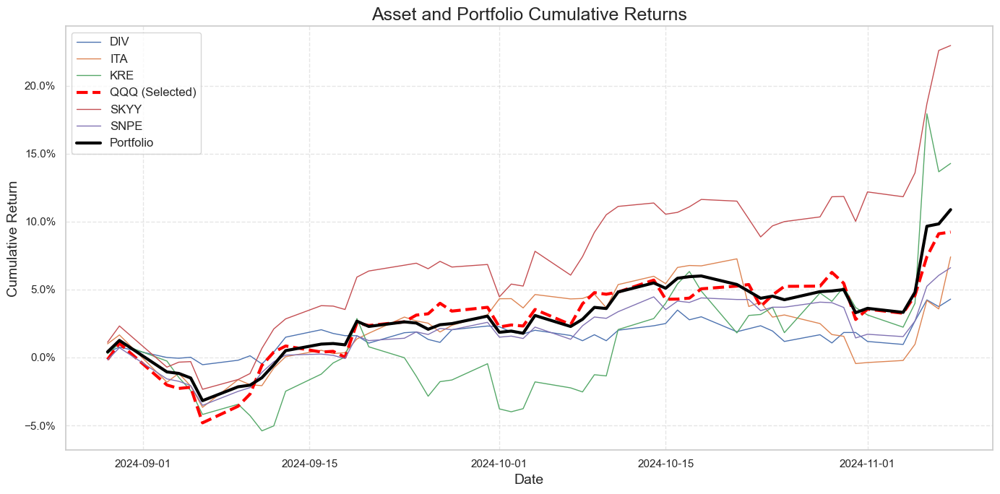


각 자산의 리스크 지표:
        Annualized Return  Annualized Volatility  Sharpe Ratio  \
Ticker                                                           
DIV              0.236529               0.095887      2.362473   
ITA              0.450948               0.198552      2.220816   
KRE              1.072172               0.385048      2.758542   
QQQ              0.572621               0.183058      3.073461   
SKYY             1.836604               0.210566      8.674747   
SNPE             0.383898               0.133541      2.799880   

        Maximum Drawdown  
Ticker                    
DIV            -0.024442  
ITA            -0.071846  
KRE            -0.066680  
QQQ            -0.057908  
SKYY           -0.045543  
SNPE           -0.042109  

포트폴리오의 리스크 지표:
Annualized Return        0.686047
Annualized Volatility    0.158776
Sharpe Ratio             4.257882
Maximum Drawdown        -0.043768
dtype: float64

포트폴리오 내 자산 간 상관관계 메트릭스:
Ticker       DIV       ITA       KRE       QQQ  

In [324]:
stock_data_list_select = get_stock_data(farthest_etfs)

# 포트폴리오 수익률 계산 및 시각화

portfolio_cumulative_returns, asset_metrics, portfolio_metrics,correlation_matrix = calculate_portfolio_returns_and_risk_metrics_plot(stock_data_list_select,selected_etf)
print("\n포트폴리오 누적 수익률 리스트 계산완료")
    


In [325]:
import pandas as pd
import numpy as np

# 클러스터링에 사용할 제한값 정의
limits = [1, 1, 1, 1, 1]

# 포트폴리오 생성 및 점수 계산 함수 정의
def calculate_portfolio_scores_for_all_etfs(etf_labels, farthest_etfs, limits):
    portfolio_scores = []
    
    for selected_etf in etf_labels:
        # 클러스터별 가장 먼 ETF 가져오고 선택된 ETF 추가
        farthest_etfs_temp = print_and_save_farthest_etfs_by_cluster_with_limits(
            embeddings, etf_labels, node_colors, target_etf_id=selected_etf, limits=limits
        )
        farthest_etfs_temp.append(selected_etf)  # 선택된 ETF 포함

        # 선택된 ETF들에 대해 주식 데이터를 가져와 리스트에 저장
        
        
        data = get_stock_data(farthest_etfs_temp)


        # 데이터가 있는 경우 포트폴리오 수익률 및 리스크 지표 계산
    
        _, asset_metrics, portfolio_metrics, _ = calculate_portfolio_returns_and_risk_metrics(data, selected_etf)
        
        # 포트폴리오 샤프 지수 및 개별 자산 샤프 지수 계산
        count = 0
        for i in asset_metrics['Sharpe Ratio'].sort_values():
            if i < portfolio_metrics['Sharpe Ratio']:
                count += 1

            else:
                break  # 순위에 따른 점수
        
        if asset_metrics.loc[selected_etf,:]['Sharpe Ratio'] < portfolio_metrics['Sharpe Ratio']:
            win_or_not = 1
        else:
            win_or_not = 0

        # 결과를 portfolio_scores 리스트에 추가
        portfolio_scores.append({
            "selected_etf": selected_etf,
            "Portfolio Score": count,
            "win or not" : win_or_not
        })
       
       
    # 결과를 데이터프레임으로 변환
    score_df = pd.DataFrame(portfolio_scores)
    return score_df

# 함수 실행 및 점수 데이터프레임 얻기
score_df = calculate_portfolio_scores_for_all_etfs(etf_labels_unique, farthest_etfs, limits)

# 결과 표시


[*********************100%***********************]  6 of 6 completed
[*********************100%***********************]  6 of 6 completed
[*********************100%***********************]  6 of 6 completed
[*********************100%***********************]  6 of 6 completed
[*********************100%***********************]  6 of 6 completed
[*********************100%***********************]  6 of 6 completed
[*********************100%***********************]  6 of 6 completed
[*********************100%***********************]  6 of 6 completed
[*********************100%***********************]  6 of 6 completed
[*********************100%***********************]  6 of 6 completed
[*********************100%***********************]  6 of 6 completed
[*********************100%***********************]  6 of 6 completed
[*********************100%***********************]  6 of 6 completed
[*********************100%***********************]  6 of 6 completed
[*********************100%********

count    103.000000
mean       4.058252
std        0.905595
min        2.000000
25%        3.000000
50%        4.000000
75%        5.000000
max        6.000000
Name: Portfolio Score, dtype: float64


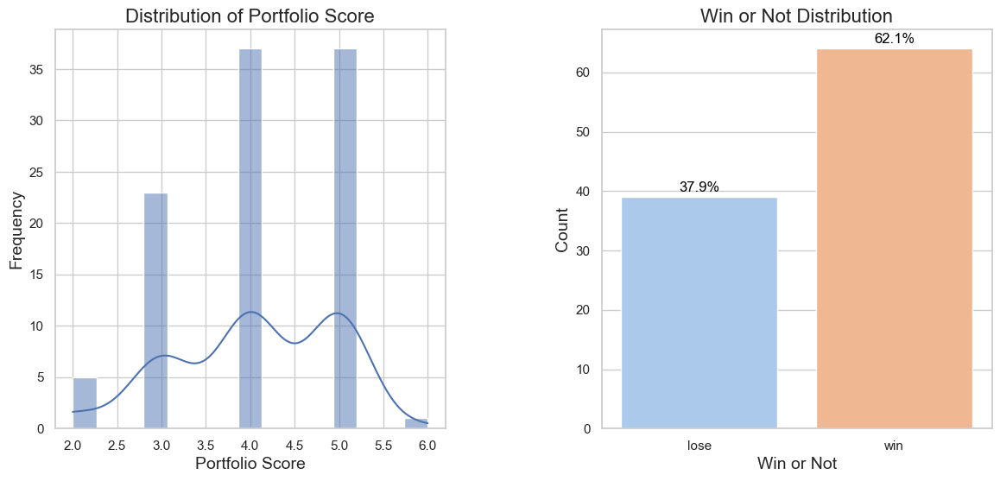

In [326]:
import matplotlib.pyplot as plt
import seaborn as sns

# win or not 컬럼 값 변환
score_df['win or not'] = score_df['win or not'].replace({1: 'win', 0: 'lose'})

# Seaborn 스타일 적용
sns.set(style="whitegrid")

# Figure와 서브플롯 생성
fig, axes = plt.subplots(1, 2, figsize=(14, 6), gridspec_kw={'wspace': 0.4})

# 첫 번째 플롯: Portfolio Score 히스토그램
sns.histplot(score_df['Portfolio Score'], bins=15, kde=True, ax=axes[0])
axes[0].set_title('Distribution of Portfolio Score', fontsize=16)
axes[0].set_xlabel('Portfolio Score', fontsize=14)
axes[0].set_ylabel('Frequency', fontsize=14)

# Portfolio Score의 요약 통계 출력
print(score_df['Portfolio Score'].describe())

# 두 번째 플롯: Win or Not 막대 그래프
sns.countplot(x='win or not', data=score_df, ax=axes[1], palette='pastel')
axes[1].set_title('Win or Not Distribution', fontsize=16)
axes[1].set_xlabel('Win or Not', fontsize=14)
axes[1].set_ylabel('Count', fontsize=14)

# Win과 Lose의 비율 계산 및 표시
total = len(score_df)
win_count = score_df['win or not'].value_counts()

for p in axes[1].patches:
    count = int(p.get_height())
    percentage = f'{count / total * 100:.1f}%'
    axes[1].annotate(percentage, 
                     (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', 
                     xytext = (0, 8), 
                     textcoords = 'offset points', 
                     fontsize=12, color='black')

# 그래프 레이아웃 최적화
plt.tight_layout()
plt.show()

In [327]:
portfolio_sharpe = portfolio_metrics['Sharpe Ratio']
asset_sharpes = asset_metrics['Sharpe Ratio'].sort_values()

In [328]:
import pandas as pd
from itertools import combinations

# Load the CSV file
df = ETF_Holding

# Filter the DataFrame to include only the ETFs in ticker_list
ticker_list = farthest_etfs
df_filtered = df[df['ETF_TCK_CD'].isin(ticker_list)]

# Create a dictionary with each ETF ticker and the set of stocks it holds
etf_holdings = {
    etf: set(df_filtered[df_filtered['ETF_TCK_CD'] == etf]['TCK_IEM_CD'])
    for etf in ticker_list
}

# Calculate and print overlap between each pair of ETFs
print("Overlap of stocks between each pair of ETFs:")
for etf1, etf2 in combinations(ticker_list, 2):
    common_stocks = etf_holdings[etf1].intersection(etf_holdings[etf2])
    overlap_percentage = (len(common_stocks) / len(etf_holdings[etf1].union(etf_holdings[etf2]))) * 100
    print(f"{etf1} & {etf2}: {len(common_stocks)} stocks in common ({overlap_percentage:.2f}% overlap)")

Overlap of stocks between each pair of ETFs:
KRE & ITA: 1 stocks in common (0.56% overlap)
KRE & DIV: 2 stocks in common (1.09% overlap)
KRE & SNPE: 6 stocks in common (1.34% overlap)
KRE & SKYY: 1 stocks in common (0.50% overlap)
KRE & QQQ: 0 stocks in common (0.00% overlap)
ITA & DIV: 1 stocks in common (1.22% overlap)
ITA & SNPE: 3 stocks in common (0.86% overlap)
ITA & SKYY: 1 stocks in common (1.00% overlap)
ITA & QQQ: 0 stocks in common (0.00% overlap)
DIV & SNPE: 8 stocks in common (2.29% overlap)
DIV & SKYY: 2 stocks in common (1.92% overlap)
DIV & QQQ: 1 stocks in common (0.70% overlap)
SNPE & SKYY: 8 stocks in common (2.17% overlap)
SNPE & QQQ: 48 stocks in common (13.15% overlap)
SKYY & QQQ: 14 stocks in common (9.52% overlap)


## ETF 묶음으로 새로운 테마를 만든다

클러스터링 된 그룹은 투자자들에게 와닿지 않을 수 있습니다. 그렇기에 해당 테마에 존재하는 종목의 정보(일단은 이름)를 통해 gpt 4o에게 테마의 이름을 짓게 만듭니다.

In [428]:
import pandas as pd
import random
import openai
import os
from typing import List

In [437]:
import pandas as pd

def create_cluster_groups(df: pd.DataFrame):
    """
    DataFrame을 클러스터별로 그룹화하여 리스트로 반환합니다.
    
    Args:
        df (pd.DataFrame): ETF 데이터가 포함된 DataFrame. 'ETF_ID'와 'Cluster' 컬럼을 포함.
    
    Returns:
        List[pd.DataFrame]: 클러스터별 ETF 그룹을 포함하는 DataFrame 리스트.
    """
    # 'Cluster' 컬럼이 존재하는지 확인
    if 'Cluster' not in df.columns:
        raise ValueError("DataFrame에 'Cluster' 컬럼이 존재하지 않습니다.")
    
    # 'Cluster' 컬럼의 결측값(NaN) 처리
    if df['Cluster'].isnull().any():
        print("경고: 일부 ETF의 'Cluster' 값이 NaN입니다. 해당 ETF는 제외됩니다.")
        df = df.dropna(subset=['Cluster'])
    
    # 'Cluster' 컬럼을 정수형으로 변환 (필요 시)
    df['Cluster'] = df['Cluster'].astype(int)
    
    # 클러스터별로 그룹화
    grouped = df.groupby('Cluster')
    
    # 각 클러스터 그룹을 DataFrame 리스트로 변환
    cluster_groups = [group.reset_index(drop=True) for _, group in grouped]
    
    return cluster_groups

# 사용 예시
if __name__ == "__main__":


    
    # 클러스터별 그룹 생성
    cluster_groups = create_cluster_groups(etf_features_df)
    
    # 결과 출력


NameError: name 'etf_features_df' is not defined

In [430]:
cluster_groups[4]

NameError: name 'cluster_groups' is not defined

In [431]:
etf_descriptions.head()

,FC_SEC_KRL_NM,TCK_IEM_CD
9,GraniteShares 1.75x Long AAPL Daily ETF,AAPB
11,Direxion Daily AAPL Bull 2X Shares ETF,AAPU
13,iShares MSCI All Country Asia exJapn ETF,AAXJ
33,ALPS Clean Energy ETF,ACES
48,ABRDN INCOME CREDIT STRATEGIES CF,ACP


In [432]:
question_list = []
for i in cluster_groups:
    question_str = "The name of the ETFs in my theme is as follows. "
    des_arry = etf_descriptions[etf_descriptions['TCK_IEM_CD'].isin(i['ETF_ID'].values)]['FC_SEC_KRL_NM'].values
    for j in des_arry:
        question_str += j 
        question_str += '. '
    question_str += ' Please name this theme. The answer is just the name of the theme.'
    question_list.append(question_str)

NameError: name 'cluster_groups' is not defined

In [ ]:
question_list

In [ ]:
import openai
import os


openai.api_key="your_api"

def get_chatgpt_response(prompt):
    try:
        response = openai.ChatCompletion.create(
            model="gpt-4o",
            messages=[
                {"role": "user", "content": prompt}
            ]
        )
        return response.choices[0].message.content
    except Exception as e:
        return f"오류 발생: {str(e)}"
answer_list = []
if __name__ == "__main__":
    for i in question_list:
        
        answer = get_chatgpt_response(i)
        answer_list.append(answer)


In [ ]:
answer_list

---

### 결론
- 기존의 ETF테마가 시장의 변화를 잘 반영하지 못하는 문제가 있었습니다.

- 투자 고수 집단의 경우 시장 상황에 맞춰 발빠른 대응을 하였지만 일반 투자자들의 경우 시장 상황에 따라 판단을 빠르게 하는것이 쉽지 않기 때문에 좋은 테마를 택해 장기적인 운용을 하는 것이 중요합니다.

- 따라서 계층적 학습을 통해 시장 변화를 반영하기 좋은 특성을 선택하여 고차원 데이터를 GNN을 통해 학습을 진행하였습니다.

- 최종적으로 학습된 결과를 사용자가 이해하고 사용하기 쉽게 하기위해 3차원으로 시각화를 하고 사용자가 주목해야할 ETF를 직관적으로 파악할 수 있게 제공하여 분산투자를 할 수 있게 유도합니다.